# Nowcasting GDP using Google trends
## CBE Explore Internship - Data Science and Analytical Hub
## Done by Farah Hani, Mariam Fawzi, Noha Abdelbary

**Imported Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot
from pandas.plotting import autocorrelation_plot
import seaborn as sns
from sklearn.ensemble import IsolationForest
from pandas.plotting import autocorrelation_plot
from matplotlib.pyplot import figure
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.var_model import VAR
from random import random
# from sktime.forecasting.model_selection import SlidingWindowSplitter
from sklearn.linear_model import Ridge, RidgeCV, Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
import time
from sklearn.linear_model import LassoLarsIC
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn import preprocessing
from sklearn import utils
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import RandomizedSearchCV

# Exploratory Data Analysis
#### Here we are exploring google trends data as an alternative indicator to nowcast GDP. The data includes 26 feature/category each has a value ranging from 0-100 from jan 2004 to oct 2021

### investigating the statistics of the data


In [3]:
#Loading the data and viewing the tabular format
df = pd.read_csv("monthly_main_category.csv", header=0, index_col=0)
dfcopy = df.copy()
df.head()


,date,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
0,2004-01-01,7,5,7,19,18,29,6,7,4,...,8,2,10,10,6,9,28,13,3,13
1,2004-02-01,7,8,7,18,18,34,4,7,4,...,7,2,9,7,6,8,39,13,3,14
2,2004-03-01,8,7,8,27,26,39,6,7,4,...,10,3,13,7,4,10,41,15,3,18
3,2004-04-01,8,9,10,29,20,34,5,8,5,...,9,3,13,12,5,11,37,14,3,16
4,2004-05-01,8,7,9,26,20,36,5,8,4,...,10,3,12,5,8,12,37,17,3,13


In [ ]:
#index not needed 
#dropping index

#df.drop(labels="Unnamed: 0",axis=1,inplace=True)

In [ ]:
# Change date (from string) to datetime
df["date"]= pd.to_datetime(df["date"])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 214 entries, 0 to 213
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     214 non-null    datetime64[ns]
 1   Arts & Entertainment     214 non-null    int64         
 2   Autos & Vehicles         214 non-null    int64         
 3   Beauty & Fitness         214 non-null    int64         
 4   Books & Literature       214 non-null    int64         
 5   Business & Industrial    214 non-null    int64         
 6   Computers & Electronics  214 non-null    int64         
 7   Finance                  214 non-null    int64         
 8   Food & Drink             214 non-null    int64         
 9   Games                    214 non-null    int64         
 10  Health                   214 non-null    int64         
 11  Hobbies & Leisure        214 non-null    int64         
 12  Home & Garden            214 non-nul

In [ ]:
#Number of unique values for each column
df.nunique()

date                       214
Arts & Entertainment        75
Autos & Vehicles            77
Beauty & Fitness            76
Books & Literature          72
Business & Industrial       71
Computers & Electronics     60
Finance                     61
Food & Drink                72
Games                       82
Health                      76
Hobbies & Leisure           73
Home & Garden               77
Internet & Telecom          69
Jobs & Education            62
Law & Government            60
News                        67
Online Communities          74
People & Society            71
Pets & Animals              65
Real Estate                 75
Reference                   78
Science                     56
Shopping                    73
Sports                      74
Travel                      67
dtype: int64

Number of unique values in date is exactly equal to number of rows indicating that there is no repeated dates in the dataset


In [ ]:
#List of unique values for each column
#loop over columns and find the unique values in each column
for i in df.columns:
  #since date is all unique, we continue to prevent printing 214 records
  if i=="date":
    continue
  print(i)
  print(df.loc[:,i].unique())

Arts & Entertainment
[  7   8  11  10  12  13  14  17  16  15  19  18  21  22  26  28  25  23
  31  30  33  35  36  40  48  50  41  45  43  49  55  60  64  68  53  56
  61  67  65  62  71  76  74  63  66  72  70  54  52  86  83  95 100  85
  75  80  81  84  82  78  92  79  90  91  73  88  89  93  96  94  57  58
  51  59  69]
Autos & Vehicles
[  5   8   7   9  11  10  12  13  14  15  16  17  18  19  21  22  23  24
  25  26  27  28  29  30  31  34  42  43  45  40  47  49  54  65  68  71
  72  73  78  80  79  81  82  90  89  98  94 100  96  84  86  85  93  92
  97  91  87  88  83  75  74  70  64  62  56  59  55  53  60  61  63  57
  67  66  58  69  76]
Beauty & Fitness
[  7   8  10   9  11  13  12  16  17  14  15  19  18  20  21  22  25  26
  29  23  24  30  31  33  34  36  37  28  38  39  35  40  41  49  60  55
  61  64  56  59  51  58  63  62  54  53  65  74  70  72  69  68  66  71
  76  79  67  80  84  75  78  77  95  91  73  87  85  89  81  86  82  83
  90  96 100  99]
Books & Literat

In [ ]:
# dropping null values if available
df.dropna()

,date,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
0,2004-01-01,7,5,7,19,18,29,6,7,4,...,8,2,10,10,6,9,28,13,3,13
1,2004-02-01,7,8,7,18,18,34,4,7,4,...,7,2,9,7,6,8,39,13,3,14
2,2004-03-01,8,7,8,27,26,39,6,7,4,...,10,3,13,7,4,10,41,15,3,18
3,2004-04-01,8,9,10,29,20,34,5,8,5,...,9,3,13,12,5,11,37,14,3,16
4,2004-05-01,8,7,9,26,20,36,5,8,4,...,10,3,12,5,8,12,37,17,3,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209,2021-06-01,52,72,96,86,93,63,65,85,22,...,49,22,75,65,74,91,80,89,65,70
210,2021-07-01,57,69,100,84,98,61,67,89,24,...,52,20,80,62,78,82,65,95,83,81
211,2021-08-01,54,76,99,84,100,62,64,88,22,...,51,20,80,69,84,87,77,94,89,86
212,2021-09-01,48,70,87,80,90,62,58,80,21,...,44,19,72,58,80,88,79,87,63,68


In [ ]:
#checking for null values in each column
df.isnull().sum()

date                       0
Arts & Entertainment       0
Autos & Vehicles           0
Beauty & Fitness           0
Books & Literature         0
Business & Industrial      0
Computers & Electronics    0
Finance                    0
Food & Drink               0
Games                      0
Health                     0
Hobbies & Leisure          0
Home & Garden              0
Internet & Telecom         0
Jobs & Education           0
Law & Government           0
News                       0
Online Communities         0
People & Society           0
Pets & Animals             0
Real Estate                0
Reference                  0
Science                    0
Shopping                   0
Sports                     0
Travel                     0
dtype: int64

We can notice that there are no null values in all columns.

In [ ]:
# looping over all columns to check if any value is zero in each column 
for i in df.columns:
  print(i, ": ")
  if df[i].all == 0:
    print("Value is zero")
  else:
    print("No values are zero in this column")

date : 
No values are zero in this column
Arts & Entertainment : 
No values are zero in this column
Autos & Vehicles : 
No values are zero in this column
Beauty & Fitness : 
No values are zero in this column
Books & Literature : 
No values are zero in this column
Business & Industrial : 
No values are zero in this column
Computers & Electronics : 
No values are zero in this column
Finance : 
No values are zero in this column
Food & Drink : 
No values are zero in this column
Games : 
No values are zero in this column
Health : 
No values are zero in this column
Hobbies & Leisure : 
No values are zero in this column
Home & Garden : 
No values are zero in this column
Internet & Telecom : 
No values are zero in this column
Jobs & Education : 
No values are zero in this column
Law & Government : 
No values are zero in this column
News : 
No values are zero in this column
Online Communities : 
No values are zero in this column
People & Society : 
No values are zero in this column
Pets & Anima

We notice that none of the columns have values = zero.

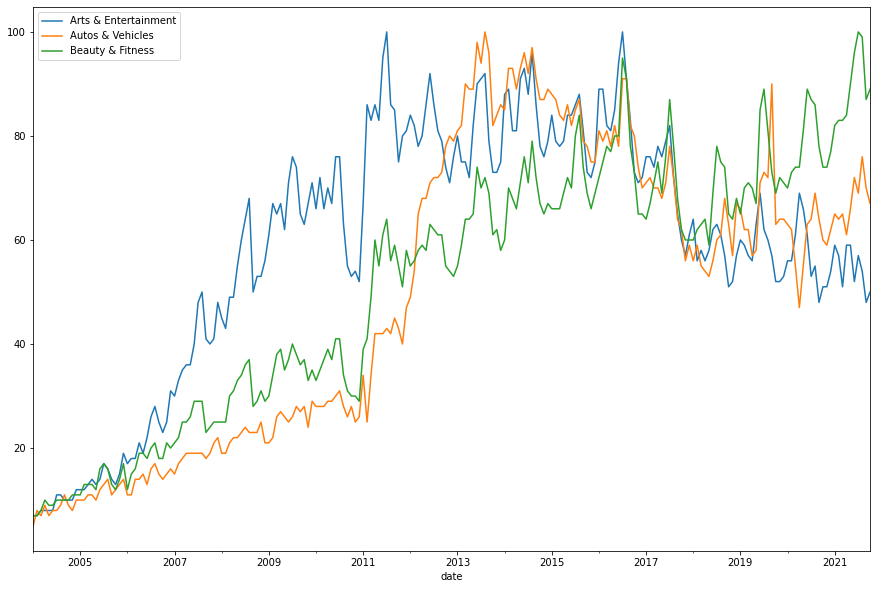

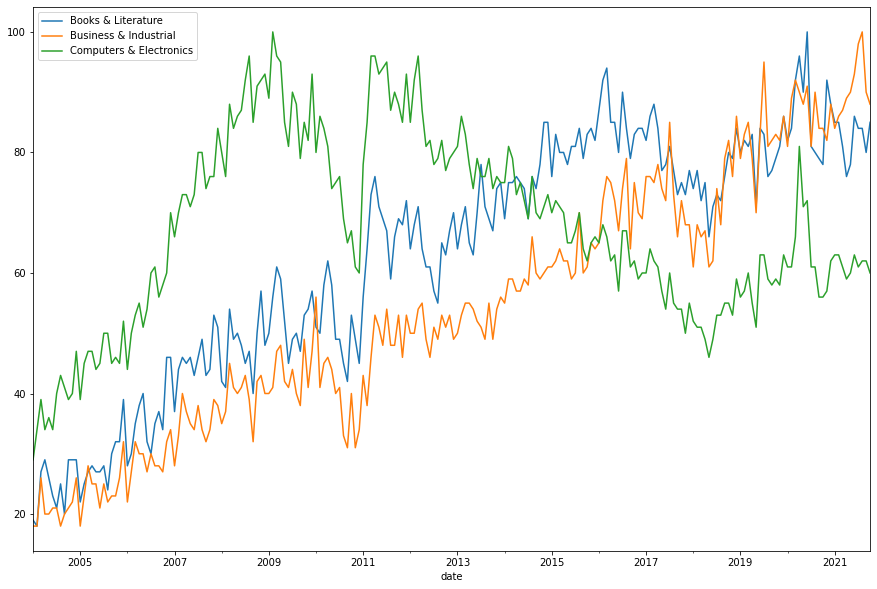

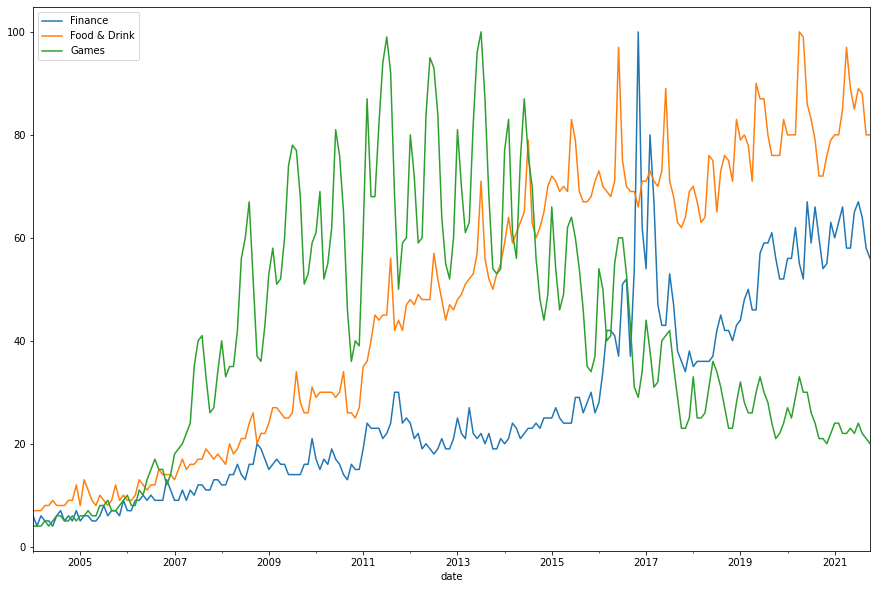

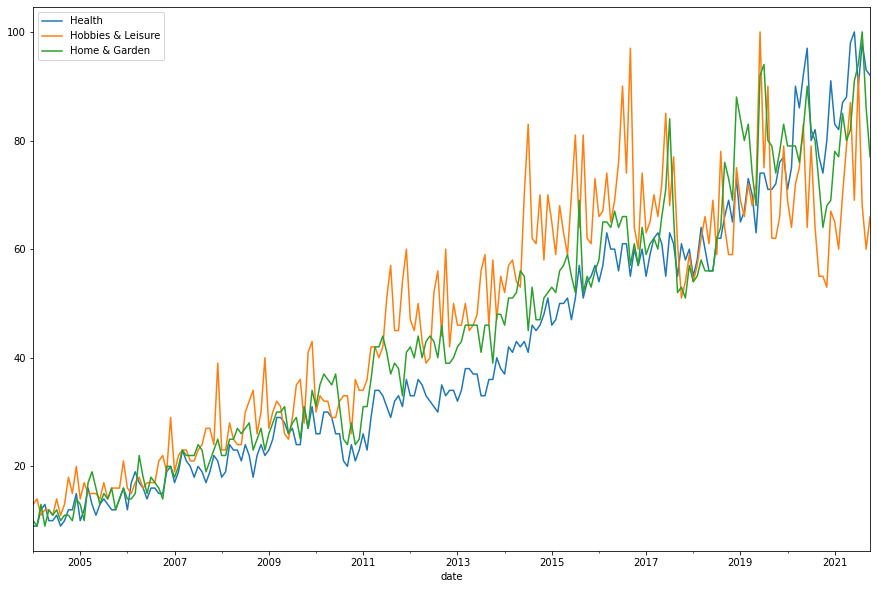

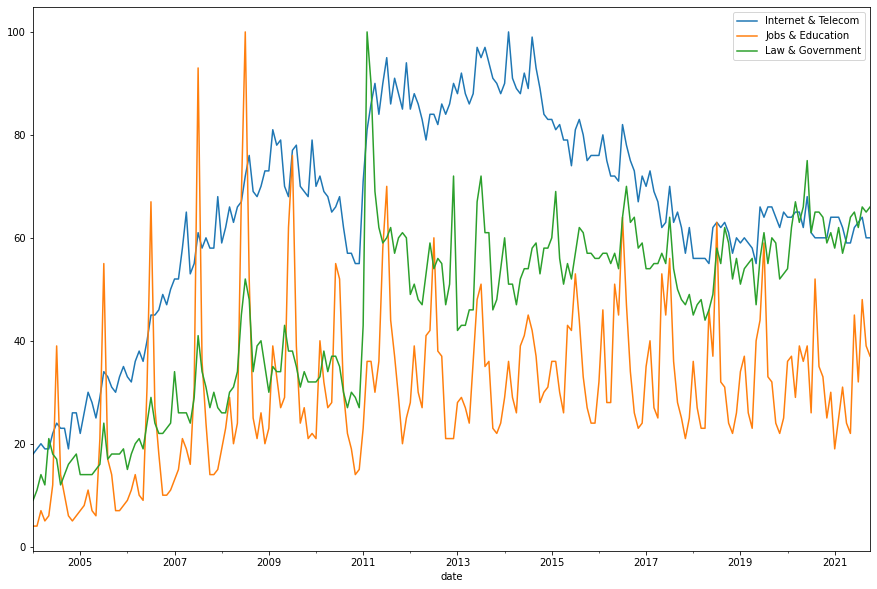

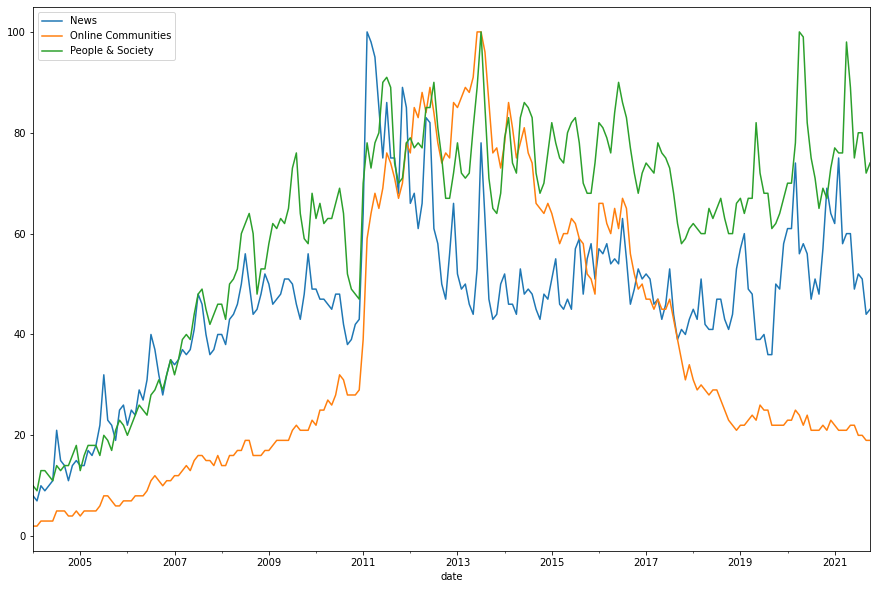

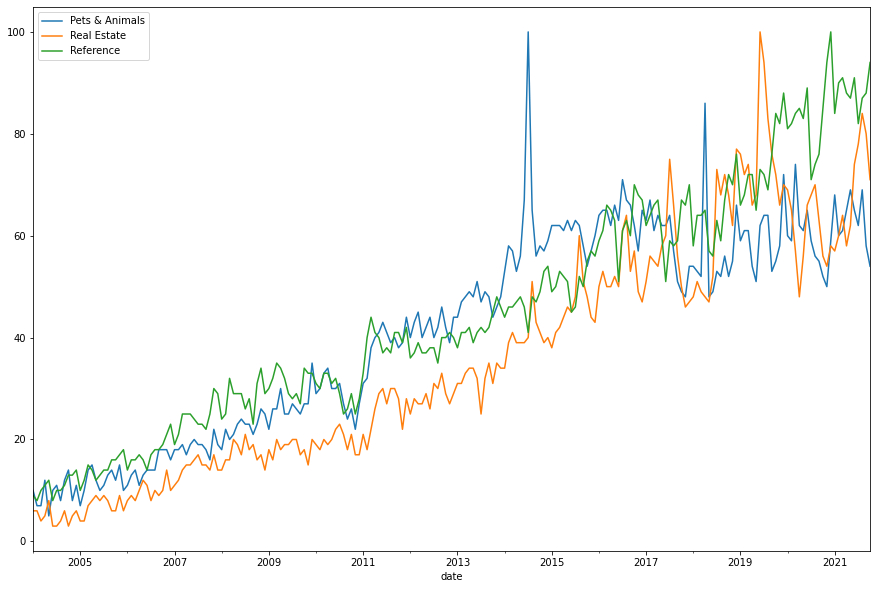

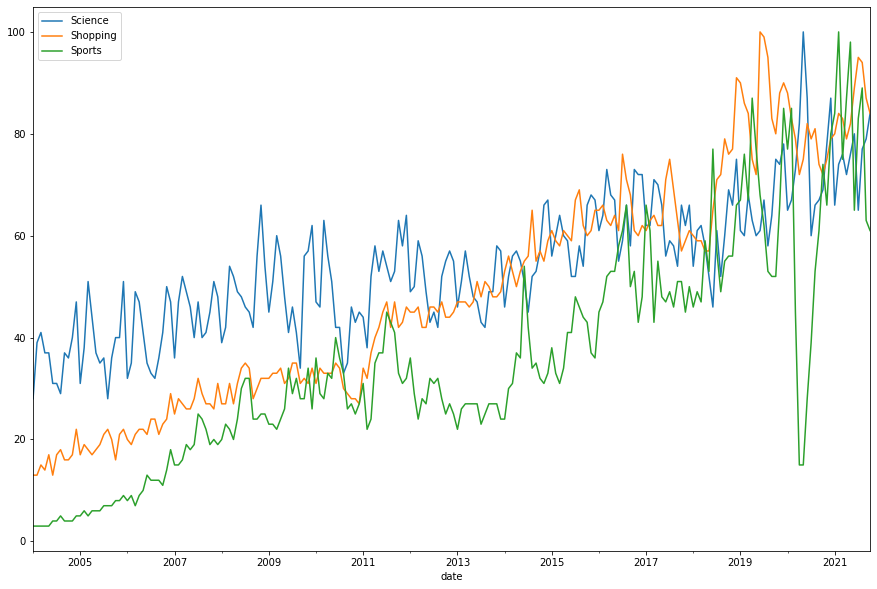

In [ ]:
for i in range(1,23,3):
  df.plot(x="date",y=[i,i+1,i+2],figsize=(15,10))

- We notice almost all graphs have a drop in 2011 and we believe it's because of the revolution such as finance, books. While online communities increased in this period because the revolution was largely based on facebook.
- We also notice that there is a drop in luxuries such as art and entertainment and vehicles in 2016 probably because of ta3weem el geneh.
- We can't fully determine the trend of games because we can't decide what exactly is games, is it playstation, online games, xbox? As the demand changes because technology changes.
- Also, we can notice health increases in 2020 due to covid and for example, sports decreases steeply due to the quarantine. Also, books&literature increases, mainly all indoor activities increased in 2020.

In [ ]:
df.set_index("date", inplace = True)

In [ ]:
#setting datetime_is_numeric to true in order to show the date's details
description=df.describe(datetime_is_numeric=True).transpose().sort_values("mean")
description

,count,mean,std,min,25%,50%,75%,max
Finance,214.0,27.612150,18.789270,4.0,14.00,22.0,41.75,100.0
Jobs & Education,214.0,30.294393,15.442222,4.0,21.25,28.0,37.00,100.0
Real Estate,214.0,35.200935,22.615417,3.0,17.00,30.5,52.00,100.0
Sports,214.0,35.579439,21.522142,3.0,22.25,32.0,49.00,100.0
Online Communities,214.0,36.822430,27.080410,2.0,16.00,25.0,62.00,100.0
Travel,214.0,40.588785,18.491187,13.0,27.00,36.0,50.00,100.0
Games,214.0,40.841121,24.253803,4.0,23.00,36.0,59.75,100.0
Pets & Animals,214.0,41.135514,20.163076,5.0,22.00,44.0,59.00,100.0
Health,214.0,41.453271,23.679693,9.0,22.00,34.0,60.00,100.0
Reference,214.0,44.560748,22.916946,8.0,27.25,41.0,63.00,100.0


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24],
 <a list of 25 Text major ticklabel objects>)

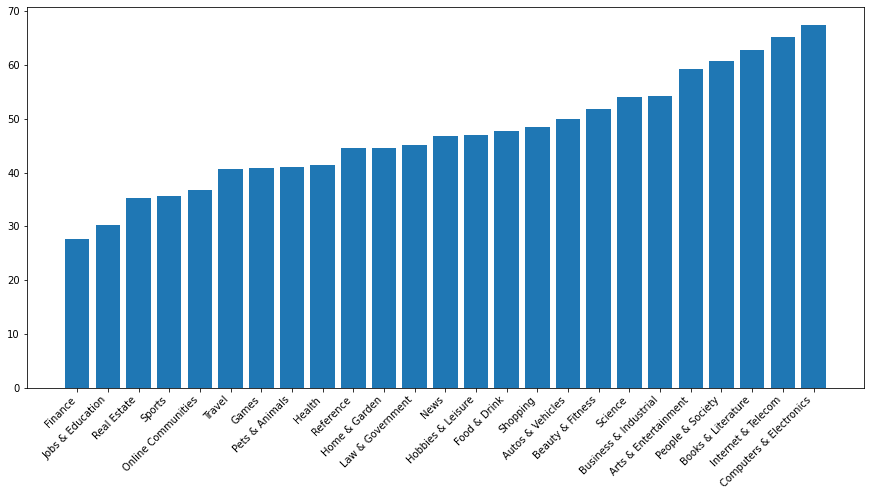

In [ ]:
description.reset_index(inplace=True)
plt.figure(figsize=(15, 7))
plt.bar(x=description["index"],height=description["mean"])
plt.xticks(rotation=45, ha='right')

After plotting the mean value for each category we can notice that the highest means are in the "internet & telecom" and "Computer & electronics" categories which shows an overall a growing interest in the tech field.

### Seasonal decomposition

Arts & Entertainment


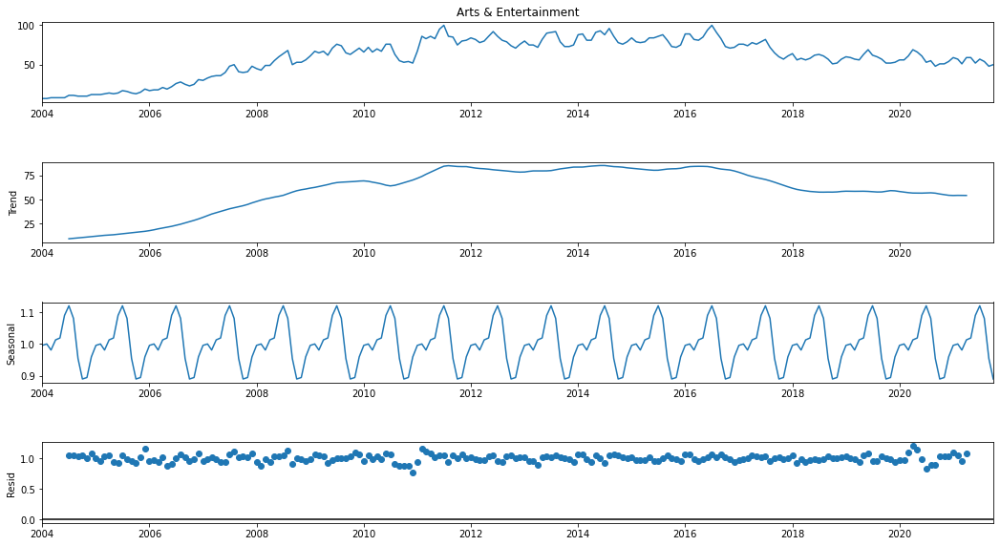

Autos & Vehicles


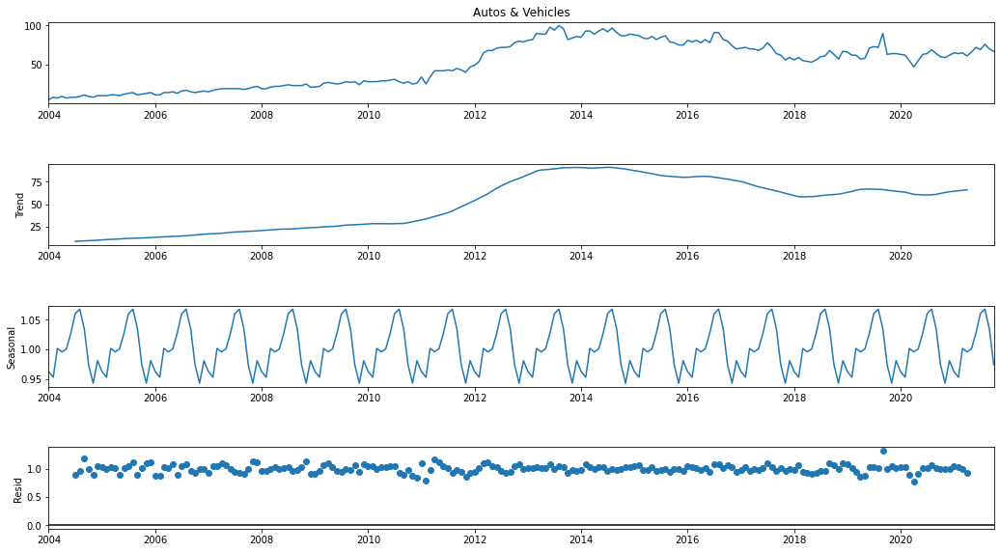

Beauty & Fitness


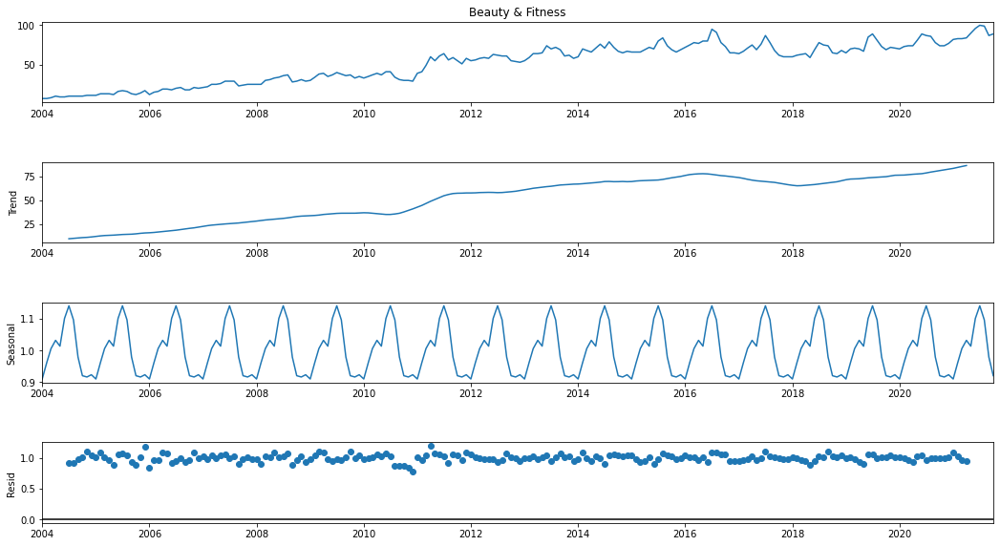

Books & Literature


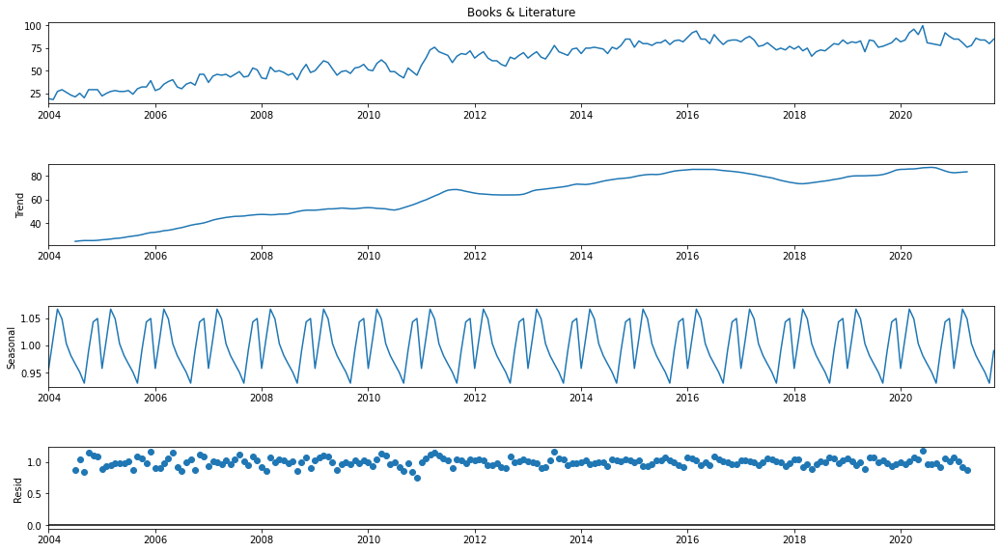

Business & Industrial


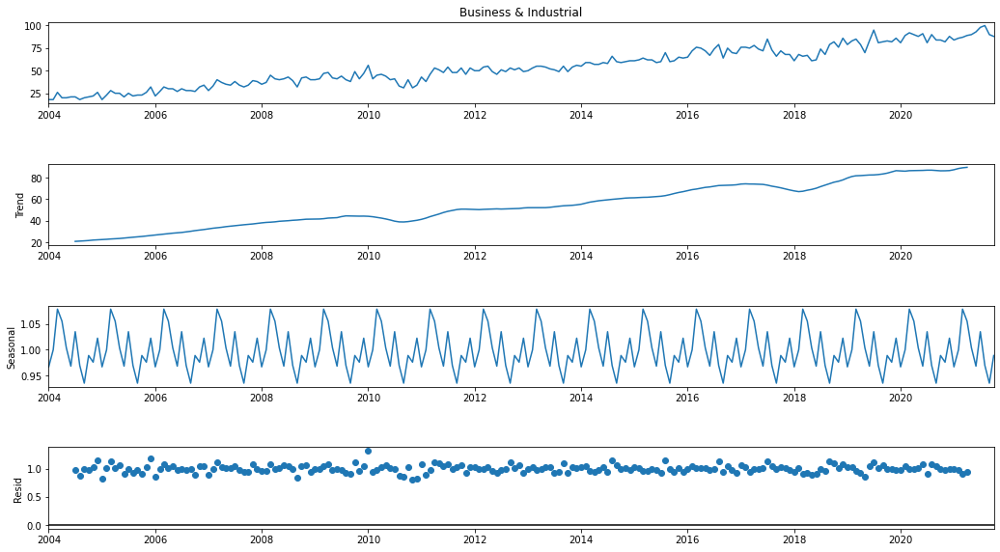

Computers & Electronics


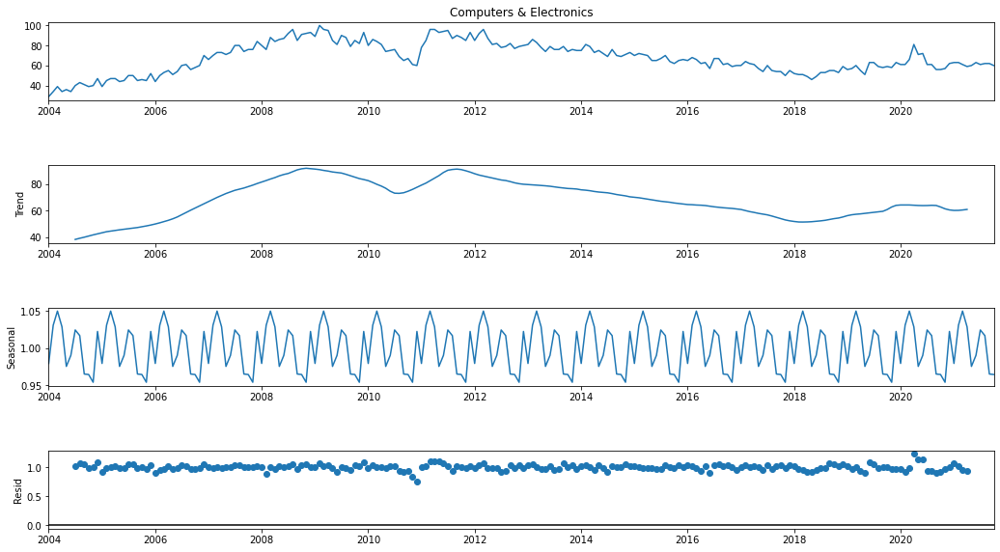

Finance


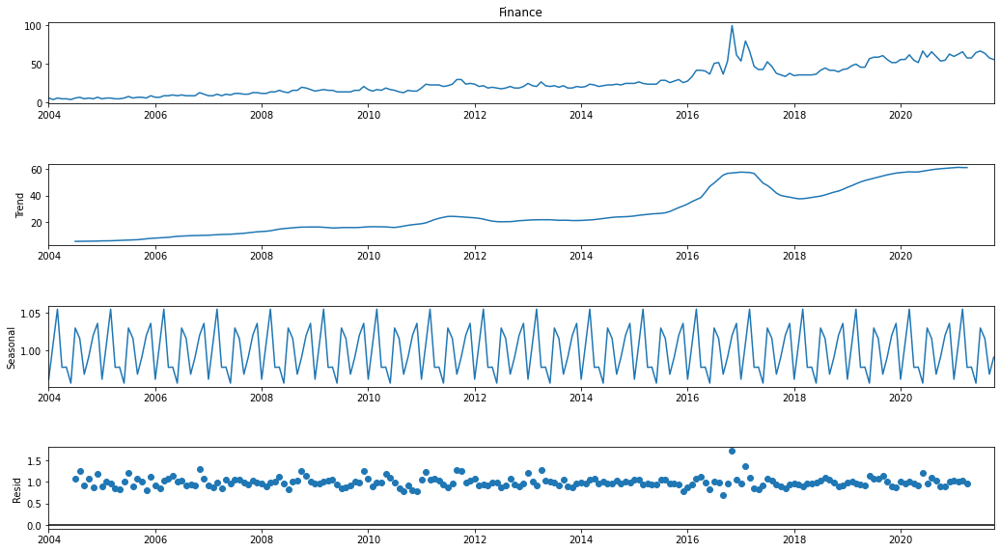

Food & Drink


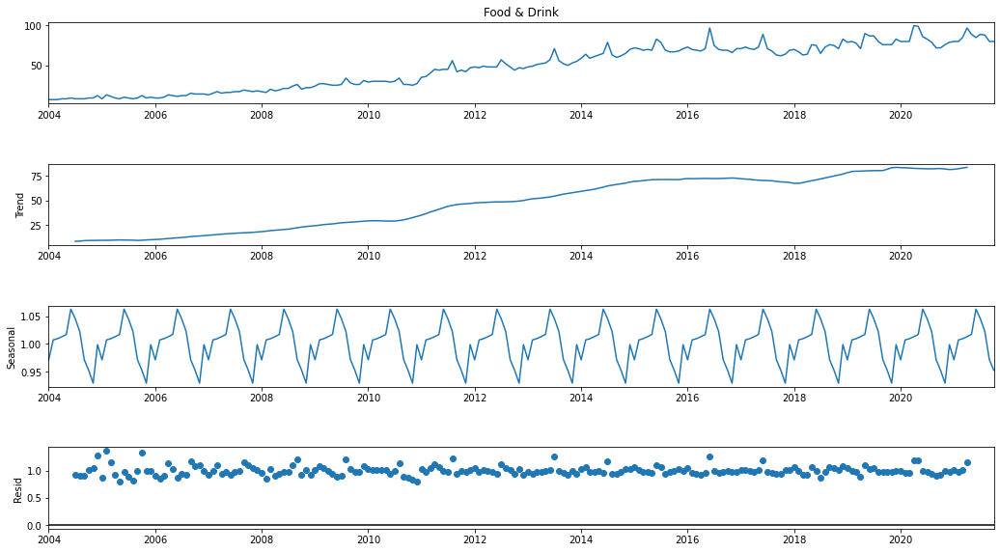

Games


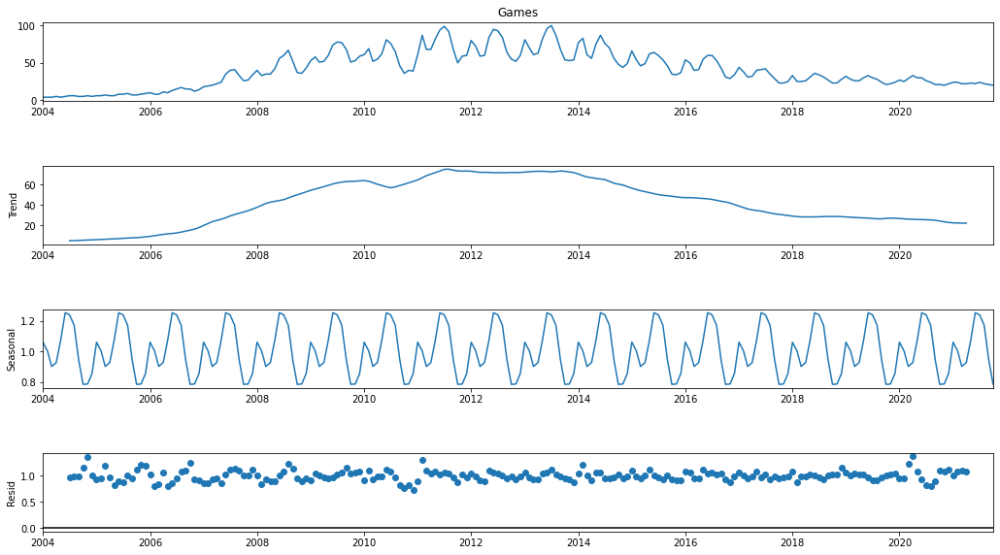

Health


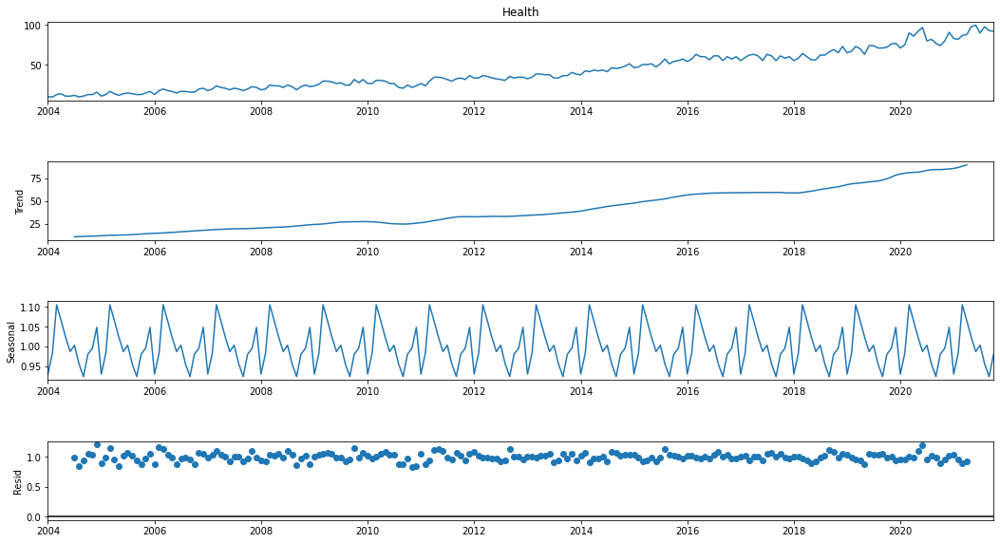

Hobbies & Leisure


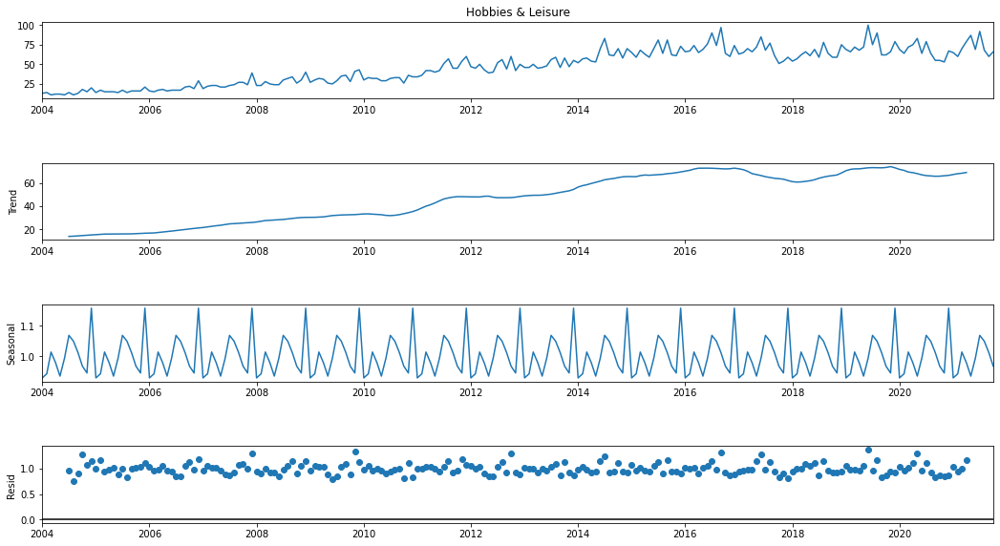

Home & Garden


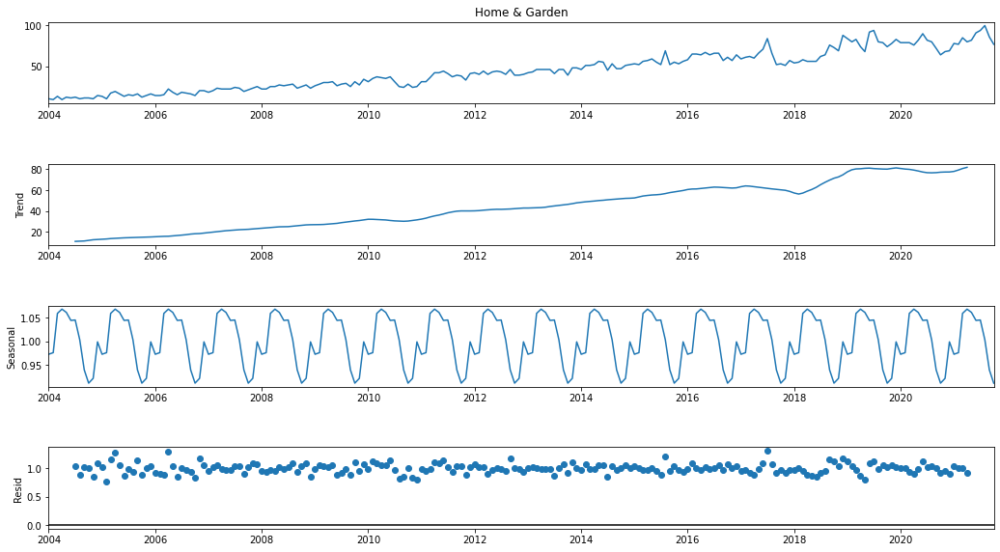

Internet & Telecom


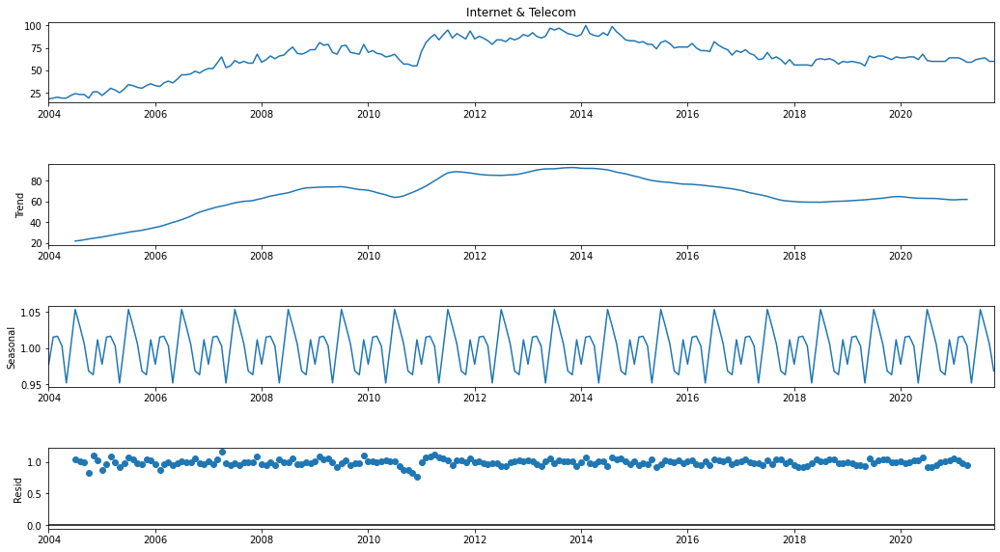

Jobs & Education


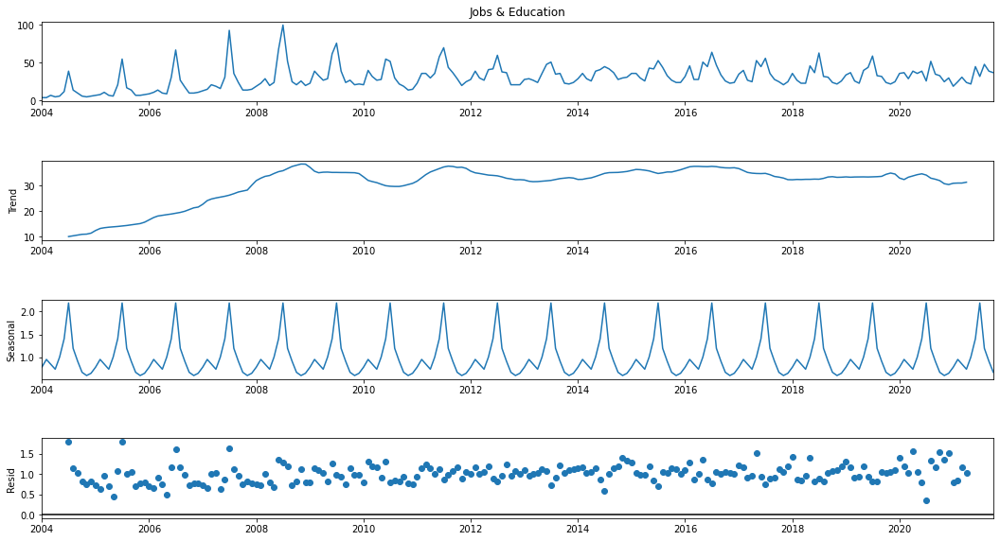

Law & Government


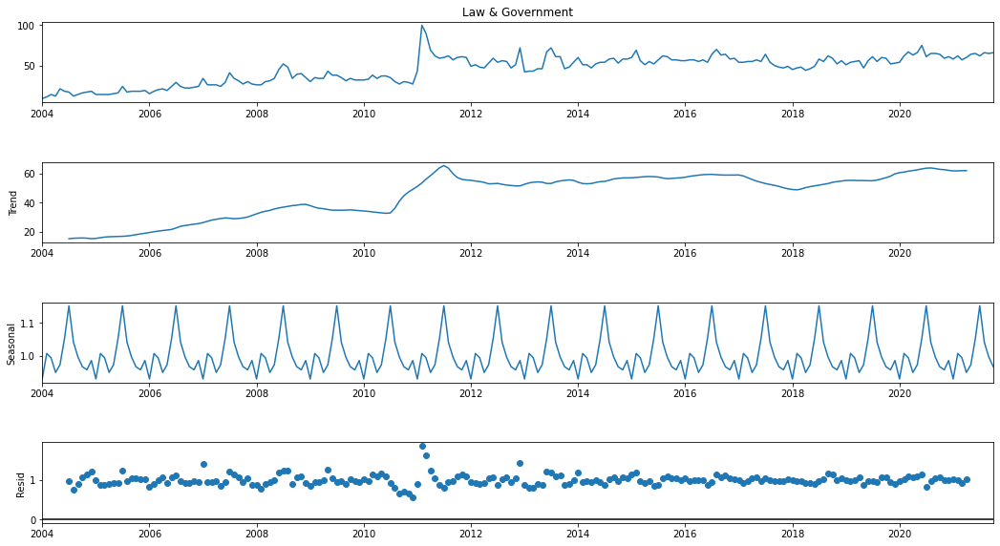

News


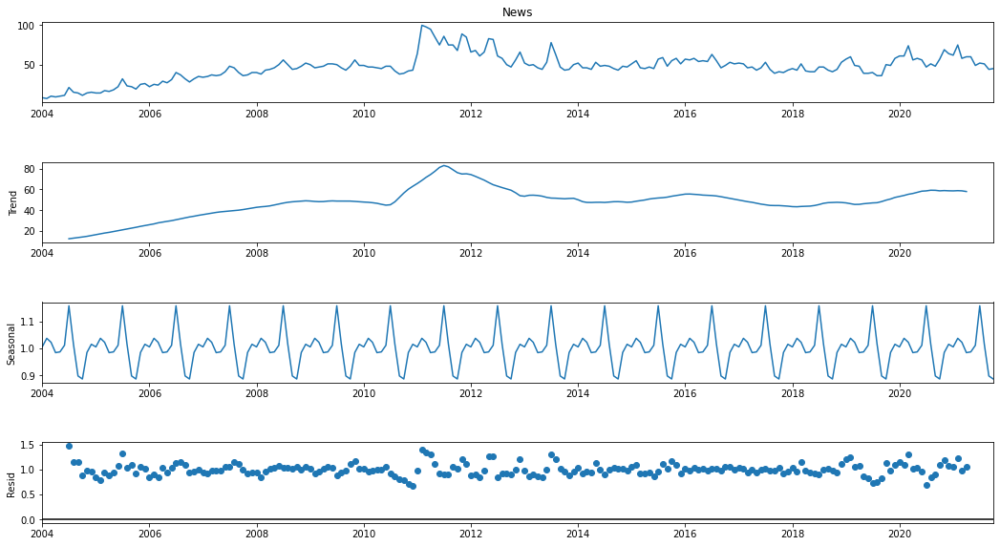

Online Communities


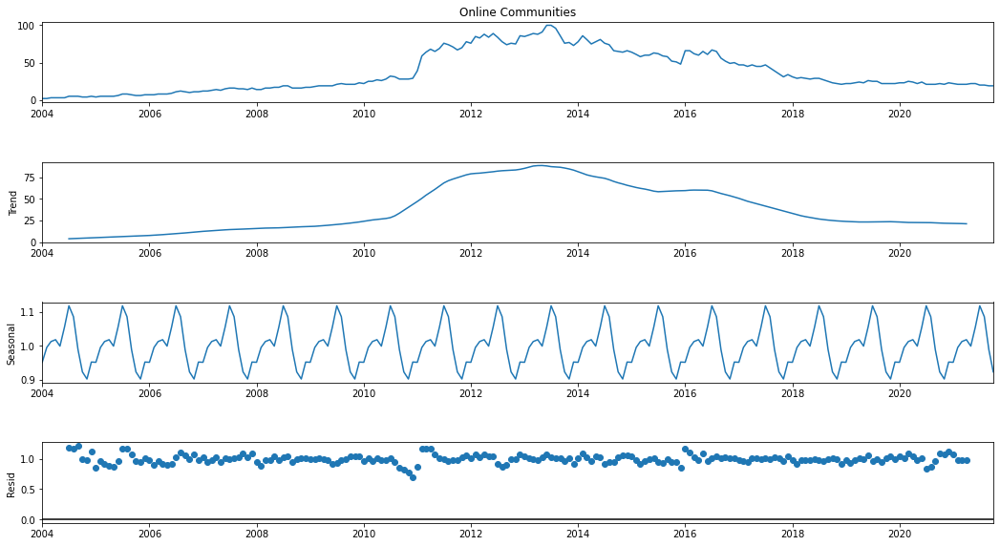

People & Society


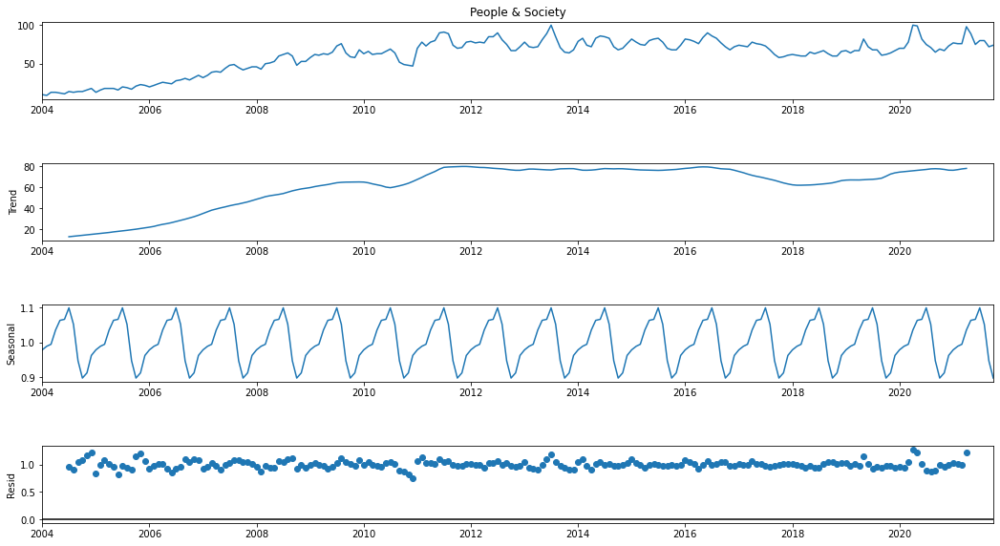

Pets & Animals


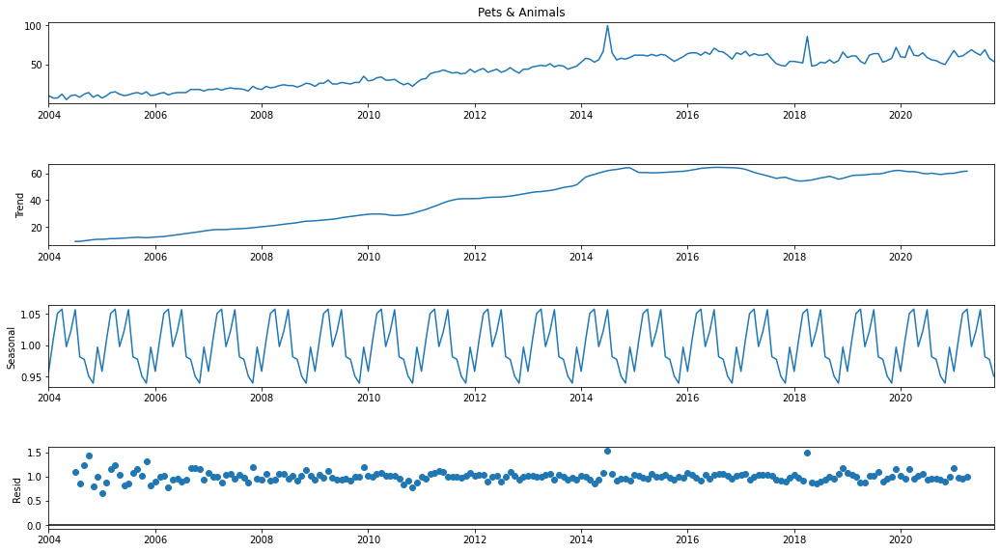

Real Estate


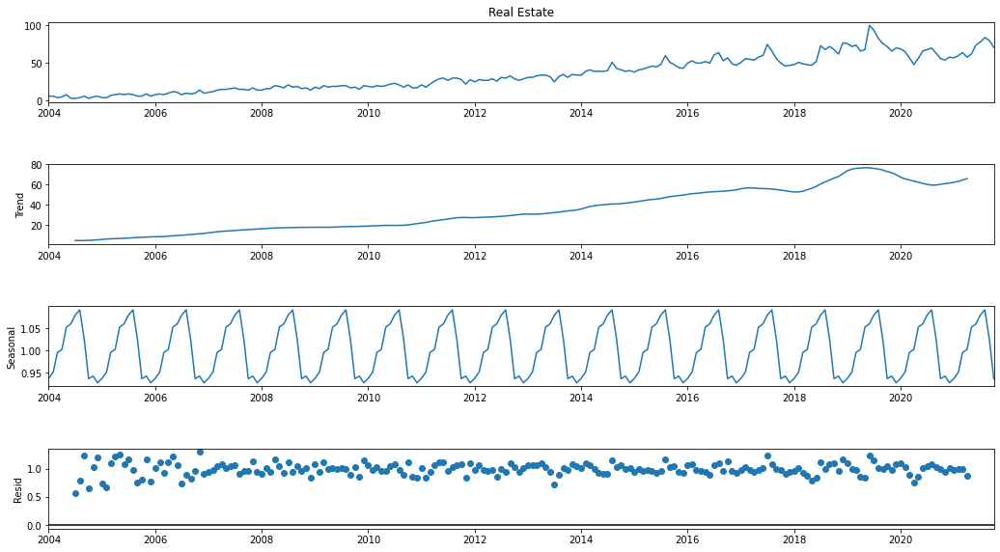

Reference


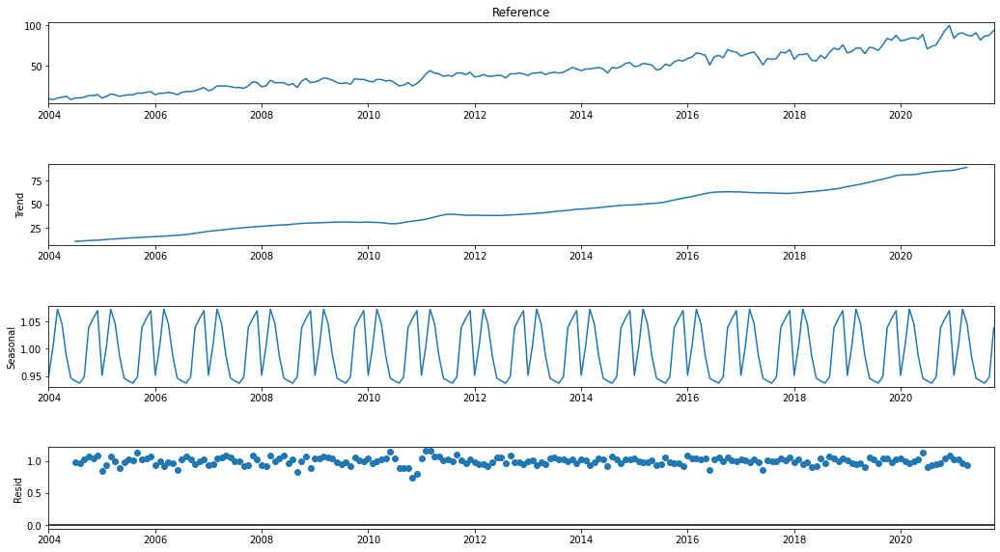

Science


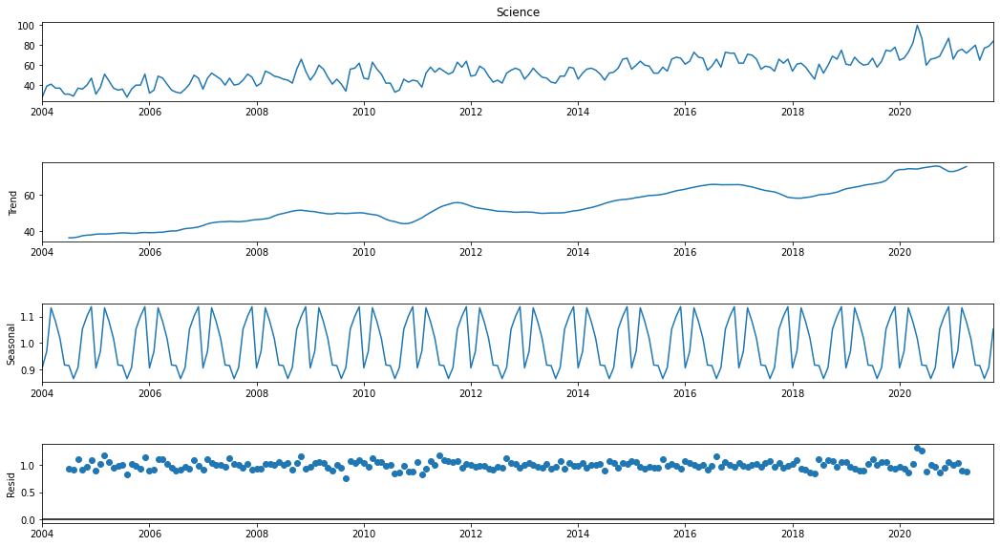

Shopping


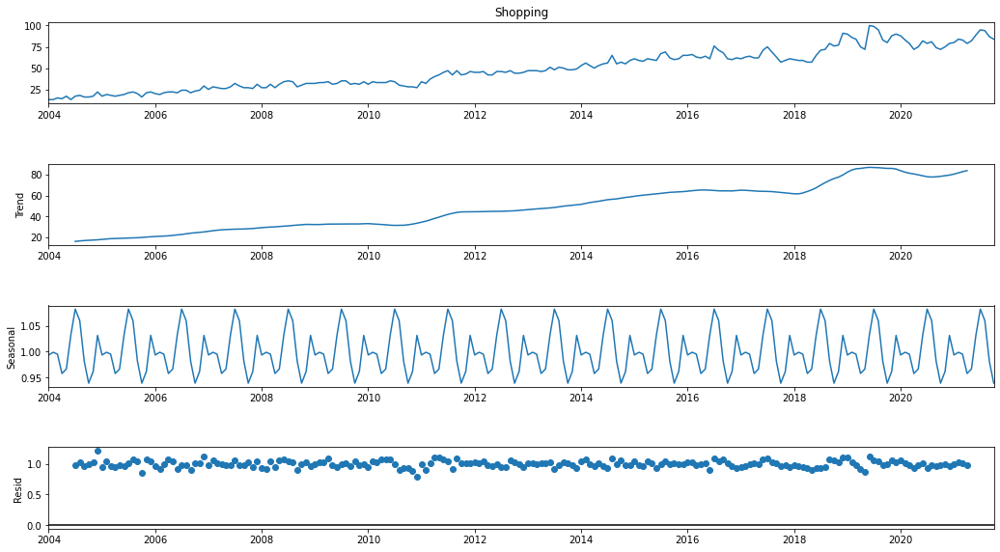

Sports


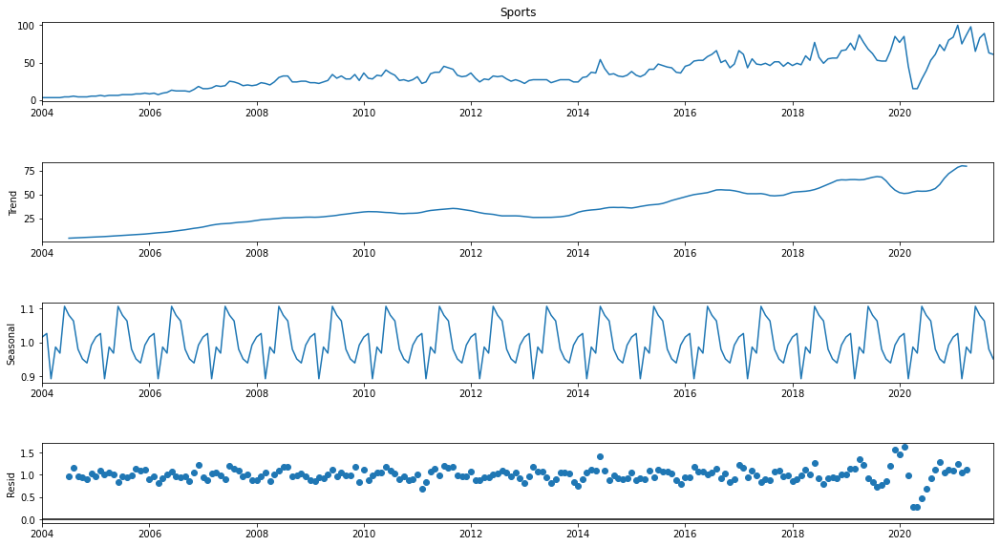

Travel


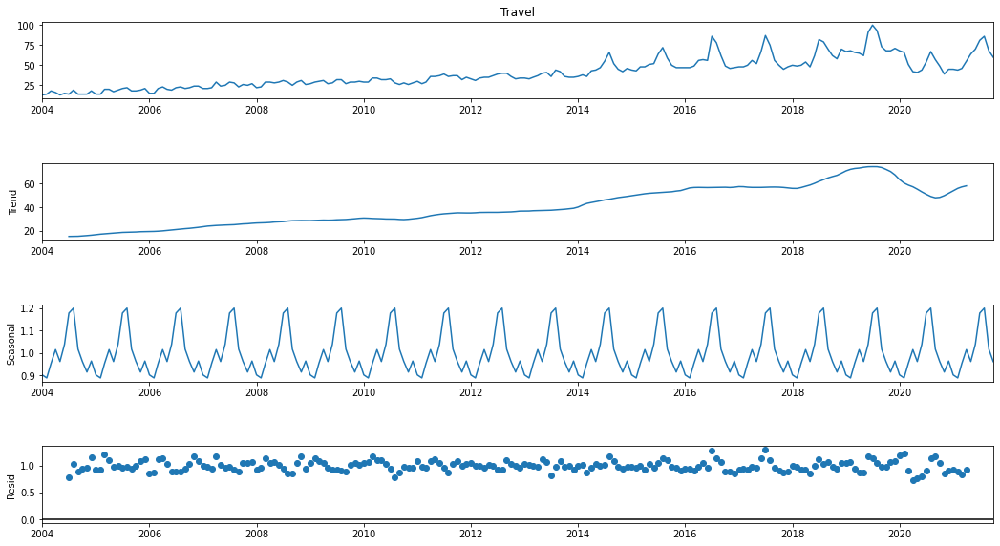

In [ ]:
#df.set_index('date', inplace=True)
for col in df.columns: 
  result = seasonal_decompose(df[col], model='multiplicative')
  print(col)
  result.plot().set_size_inches((16, 9))
  pyplot.show()

This shows the same trends discussed earlier but with more details and a clearer representation of how the trend increases and decreases throughout the seasons

Auto &vehichles: very slow increase followed by a very steep increase starting from 2011 while the rest are increasing in almost a uniform manner

computer and electronics: increase followed by a drop and then an increase followed by a drop again

Finance: slow increase and then a steep increase with a sudden drop

Travel: the seasonal graph peeks uniformly (indicates time when people travel)

### Correlation

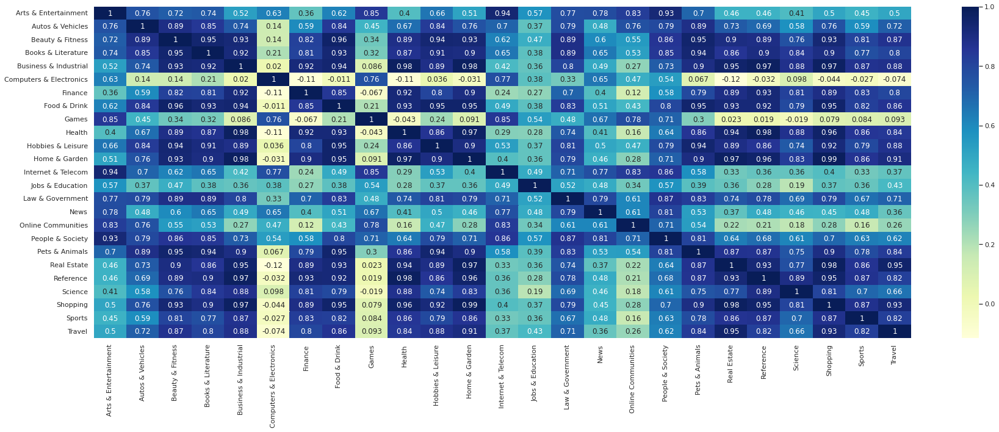

In [ ]:
#Correlation investigation - correlation charts
corr = df.corr()
sns.set(rc = {'figure.figsize':(30,10)})
dataplot = sns.heatmap(corr, cmap="YlGnBu", annot=True)

We can notice that the darker the color is the more correleated the features are. We also see the diagonal is of correleation 1 which makes sense because this shows that the correleation of the feature with itself is the highest. 

For example, the correleation of health and reference is 0.98 which is a very dark color. While the correleation between games and reference is 0.019 with a very light color.

In [ ]:
#finding colums with high correlation and removing them
columns = np.full((corr.shape[0]),False, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.9 or corr.iloc[i,j]<=-0.9:
           #print(df.columns[i+1]," , ",df.columns[j+1])
           if columns[i] == False:
              columns[i] = True
              columns[j] = True
# df2=df.drop(labels="date",axis=1)
selected_columns = df.columns[columns]
df2 = df[selected_columns]
print(columns)
df2.info()

[ True False  True  True  True False  True  True False  True  True  True
  True False False False False False False  True  True False  True False
  True]
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 214 entries, 2004-01-01 to 2021-10-01
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype
---  ------                 --------------  -----
 0   Arts & Entertainment   214 non-null    int64
 1   Beauty & Fitness       214 non-null    int64
 2   Books & Literature     214 non-null    int64
 3   Business & Industrial  214 non-null    int64
 4   Finance                214 non-null    int64
 5   Food & Drink           214 non-null    int64
 6   Health                 214 non-null    int64
 7   Hobbies & Leisure      214 non-null    int64
 8   Home & Garden          214 non-null    int64
 9   Internet & Telecom     214 non-null    int64
 10  Real Estate            214 non-null    int64
 11  Reference              214 non-null    int64
 12  Shopping         

We notice that the correlation between these features are high, either positively or negatively so, we plot a scatter plot to show the correlation and drop the columns on the left.

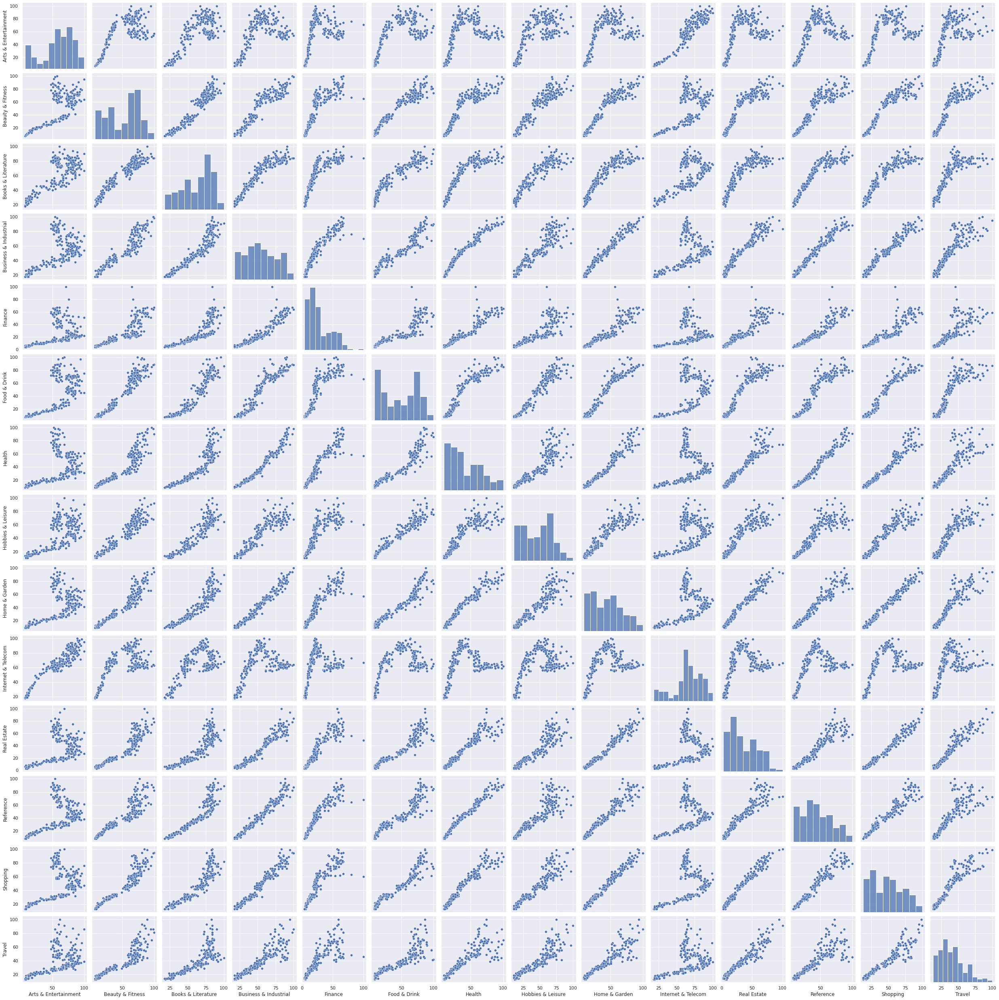

In [ ]:
sns.pairplot(df2)

In [ ]:
columns = [not y for y in columns]
selected_columns = df.columns[columns]
newdf = df[selected_columns]
newdf.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 214 entries, 2004-01-01 to 2021-10-01
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Autos & Vehicles         214 non-null    int64
 1   Computers & Electronics  214 non-null    int64
 2   Games                    214 non-null    int64
 3   Jobs & Education         214 non-null    int64
 4   Law & Government         214 non-null    int64
 5   News                     214 non-null    int64
 6   Online Communities       214 non-null    int64
 7   People & Society         214 non-null    int64
 8   Pets & Animals           214 non-null    int64
 9   Science                  214 non-null    int64
 10  Sports                   214 non-null    int64
dtypes: int64(11)
memory usage: 20.1 KB


In [ ]:
newdf.head()

,Autos & Vehicles,Computers & Electronics,Games,Jobs & Education,Law & Government,News,Online Communities,People & Society,Pets & Animals,Science,Sports
date,,,,,,,,,,,
2004-01-01,5,29,4,4,9,8,2,10,10,28,3
2004-02-01,8,34,4,4,11,7,2,9,7,39,3
2004-03-01,7,39,4,7,14,10,3,13,7,41,3
2004-04-01,9,34,5,5,12,9,3,13,12,37,3
2004-05-01,7,36,4,6,21,10,3,12,5,37,3


This is the new dataframe after removing the correlated features.

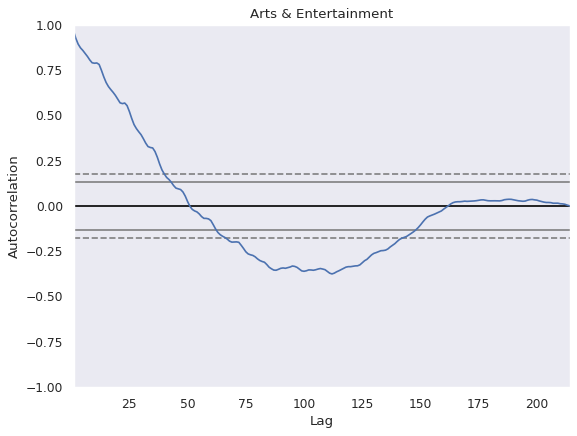

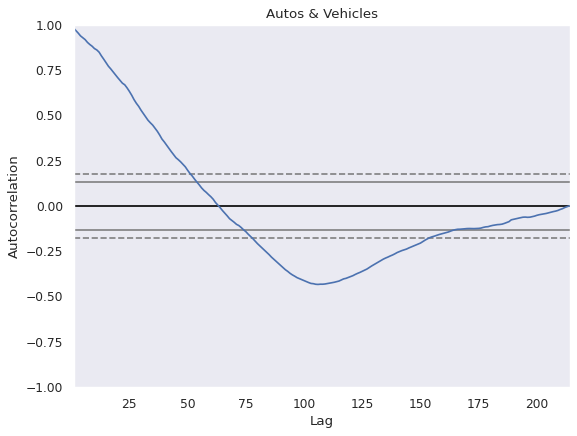

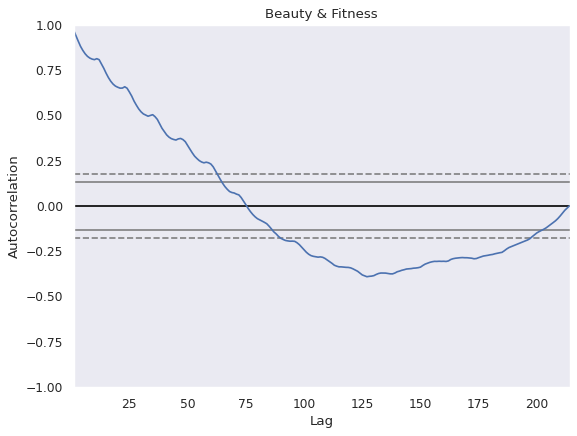

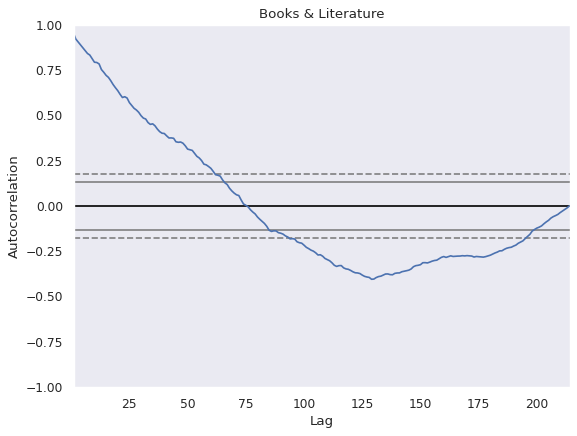

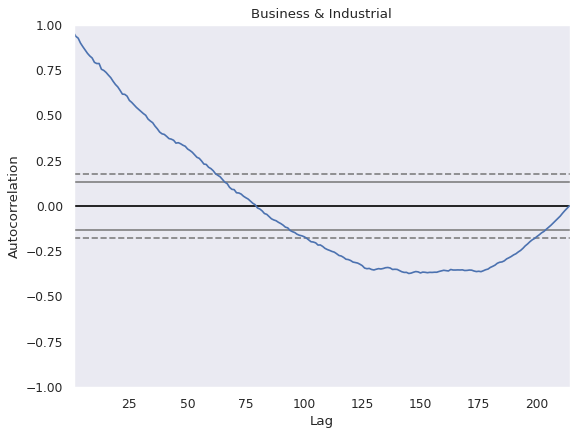

...

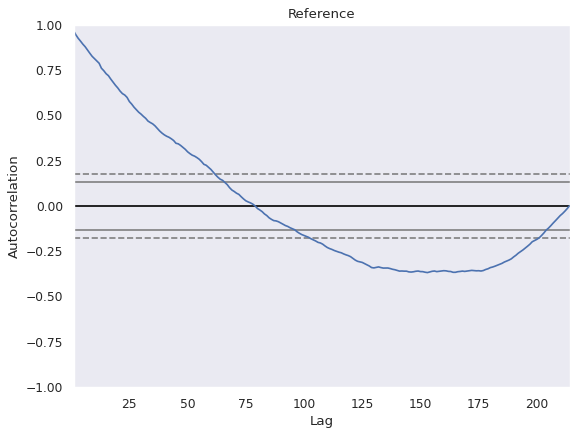

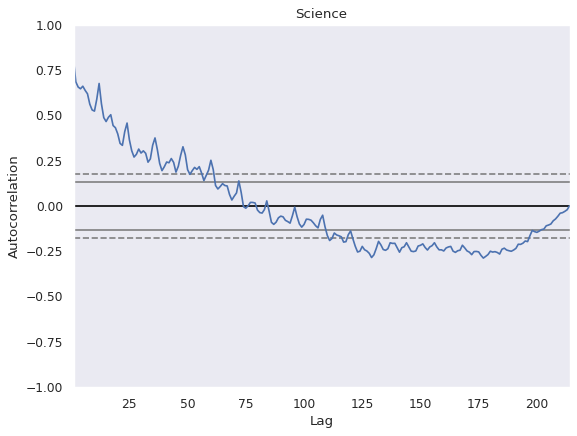

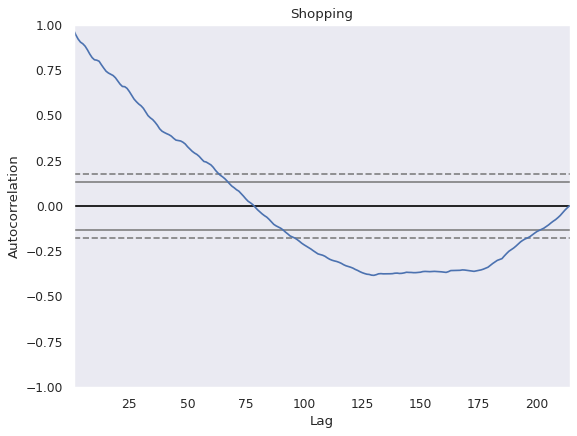

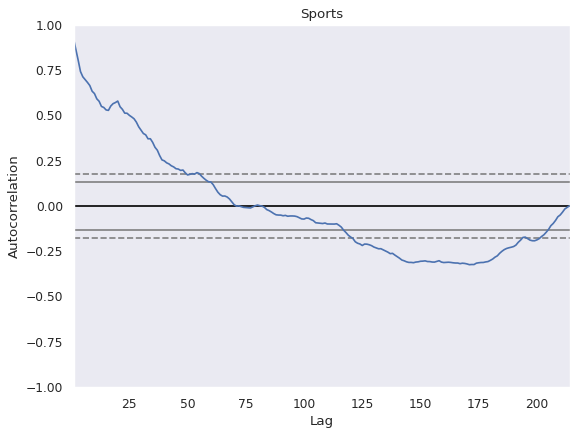

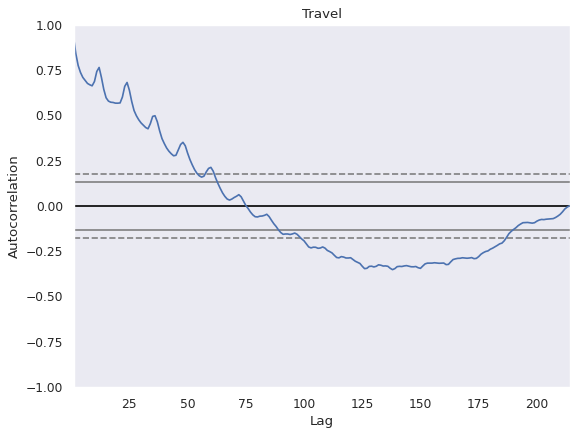

In [ ]:
# df.set_index('date', inplace=True)

df.index.to_pydatetime()
for col in df.columns:
  figure(figsize=(8, 6), dpi=80)
  x = pd.plotting.autocorrelation_plot(df[col])
  plt.title(col)
  x.plot(figsize=(1,1))
  plt.show()

### Hypothesis Testing

Text(0.5, 0, 'Date')

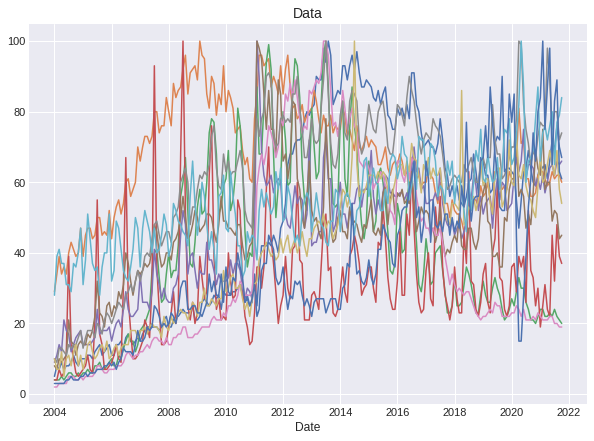

In [ ]:
# checking stationary or not
plt.style.use('seaborn-darkgrid')

# Plot the time series
plt.figure(figsize=(10, 7))
plt.plot(newdf)
plt.title('Data', fontsize=14)
plt.xlabel('Date', fontsize=12)

From the graph, we deduce that the data is not stationary and it's shown in the acf and pacf more.

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (T

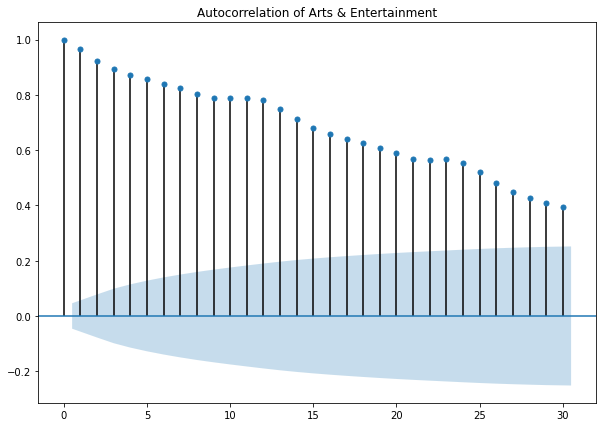

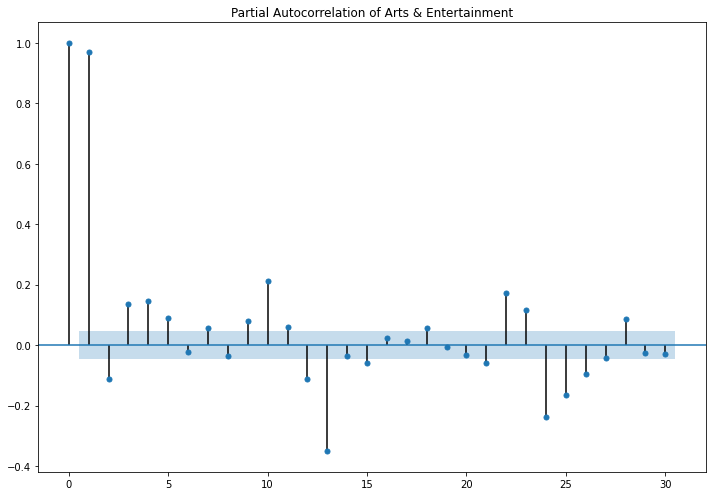

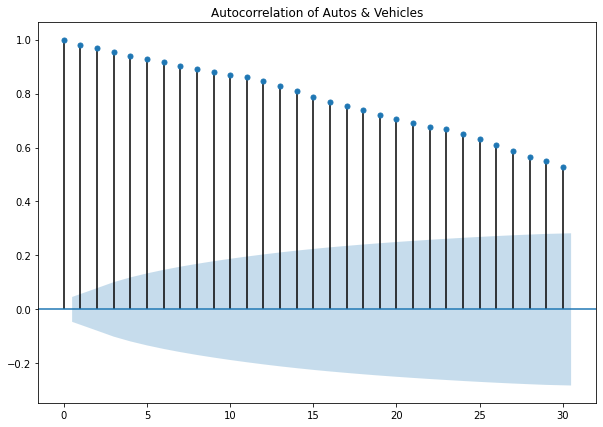

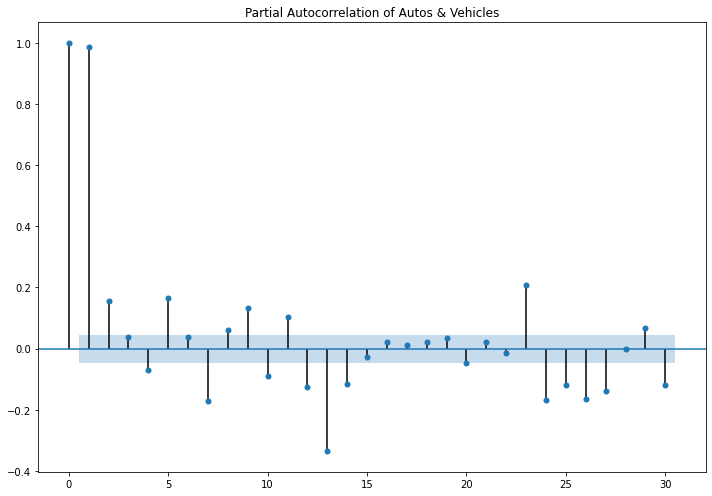

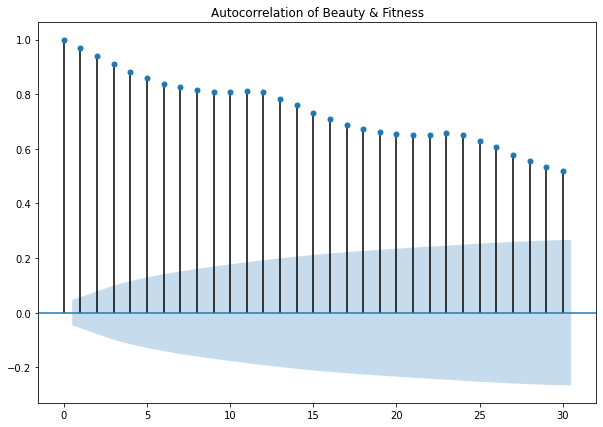

...

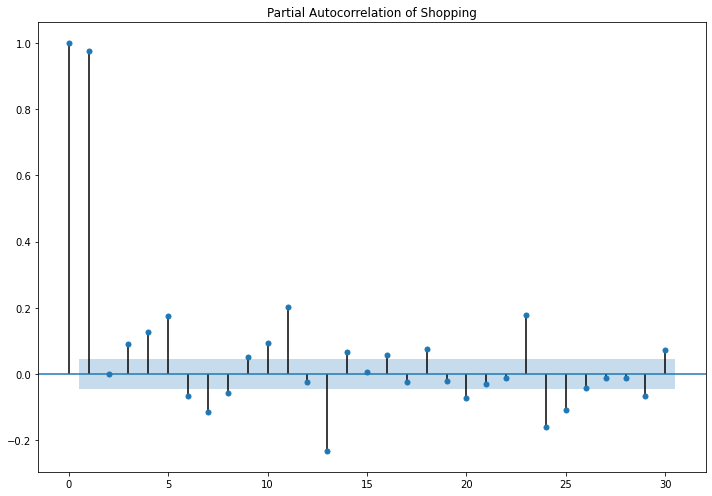

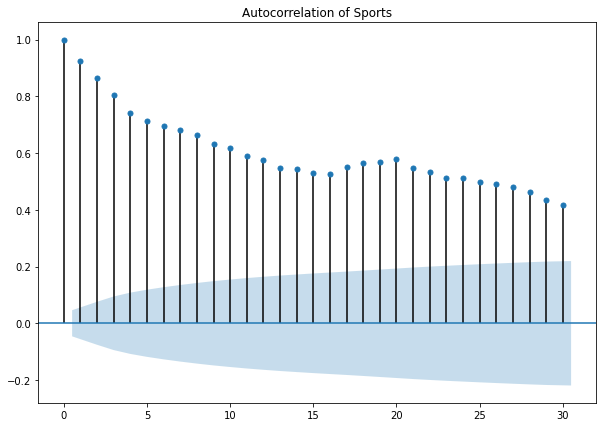

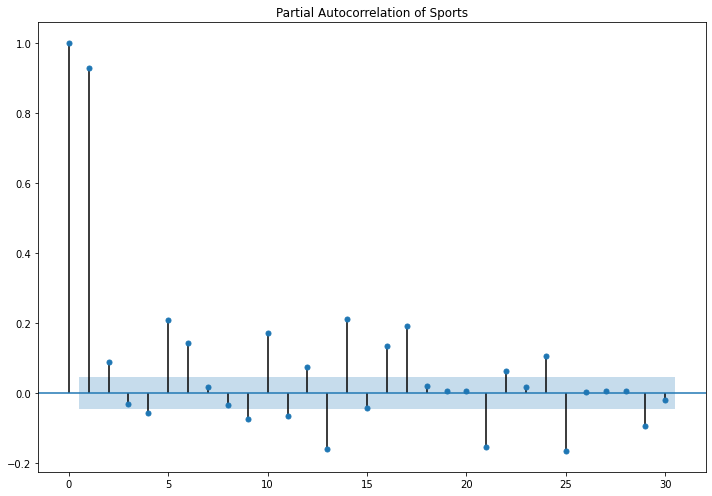

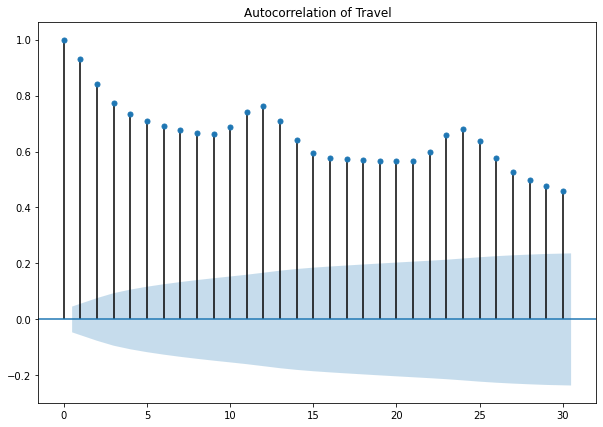

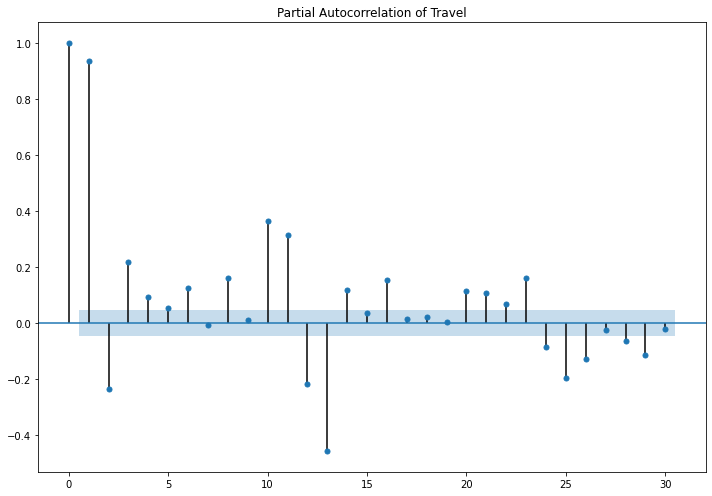

In [ ]:
#plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
#autocorrelation_plot(df.values.tolist())

# fig, axes = plt.subplots(1, 2, sharey=False, sharex=False)
# fig.set_figwidth(12)
# fig.set_figheight(4)

for col in df.columns:
  title= "Autocorrelation of "+ col
  smt.graphics.plot_acf(df[col], lags=30,  alpha=0.5).set_size_inches((10, 7))
  plt.title(title)
  smt.graphics.plot_pacf(df[col], lags=30, alpha=0.5).set_size_inches((10, 7))
  title= "Partial Autocorrelation of "+ col
  plt.title(title)
  plt.tight_layout()
  


Since the autocorrelation changes as time goes by for all the variables so we can deduce that it's not stationary and take that into consideration when deciding on the models and preparing the data.

In [ ]:
# Augmented Dickey Fuller test (ADH Test) Stationary test
df.set_index('date', inplace=True)
for col in df.columns:
  print(col)
  result = adfuller(df[col], autolag='AIC')
  print(f'ADF Statistic: {result[0]}')
  print(f'p-value: {result[1]}')
  for key, value in result[4].items():
      print('Critial Values:')
      print(f'   {key}, {value}')


Arts & Entertainment
ADF Statistic: -2.2967476975815906
p-value: 0.17301904942436985
Critial Values:
   1%, -3.4633090972761744
Critial Values:
   5%, -2.876029332045744
Critial Values:
   10%, -2.5744932593252643
Autos & Vehicles
ADF Statistic: -1.6974413537524915
p-value: 0.4324312482459679
Critial Values:
   1%, -3.463476079125
Critial Values:
   5%, -2.876102355
Critial Values:
   10%, -2.574532225
Beauty & Fitness
ADF Statistic: -0.8325156190919353
p-value: 0.8093838001304223
Critial Values:
   1%, -3.4633090972761744
Critial Values:
   5%, -2.876029332045744
Critial Values:
   10%, -2.5744932593252643
Books & Literature
ADF Statistic: -1.9296014860310964
p-value: 0.31826630118074695
Critial Values:
   1%, -3.463476079125
Critial Values:
   5%, -2.876102355
Critial Values:
   10%, -2.574532225
Business & Industrial
ADF Statistic: -0.27912993396260255
p-value: 0.9284085891864603
Critial Values:
   1%, -3.463476079125
Critial Values:
   5%, -2.876102355
Critial Values:
   10%, -2.57

tests the null hypothesis that a unit root is present in a time series sample.

-The p value of the ADF test is really high and the ADF statistics are negative showing that the values are not stationary.

### Outliers

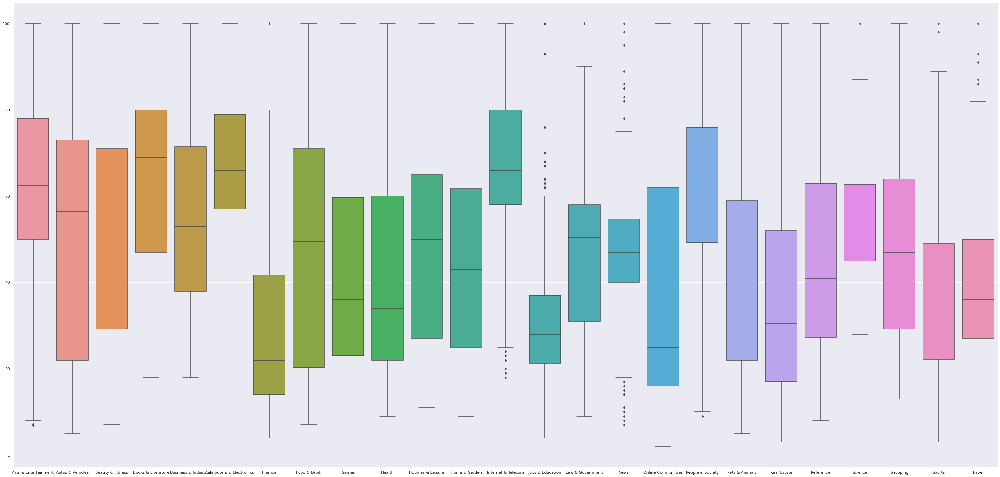

In [ ]:
#box-plot
sns.set(rc={'figure.figsize':(50,24.27)})
display = sns.boxplot(data = df)
plt.show()

The box plot is used to detect outliers so, as seen the dots are outliers in each column.

In [ ]:
#detecting outliers using IQR
#replacing outliers with null values
q1 = df.quantile(0.25)
q3 = df.quantile(0.75)
iqr = q3-q1
min = q1-(1.5*iqr)
max = q3+(1.5*iqr)

for col in df.columns:
   if col == 'date':
    continue
   print("col: ",col,"\t\t", df.loc[df[col] > max[col],col].shape)
   df[col].mask(((df[col] < min[col]) | (df[col] > max[col])), np.nan, inplace=True)
  

col:  Arts & Entertainment 		 (0,)
col:  Autos & Vehicles 		 (0,)
col:  Beauty & Fitness 		 (0,)
col:  Books & Literature 		 (0,)
col:  Business & Industrial 		 (0,)
col:  Computers & Electronics 		 (0,)
col:  Finance 		 (1,)
col:  Food & Drink 		 (0,)
col:  Games 		 (0,)
col:  Health 		 (0,)
col:  Hobbies & Leisure 		 (0,)
col:  Home & Garden 		 (0,)
col:  Internet & Telecom 		 (0,)
col:  Jobs & Education 		 (9,)
col:  Law & Government 		 (1,)
col:  News 		 (10,)
col:  Online Communities 		 (0,)
col:  People & Society 		 (0,)
col:  Pets & Animals 		 (0,)
col:  Real Estate 		 (0,)
col:  Reference 		 (0,)
col:  Science 		 (1,)
col:  Shopping 		 (0,)
col:  Sports 		 (2,)
col:  Travel 		 (6,)


In [ ]:
df.isnull().sum()

Arts & Entertainment        2
Autos & Vehicles            0
Beauty & Fitness            0
Books & Literature          0
Business & Industrial       0
Computers & Electronics     0
Finance                     1
Food & Drink                0
Games                       0
Health                      0
Hobbies & Leisure           0
Home & Garden               0
Internet & Telecom         11
Jobs & Education            9
Law & Government            1
News                       25
Online Communities          0
People & Society            1
Pets & Animals              0
Real Estate                 0
Reference                   0
Science                     1
Shopping                    0
Sports                      2
Travel                      6
dtype: int64

In [ ]:
# dropping null values if available
df.dropna()

,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,Health,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
date,,,,,,,,,,,,,,,,,,,,,
2005-05-01,13.0,10,12,27,25,44,5.0,8,6,11,...,18.0,5,18.0,12,9,12,37.0,18,6.0,17.0
2005-06-01,14.0,12,16,27,21,45,6.0,10,8,13,...,22.0,6,16.0,10,8,13,35.0,19,6.0,19.0
2005-07-01,17.0,13,17,28,25,50,8.0,9,8,14,...,32.0,8,20.0,11,9,14,36.0,21,7.0,21.0
2005-08-01,16.0,14,16,24,22,50,6.0,8,9,13,...,23.0,8,19.0,13,8,14,28.0,22,7.0,22.0
2005-09-01,14.0,11,13,30,23,45,7.0,9,7,12,...,22.0,7,17.0,14,6,16,36.0,20,7.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01,59.0,61,84,76,89,59,58.0,97,22,88,...,60.0,21,98.0,65,58,88,72.0,79,87.0,55.0
2021-06-01,52.0,72,96,86,93,63,65.0,85,22,100,...,49.0,22,75.0,65,74,91,80.0,89,65.0,70.0
2021-07-01,57.0,69,100,84,98,61,67.0,89,24,90,...,52.0,20,80.0,62,78,82,65.0,95,83.0,81.0


If we drop the null values which are the outliers, the data decreases from 214 to 171.

After discovering that the outliers represent 20% of the data we decide to drop the outliers just to view the clean data but based on the model we will decide if we change the amount of removed outliers and whether we are going to impute the values or just drop them.

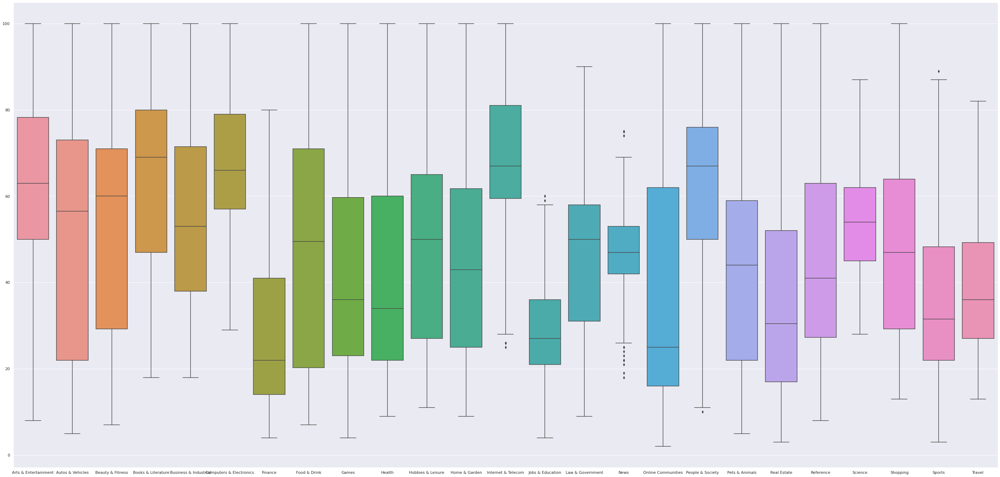

In [ ]:
# box plot after removing outliers
sns.set(rc={'figure.figsize':(50,24.27)})
display = sns.boxplot(data = df)
plt.show()

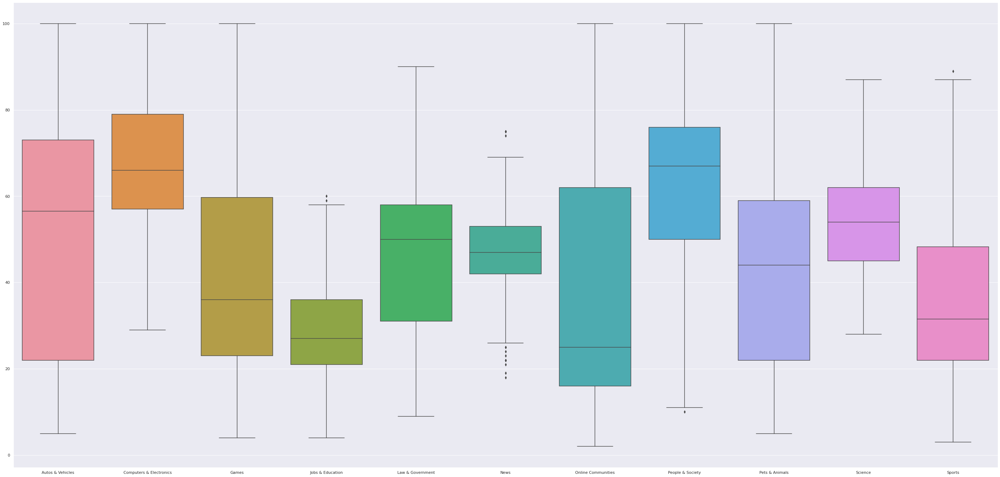

In [ ]:
# box plot after removing outliers and correlated features
sns.set(rc={'figure.figsize':(50,24.27)})
display = sns.boxplot(data = df[selected_columns])
plt.show()

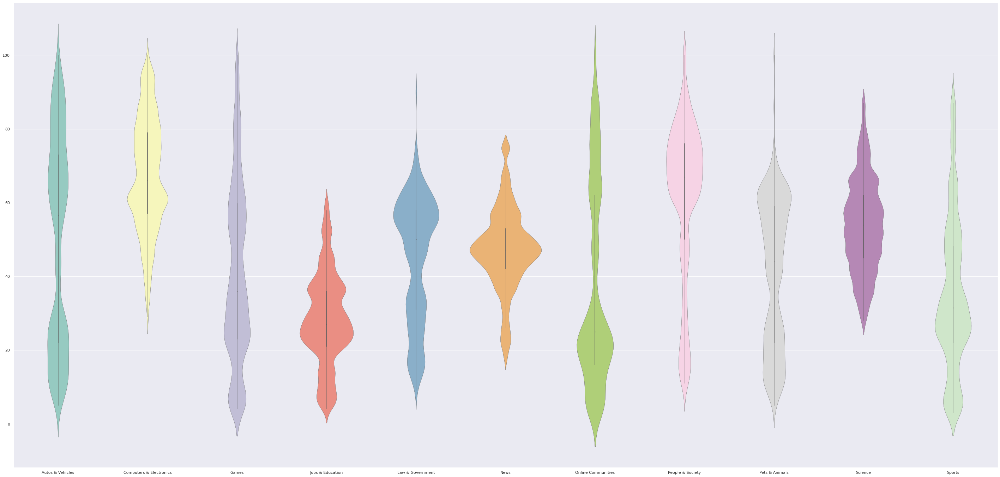

In [ ]:
# violin plot after removing outliers and correlated features
sns.violinplot(data=df[selected_columns], palette="Set3", bw=.15, cut=2, linewidth=0.5)


The violin plot is used to visualize the distribution of the data and the density of each variable unlike the box plot. For example, the news variable has high density in around 50 which shows there is a higher probability for these values to occur.

### Data cleaning/preprocessing

####Log transformation


Log transformation on the original data without removing correleated features and without removing outliers based on this source that says that outliers should be handled with caution and that they shouldn't be dropped.

https://www.researchgate.net/post/Should_outliers_be_removed_before_or_after_data_transformation

In [4]:
transformed_data=df.set_index("date")
for col in transformed_data.columns:
  transformed_data[col] = np.log(transformed_data[col])
transformed_data.head() 

,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,Health,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
date,,,,,,,,,,,,,,,,,,,,,
2004-01-01,1.945910,1.609438,1.945910,2.944439,2.890372,3.367296,1.791759,1.945910,1.386294,2.197225,...,2.079442,0.693147,2.302585,2.302585,1.791759,2.197225,3.332205,2.564949,1.098612,2.564949
2004-02-01,1.945910,2.079442,1.945910,2.890372,2.890372,3.526361,1.386294,1.945910,1.386294,2.197225,...,1.945910,0.693147,2.197225,1.945910,1.791759,2.079442,3.663562,2.564949,1.098612,2.639057
2004-03-01,2.079442,1.945910,2.079442,3.295837,3.258097,3.663562,1.791759,1.945910,1.386294,2.484907,...,2.302585,1.098612,2.564949,1.945910,1.386294,2.302585,3.713572,2.708050,1.098612,2.890372
2004-04-01,2.079442,2.197225,2.302585,3.367296,2.995732,3.526361,1.609438,2.079442,1.609438,2.564949,...,2.197225,1.098612,2.564949,2.484907,1.609438,2.397895,3.610918,2.639057,1.098612,2.772589
2004-05-01,2.079442,1.945910,2.197225,3.258097,2.995732,3.583519,1.609438,2.079442,1.386294,2.302585,...,2.302585,1.098612,2.484907,1.609438,2.079442,2.484907,3.610918,2.833213,1.098612,2.564949


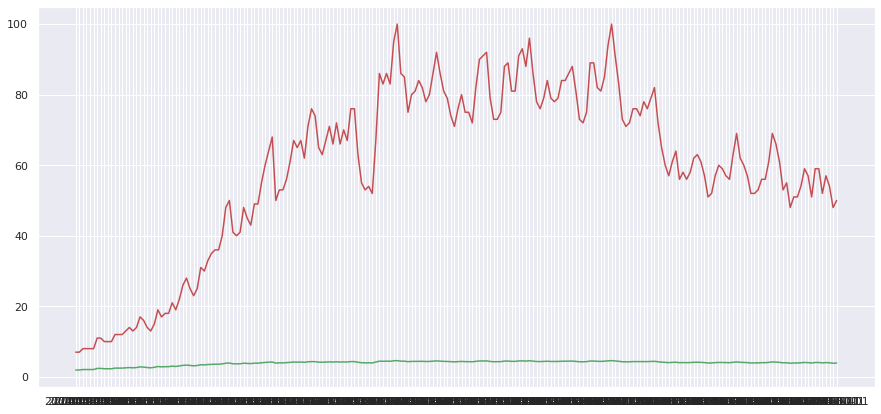

In [ ]:
#Log transformation

transformed_data.reset_index(inplace=True)
plt.figure(figsize=(15, 7))
plt.plot(df["date"], df.iloc[:,1], color='r', label='original data')
plt.plot(transformed_data["date"], transformed_data.iloc[:,1], color='g', label='log transformed data')

plt.show()


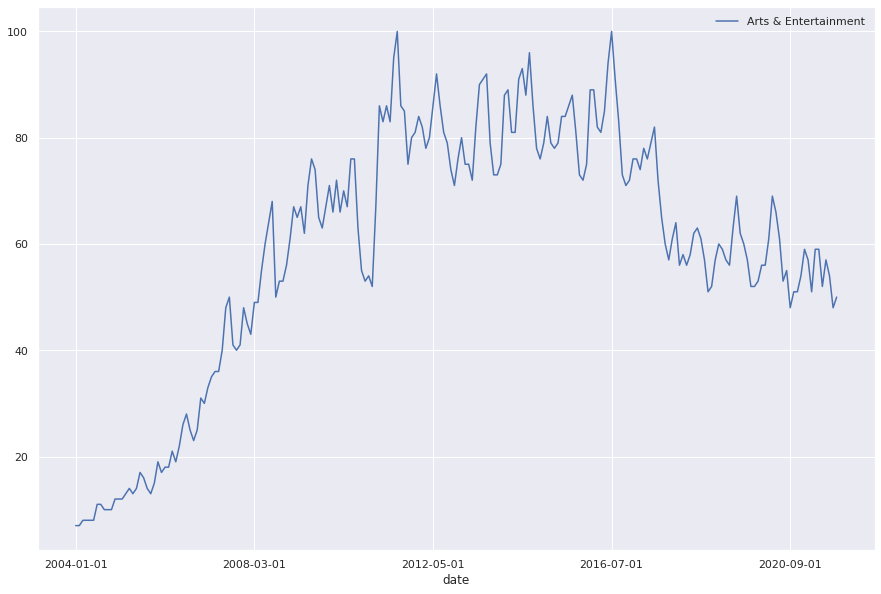

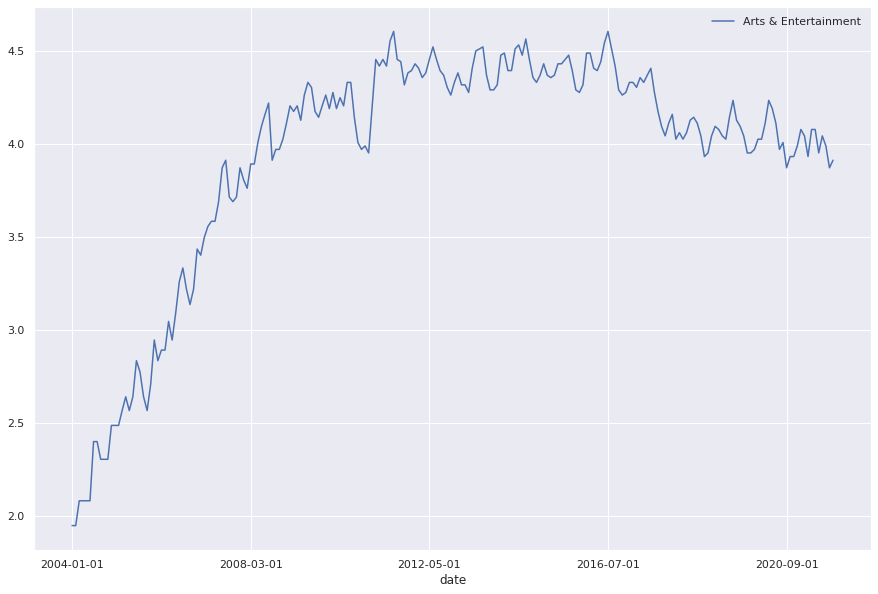

In [ ]:
df.plot(x="date",y=[1],figsize=(15,10))
transformed_data.plot(x="date",y=[1],figsize=(15,10))

#### Differencing

In [5]:
# Augmented Dickey Fuller test (ADH Test) Stationary test for original data
dfcopy.set_index('date', inplace=True)
for col in dfcopy.columns: 
  count = 0
  result = adfuller(dfcopy[col], autolag='AIC')
  while result[1] > 0.05:
    count += 1
    dfcopy[col] = dfcopy[col].diff(1)
    dfcopy.fillna(0.0, inplace=True)
    # print(dfcopy.info())
    result = adfuller(dfcopy[col], autolag='AIC')
  print(col, "was differenced", count, "times")
dfcopy


Arts & Entertainment was differenced 1 times
Autos & Vehicles was differenced 2 times
Beauty & Fitness was differenced 1 times
Books & Literature was differenced 1 times
Business & Industrial was differenced 1 times
Computers & Electronics was differenced 1 times
Finance was differenced 1 times
Food & Drink was differenced 1 times
Games was differenced 2 times
Health was differenced 1 times
Hobbies & Leisure was differenced 1 times
Home & Garden was differenced 1 times
Internet & Telecom was differenced 1 times
Jobs & Education was differenced 0 times
Law & Government was differenced 1 times
News was differenced 1 times
Online Communities was differenced 2 times
People & Society was differenced 1 times
Pets & Animals was differenced 1 times
Real Estate was differenced 1 times
Reference was differenced 1 times
Science was differenced 1 times
Shopping was differenced 1 times
Sports was differenced 1 times
Travel was differenced 1 times


,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,Health,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
date,,,,,,,,,,,,,,,,,,,,,
2004-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2004-02-01,0.0,3.0,0.0,-1.0,0.0,5.0,-2.0,0.0,0.0,0.0,...,-1.0,0.0,-1.0,-3.0,0.0,-1.0,11.0,0.0,0.0,1.0
2004-03-01,1.0,-4.0,1.0,9.0,8.0,5.0,2.0,0.0,0.0,3.0,...,3.0,1.0,4.0,0.0,-2.0,2.0,2.0,2.0,0.0,4.0
2004-04-01,0.0,3.0,2.0,2.0,-6.0,-5.0,-1.0,1.0,1.0,1.0,...,-1.0,-1.0,0.0,5.0,1.0,1.0,-4.0,-1.0,0.0,-2.0
2004-05-01,0.0,-4.0,-1.0,-3.0,0.0,2.0,0.0,0.0,-2.0,-3.0,...,1.0,0.0,-1.0,-7.0,3.0,1.0,0.0,3.0,0.0,-3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-01,-7.0,1.0,6.0,8.0,3.0,3.0,7.0,-4.0,-2.0,2.0,...,-11.0,-1.0,-14.0,-4.0,12.0,4.0,4.0,7.0,-33.0,6.0
2021-07-01,5.0,-9.0,4.0,-2.0,5.0,-2.0,2.0,4.0,3.0,-10.0,...,3.0,-2.0,5.0,-3.0,4.0,-9.0,-15.0,6.0,18.0,11.0
2021-08-01,-3.0,10.0,-1.0,0.0,2.0,1.0,-3.0,-1.0,-4.0,8.0,...,-1.0,2.0,0.0,7.0,6.0,5.0,12.0,-1.0,6.0,5.0


In [7]:
# Augmented Dickey Fuller test (ADH Test) Stationary test for logged data
# transformed_data.set_index('date', inplace=True)
differenced_data = transformed_data.copy()
for col in transformed_data.columns: 
  count = 0
  result = adfuller(differenced_data[col], autolag='AIC')
  while result[1] > 0.05:
    count += 1
    differenced_data[col] = differenced_data[col].diff(1)
    differenced_data.fillna(0.0, inplace=True)
    # print(differenced_data.info())
    result = adfuller(differenced_data[col], autolag='AIC')
  print(col, "was differenced", count, "times")
differenced_data

Arts & Entertainment was differenced 0 times
Autos & Vehicles was differenced 2 times
Beauty & Fitness was differenced 0 times
Books & Literature was differenced 0 times
Business & Industrial was differenced 1 times
Computers & Electronics was differenced 1 times
Finance was differenced 1 times
Food & Drink was differenced 1 times
Games was differenced 2 times
Health was differenced 1 times
Hobbies & Leisure was differenced 1 times
Home & Garden was differenced 1 times
Internet & Telecom was differenced 0 times
Jobs & Education was differenced 0 times
Law & Government was differenced 1 times
News was differenced 0 times
Online Communities was differenced 2 times
People & Society was differenced 0 times
Pets & Animals was differenced 0 times
Real Estate was differenced 0 times
Reference was differenced 1 times
Science was differenced 1 times
Shopping was differenced 1 times
Sports was differenced 1 times
Travel was differenced 1 times


,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,Health,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
date,,,,,,,,,,,,,,,,,,,,,
2004-01-01,1.945910,0.000000,1.945910,2.944439,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.079442,0.000000,2.302585,2.302585,1.791759,0.000000,0.000000,0.000000,0.000000,0.000000
2004-02-01,1.945910,0.470004,1.945910,2.890372,0.000000,0.159065,-0.405465,0.000000,0.000000,0.000000,...,1.945910,0.000000,2.197225,1.945910,1.791759,-0.117783,0.331357,0.000000,0.000000,0.074108
2004-03-01,2.079442,-0.603535,2.079442,3.295837,0.367725,0.137201,0.405465,0.000000,0.000000,0.287682,...,2.302585,0.405465,2.564949,1.945910,1.386294,0.223144,0.050010,0.143101,0.000000,0.251314
2004-04-01,2.079442,0.384846,2.302585,3.367296,-0.262364,-0.137201,-0.182322,0.133531,0.223144,0.080043,...,2.197225,-0.405465,2.564949,2.484907,1.609438,0.095310,-0.102654,-0.068993,0.000000,-0.117783
2004-05-01,2.079442,-0.502629,2.197225,3.258097,0.000000,0.057158,0.000000,0.000000,-0.446287,-0.262364,...,2.302585,0.000000,2.484907,1.609438,2.079442,0.087011,0.000000,0.194156,0.000000,-0.207639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-01,3.951244,0.008230,4.564348,4.454347,0.032790,0.048790,0.113944,-0.045985,-0.088904,0.020203,...,3.891820,-0.046520,4.317488,4.174387,4.304065,0.044951,0.051293,0.081917,-0.410580,0.089612
2021-07-01,4.043051,-0.129571,4.605170,4.430817,0.052368,-0.032261,0.030305,0.045985,0.131463,-0.105361,...,3.951244,-0.095310,4.382027,4.127134,4.356709,-0.104140,-0.207639,0.065241,0.244453,0.145954
2021-08-01,3.988984,0.139186,4.595120,4.430817,0.020203,0.016261,-0.045810,-0.011300,-0.174023,0.085158,...,3.931826,0.095310,4.382027,4.234107,4.430817,0.059189,0.169418,-0.010582,0.069796,0.059898


In [ ]:
df.info()
dfcopy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 214 entries, 0 to 213
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   date                     214 non-null    object
 1   Arts & Entertainment     214 non-null    int64 
 2   Autos & Vehicles         214 non-null    int64 
 3   Beauty & Fitness         214 non-null    int64 
 4   Books & Literature       214 non-null    int64 
 5   Business & Industrial    214 non-null    int64 
 6   Computers & Electronics  214 non-null    int64 
 7   Finance                  214 non-null    int64 
 8   Food & Drink             214 non-null    int64 
 9   Games                    214 non-null    int64 
 10  Health                   214 non-null    int64 
 11  Hobbies & Leisure        214 non-null    int64 
 12  Home & Garden            214 non-null    int64 
 13  Internet & Telecom       214 non-null    int64 
 14  Jobs & Education         214 non-null    i

In [ ]:
#df.set_index("level_0",inplace=True)
#dfcopy.set_index("index",inplace=True)
#df.reset_index(inplace=True)
dfcopy.reset_index(inplace=True)

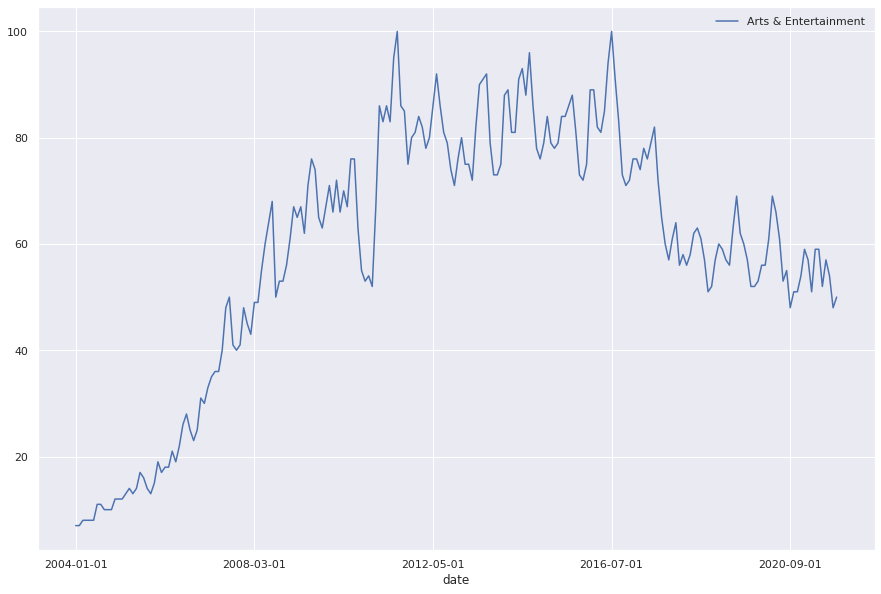

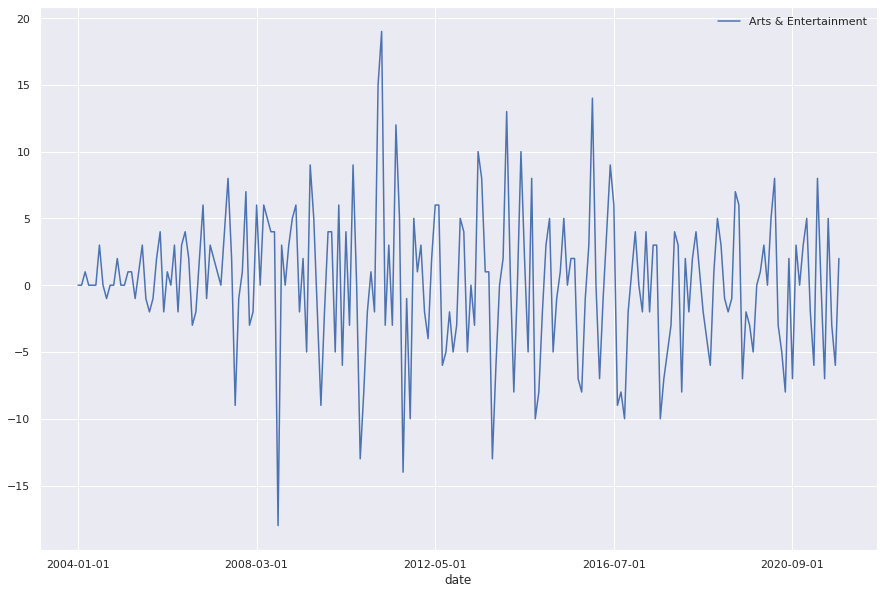

In [ ]:
df.plot(x="date",y=[1],figsize=(15,10))
dfcopy.plot(x="date",y=[1],figsize=(15,10))


In [ ]:
transformed_data.reset_index(inplace=True)
differenced_data.reset_index(inplace=True)

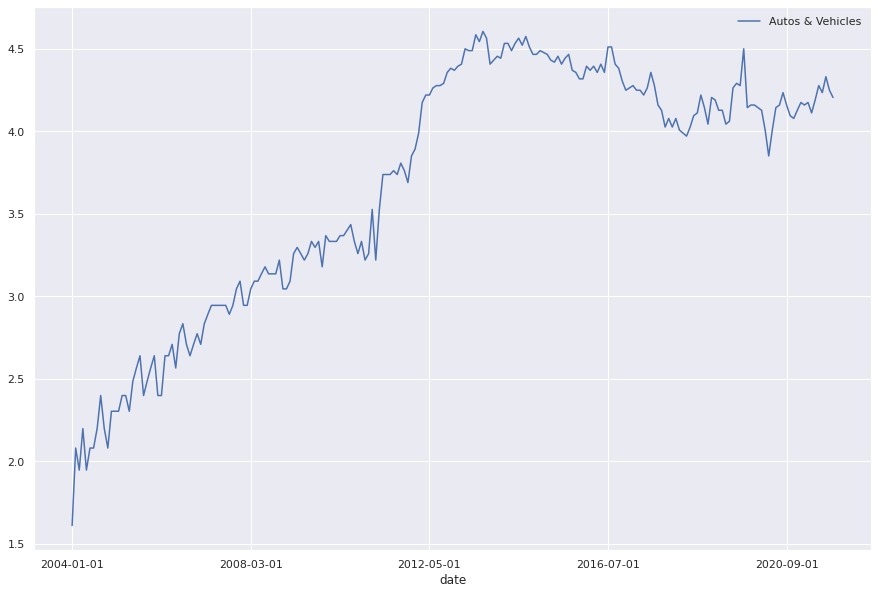

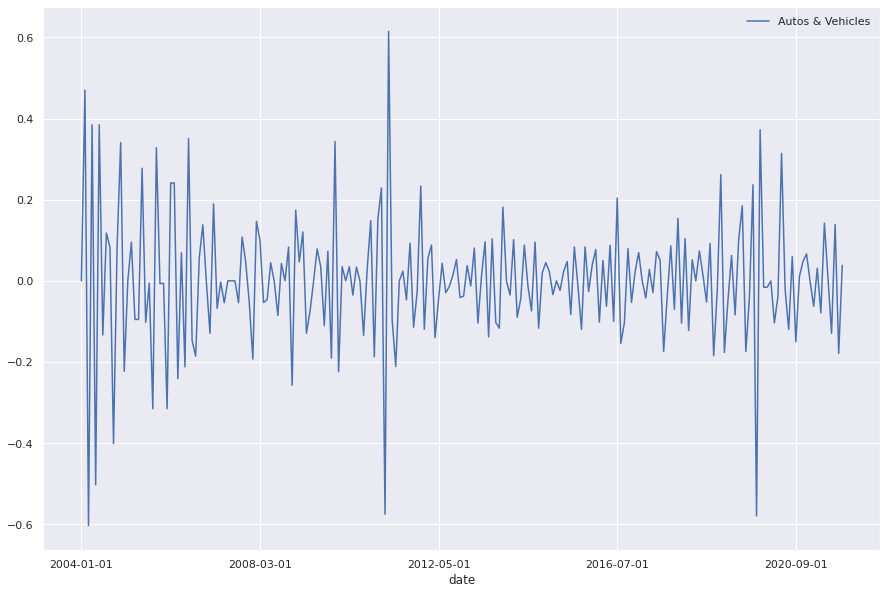

In [ ]:
transformed_data.plot(x="date",y=[2],figsize=(15,10))
differenced_data.plot(x="date",y=[2],figsize=(15,10))

#### Frequency Bridging

In [ ]:
data_const = pd.read_csv('constant_price_gdp.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
data_curr = pd.read_csv('current_price_gdp.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
data_const.head()


,Source,Quarter,Fiscal Year,Unit,Private consumption,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
Indicator,,,,,,,,,,
"GDP by expenditure components at market prices, constant prices for 2016/2017",Ministry of Planning and Economic Development,Q4,2021/2020,Billion EGP,910.5,123.0,162.2,130.8,260.2,1066.3
"GDP by expenditure components at market prices, constant prices for 2016/2017",Ministry of Planning and Economic Development,Q3,2021/2020,Billion EGP,921.6,92.0,133.1,146.1,238.2,1054.6
"GDP by expenditure components at market prices, constant prices for 2016/2017",Ministry of Planning and Economic Development,Q2,2021/2020,Billion EGP,879.4,98.0,119.8,106.4,179.0,1024.6
"GDP by expenditure components at market prices, constant prices for 2016/2017",Ministry of Planning and Economic Development,Q1,2021/2020,Billion EGP,865.6,92.0,93.2,97.8,166.0,982.6
"GDP by expenditure components at market prices, constant prices for 2016/2017",Ministry of Planning and Economic Development,Q4,2020/2019,Billion EGP,898.0,120.6,82.6,85.1,196.3,990.0


In [ ]:
data_const.reset_index(inplace=True)
data_const.head()

,Indicator,Source,Quarter,Fiscal Year,Unit,Private consumption,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
0,GDP by expenditure components at market prices...,Ministry of Planning and Economic Development,Q4,2021/2020,Billion EGP,910.5,123.0,162.2,130.8,260.2,1066.3
1,GDP by expenditure components at market prices...,Ministry of Planning and Economic Development,Q3,2021/2020,Billion EGP,921.6,92.0,133.1,146.1,238.2,1054.6
2,GDP by expenditure components at market prices...,Ministry of Planning and Economic Development,Q2,2021/2020,Billion EGP,879.4,98.0,119.8,106.4,179.0,1024.6
3,GDP by expenditure components at market prices...,Ministry of Planning and Economic Development,Q1,2021/2020,Billion EGP,865.6,92.0,93.2,97.8,166.0,982.6
4,GDP by expenditure components at market prices...,Ministry of Planning and Economic Development,Q4,2020/2019,Billion EGP,898.0,120.6,82.6,85.1,196.3,990.0


In [ ]:
data_const['Date'] = data_const['Fiscal Year'].str.slice(5)+data_const['Quarter'] 


In [ ]:
print(data_const['Date'])

0     2020Q4
1     2020Q3
2     2020Q2
3     2020Q1
4     2019Q4
       ...  
75    2002Q1
76    2001Q4
77    2001Q3
78    2001Q2
79    2001Q1
Name: Date, Length: 80, dtype: object


In [ ]:
data_const.set_index("Date",inplace=True)
data_const.index = pd.to_datetime(data_const.index)
type(data_const.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [ ]:
data_const.drop(data_const.columns[[0, 1, 2,3,4]],axis=1,inplace=True)

In [ ]:
#data_const.set_index("Date",inplace=True)
data_const.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 80 entries, 2020-10-01 to 2001-01-01
Data columns (total 6 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Private consumption                      80 non-null     float64
 1   Government consumption                   80 non-null     float64
 2   Gross capital formation                  80 non-null     float64
 3   Exports of goods and services            80 non-null     float64
 4   Imports of goods and services            80 non-null     float64
 5   Gross Domestic Product at market prices  80 non-null     float64
dtypes: float64(6)
memory usage: 4.4 KB


In [ ]:
resampled=data_const.resample('M').ffill(limit=1).interpolate()
resampled.head()

,Private consumption,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
Date,,,,,,
2001-01-31,332.690000,54.940000,71.640000,76.910000,97.570000,438.610000
2001-02-28,338.720000,53.653333,73.383333,77.546667,99.426667,443.876667
2001-03-31,344.750000,52.366667,75.126667,78.183333,101.283333,449.143333
2001-04-30,350.780000,51.080000,76.870000,78.820000,103.140000,454.410000
2001-05-31,353.573333,54.760000,77.870000,83.000000,104.083333,465.116667


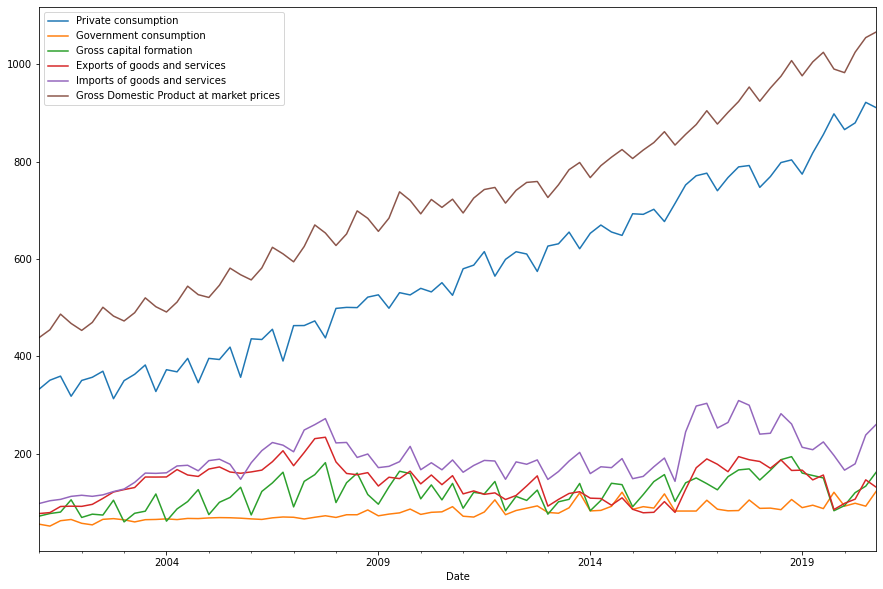

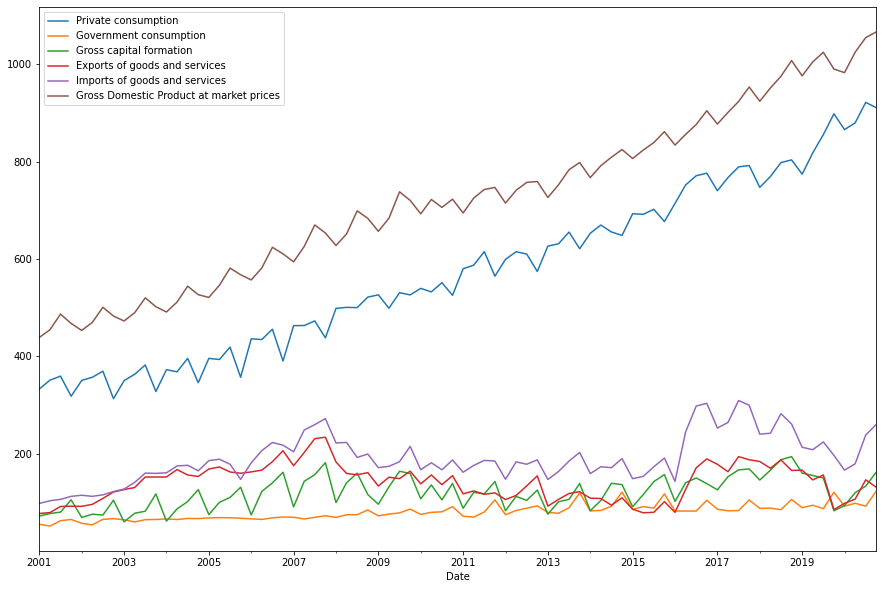

In [ ]:
data_const.plot(figsize=(15,10))
resampled.plot(figsize=(15,10))

In [ ]:
data_curr.head()

,Source,Quarter,Fiscal Year,Unit,Private consumption,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
Indicator,,,,,,,,,,
"GDP by expenditure at market prices, current prices",Ministry of Planning and Economic Development,Q4,2021/2020,Billion EGP,NaN,NaN,NaN,NaN,NaN,NaN
"GDP by expenditure at market prices, current prices",Ministry of Planning and Economic Development,Q4,2021/2020,Billion EGP,1279.9,141.7,235.6,200.8,350.7,1507.3
"GDP by expenditure at market prices, current prices",Ministry of Planning and Economic Development,Q3,2021/2020,Billion EGP,1385.4,123.0,190.8,184.4,342.8,1540.8
"GDP by expenditure at market prices, current prices",Ministry of Planning and Economic Development,Q2,2021/2020,Billion EGP,1495.4,126.2,194.0,164.7,316.3,1664.0
"GDP by expenditure at market prices, current prices",Ministry of Planning and Economic Development,Q1,2021/2020,Billion EGP,1483.3,112.7,155.0,153.8,275.9,1628.9


In [ ]:
data_curr.reset_index(inplace=True)

In [ ]:
data_curr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81 entries, 0 to 80
Data columns (total 11 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Indicator                                81 non-null     object 
 1   Source                                   81 non-null     object 
 2   Quarter                                  81 non-null     object 
 3   Fiscal Year                              81 non-null     object 
 4   Unit                                     81 non-null     object 
 5   Private consumption                      80 non-null     float64
 6   Government consumption                   80 non-null     float64
 7   Gross capital formation                  80 non-null     float64
 8   Exports of goods and services            80 non-null     float64
 9   Imports of goods and services            80 non-null     float64
 10  Gross Domestic Product at market prices  80 non-null

In [ ]:
data_curr['Date'] = data_curr['Fiscal Year'].str.slice(5)+data_curr['Quarter'] 
data_curr.set_index("Date",inplace=True)
data_curr.index = pd.to_datetime(data_curr.index)
type(data_curr.index)


pandas.core.indexes.datetimes.DatetimeIndex

In [ ]:
data_curr.drop(data_curr.columns[[0, 1, 2,3,4,5]],axis=1,inplace=True)
data_curr.dropna(inplace=True)
data_curr.head()

,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
Date,,,,,
2020-10-01,141.7,235.6,200.8,350.7,1507.3
2020-07-01,123.0,190.8,184.4,342.8,1540.8
2020-04-01,126.2,194.0,164.7,316.3,1664.0
2020-01-01,112.7,155.0,153.8,275.9,1628.9
2019-10-01,134.3,107.5,129.7,254.6,1326.0


In [ ]:
resampled_curr=data_curr.resample('M').ffill(limit=1).interpolate()
resampled_curr.head()

,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
Date,,,,,
2001-01-31,12.500000,16.300000,17.500000,22.200000,99.800000
2001-02-28,11.833333,16.133333,17.066667,21.866667,97.666667
2001-03-31,11.166667,15.966667,16.633333,21.533333,95.533333
2001-04-30,10.500000,15.800000,16.200000,21.200000,93.400000
2001-05-31,10.966667,15.633333,16.633333,20.900000,93.333333


In [ ]:
resampled_curr.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 238 entries, 2001-01-31 to 2020-10-31
Freq: M
Data columns (total 5 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Government consumption                   238 non-null    float64
 1   Gross capital formation                  238 non-null    float64
 2   Exports of goods and services            238 non-null    float64
 3   Imports of goods and services            238 non-null    float64
 4   Gross Domestic Product at market prices  238 non-null    float64
dtypes: float64(5)
memory usage: 11.2 KB


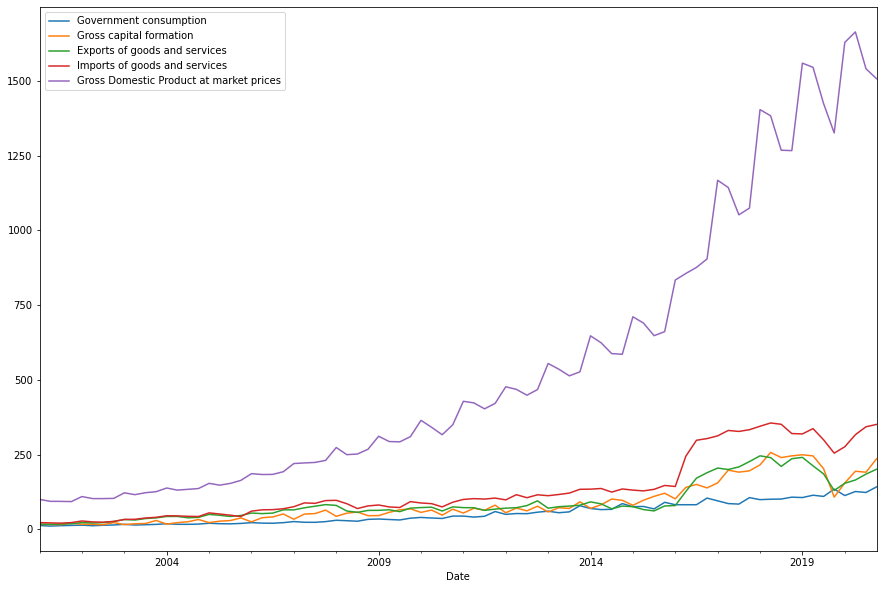

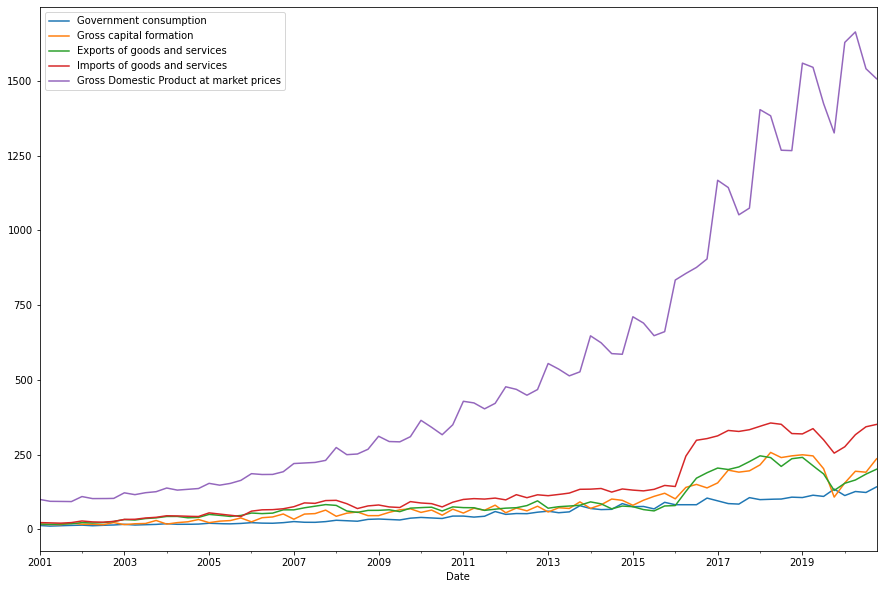

In [ ]:
data_curr.plot(figsize=(15,10))
resampled_curr.plot(figsize=(15,10))

#### Exponential smoothing

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-

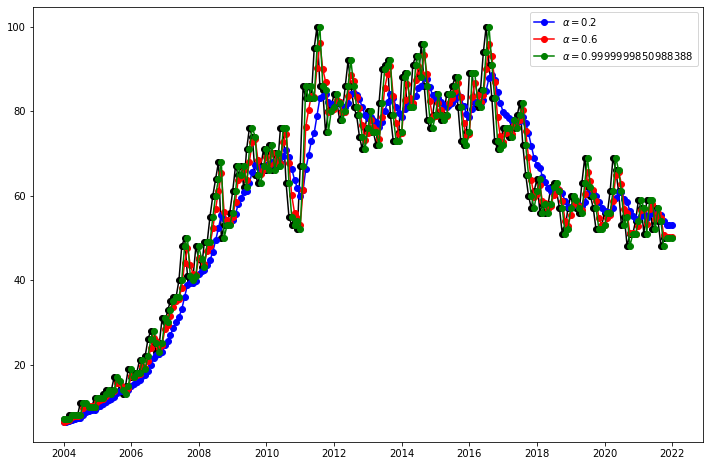

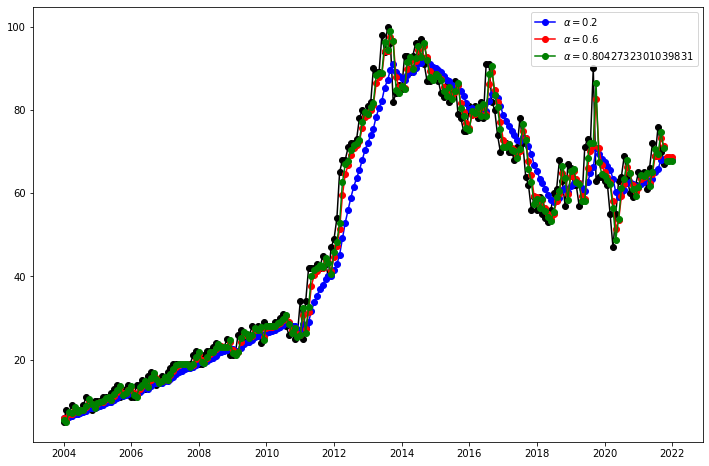

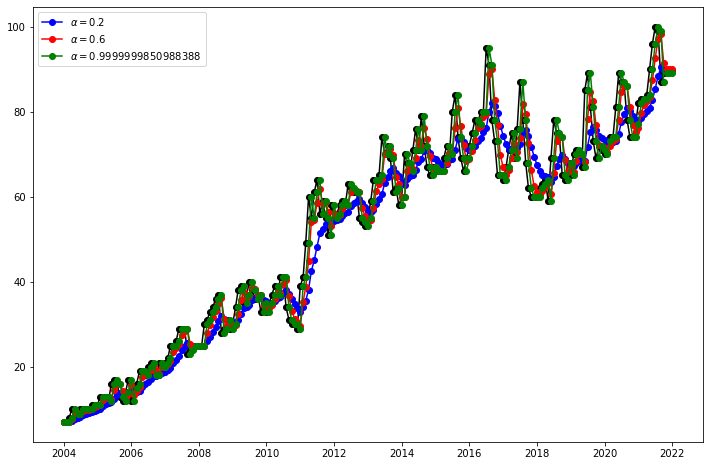

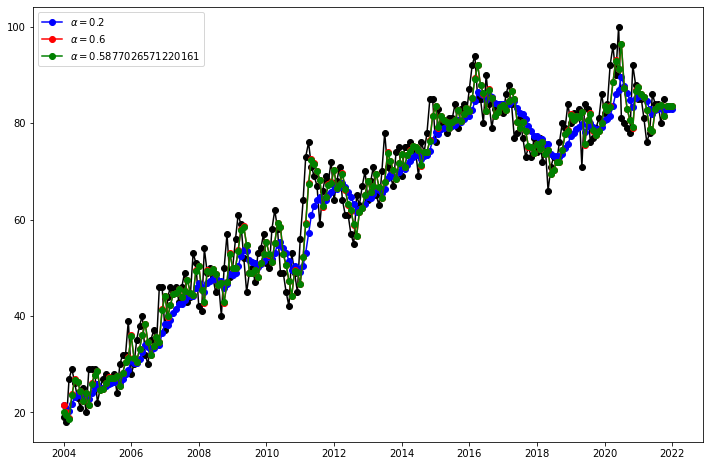

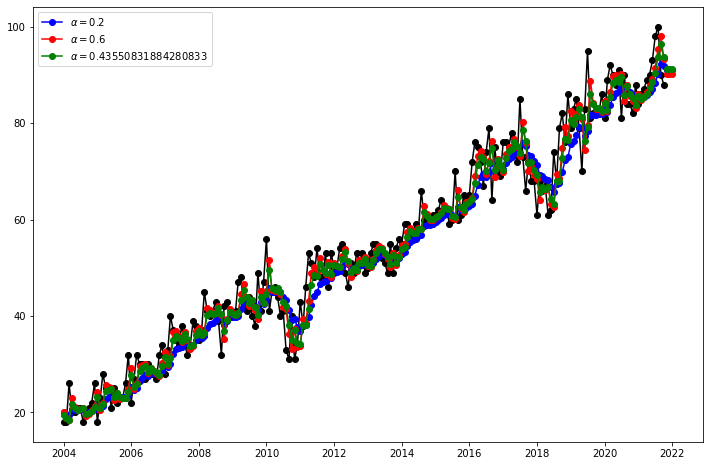

...

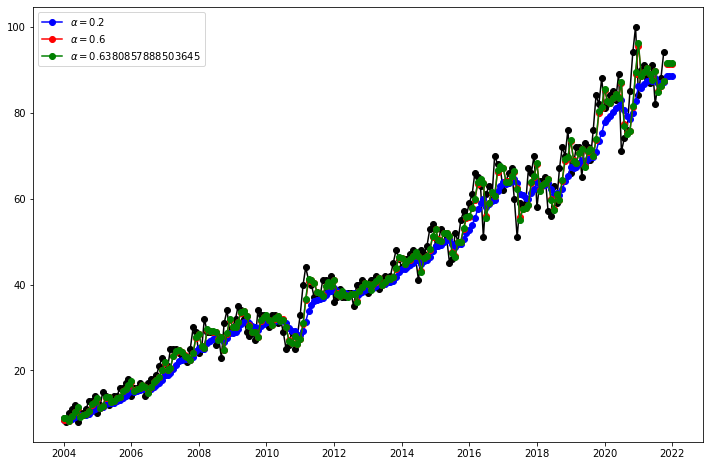

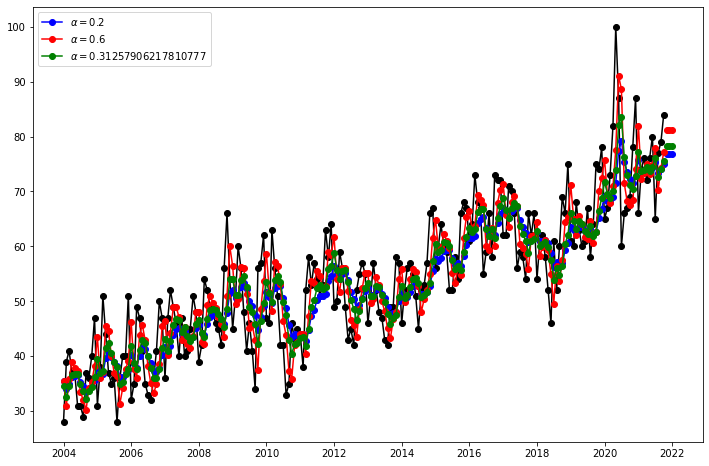

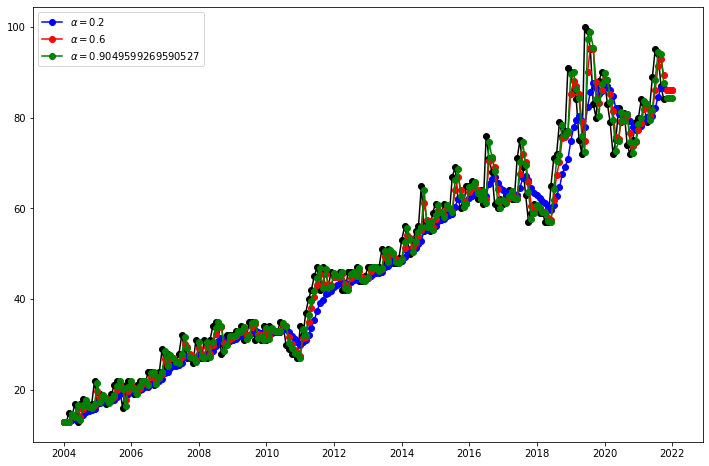

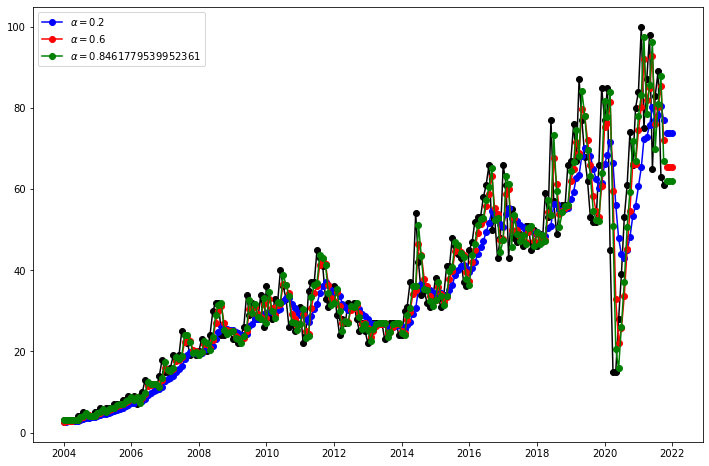

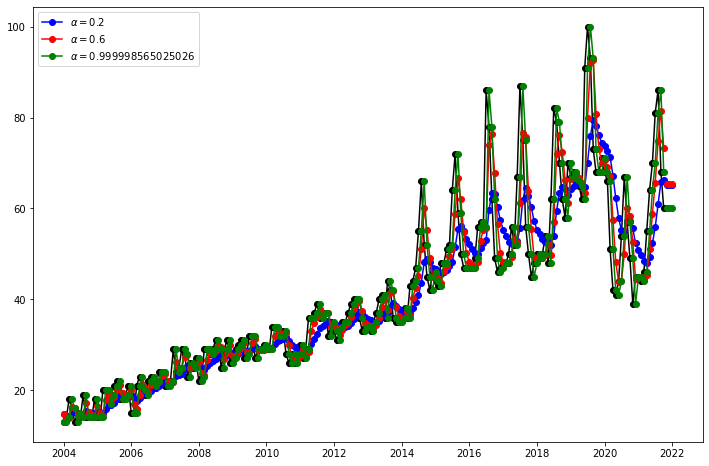

In [ ]:
for col in df.columns:
    
    fit1 = SimpleExpSmoothing(df[col], initialization_method="heuristic").fit(
        smoothing_level=0.2, optimized=False)
    fcast1 = fit1.forecast(3).rename(r"$\alpha=0.2$")
    fit2 = SimpleExpSmoothing(df[col], initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False)
    fcast2 = fit2.forecast(3).rename(r"$\alpha=0.6$")
    fit3 = SimpleExpSmoothing(df[col], initialization_method="estimated").fit()
    fcast3 = fit3.forecast(3).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])
    plt.figure(figsize=(12, 8))
    plt.plot(df[col], marker="o", color="black")
    plt.plot(fit1.fittedvalues, marker="o", color="blue")
    (line1,) = plt.plot(fcast1, marker="o", color="blue")
    plt.plot(fit2.fittedvalues, marker="o", color="red")
    (line2,) = plt.plot(fcast2, marker="o", color="red")
    plt.plot(fit3.fittedvalues, marker="o", color="green")
    (line3,) = plt.plot(fcast3, marker="o", color="green")
    plt.legend([line1,line2,line3], [fcast1.name, fcast2.name, fcast3.name])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-

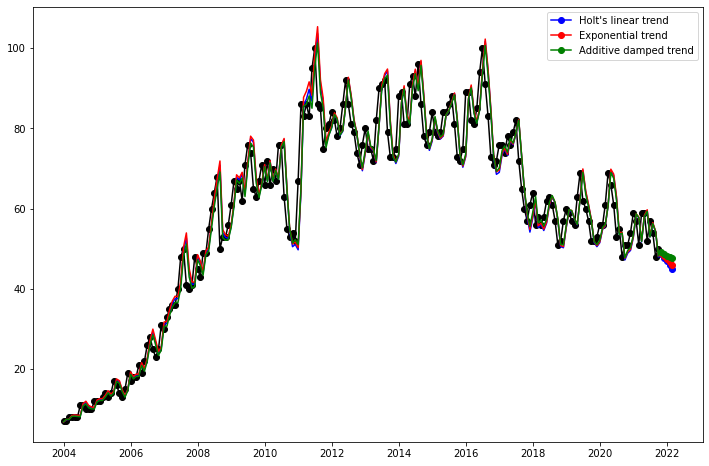

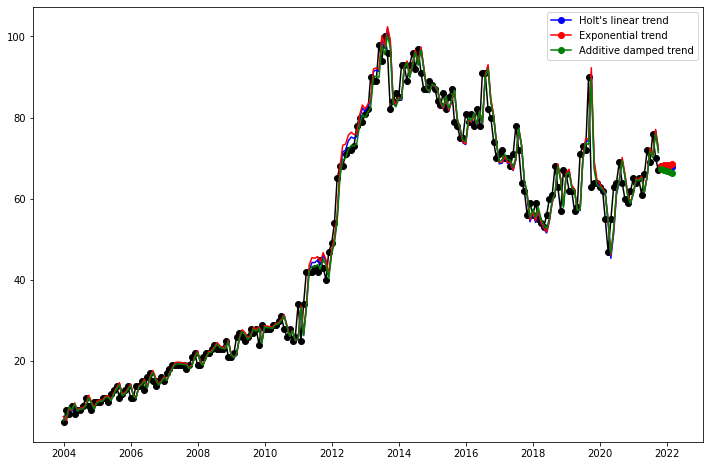

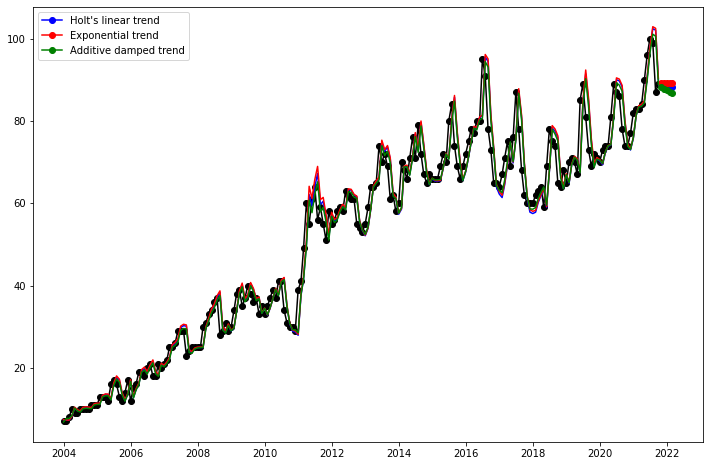

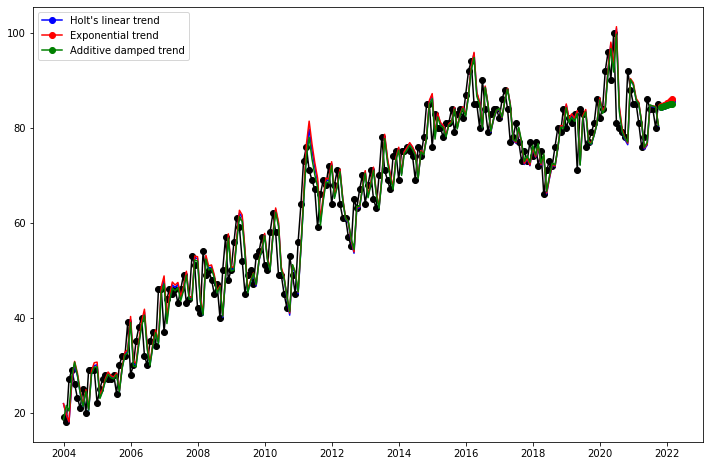

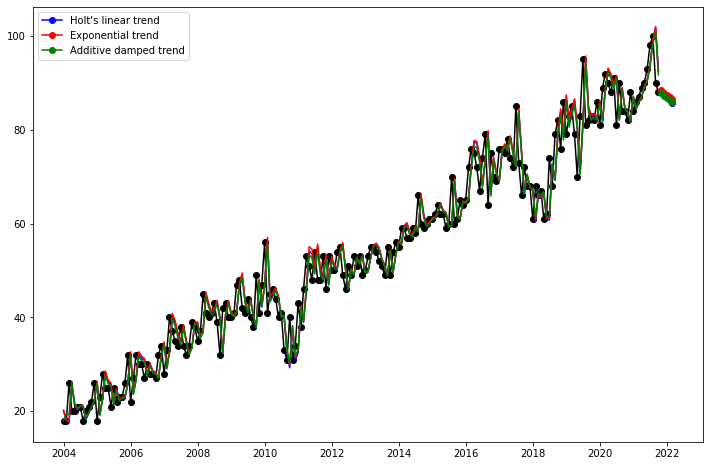

...

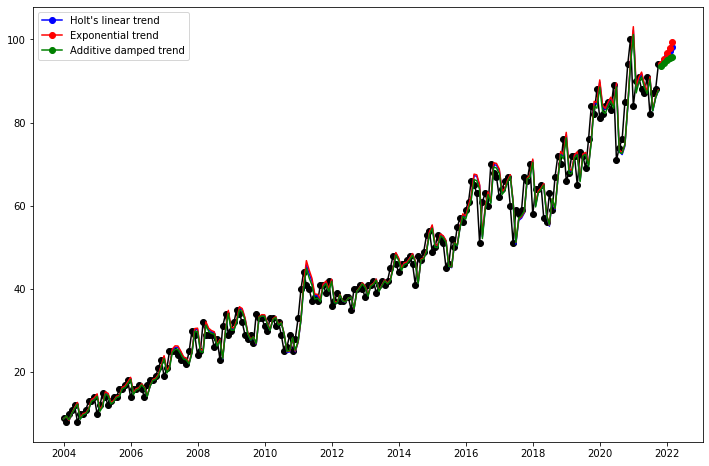

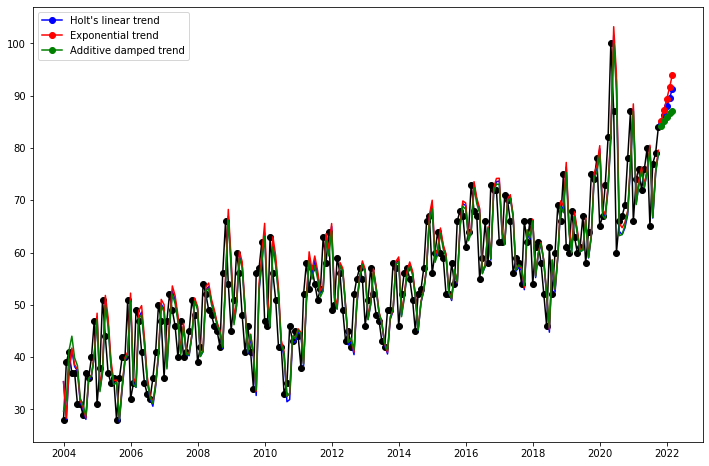

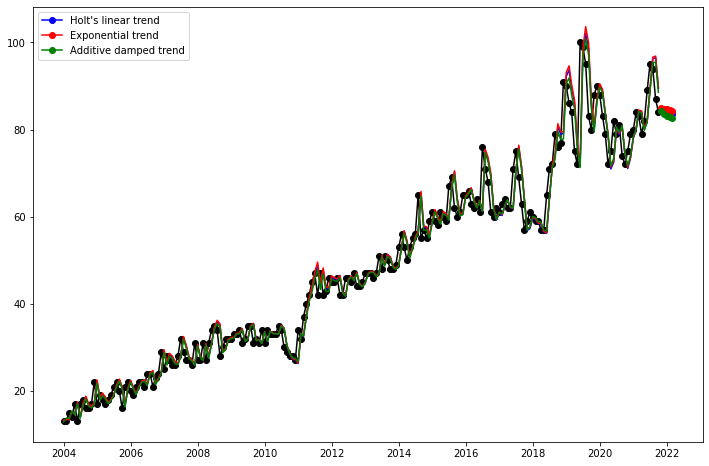

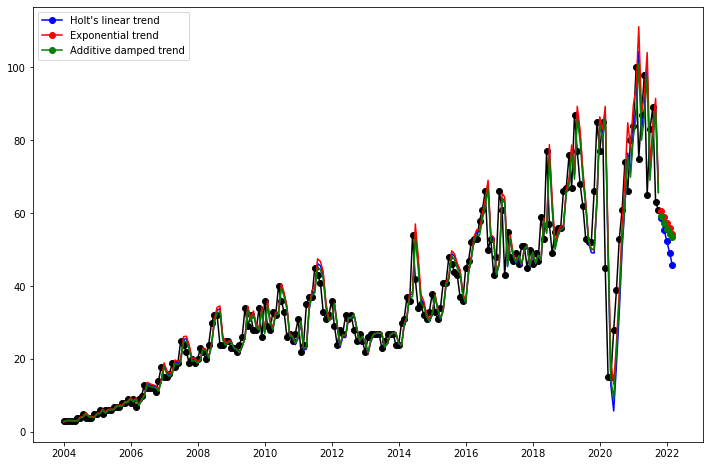

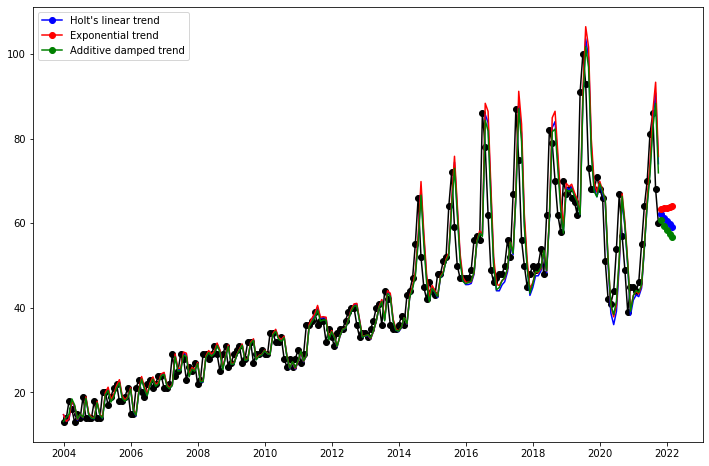

In [ ]:
for col in df.columns:
    fit1 = Holt(df[col], initialization_method="estimated").fit(
        smoothing_level=0.8, smoothing_trend=0.2, optimized=False
    )
    fcast1 = fit1.forecast(5).rename("Holt's linear trend")
    fit2 = Holt(df[col], exponential=True, initialization_method="estimated").fit(
        smoothing_level=0.8, smoothing_trend=0.2, optimized=False
    )
    fcast2 = fit2.forecast(5).rename("Exponential trend")
    fit3 = Holt(df[col], damped_trend=True, initialization_method="estimated").fit(
        smoothing_level=0.8, smoothing_trend=0.2
    )
    fcast3 = fit3.forecast(5).rename("Additive damped trend")

    plt.figure(figsize=(12, 8))
    plt.plot(df[col], marker="o", color="black")
    plt.plot(fit1.fittedvalues, color="blue")
    (line1,) = plt.plot(fcast1, marker="o", color="blue")
    plt.plot(fit2.fittedvalues, color="red")
    (line2,) = plt.plot(fcast2, marker="o", color="red")
    plt.plot(fit3.fittedvalues, color="green")
    (line3,) = plt.plot(fcast3, marker="o", color="green")
    plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])


#### Dimensionality Reduction on original data using PCA

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


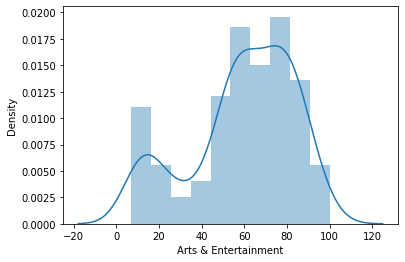

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


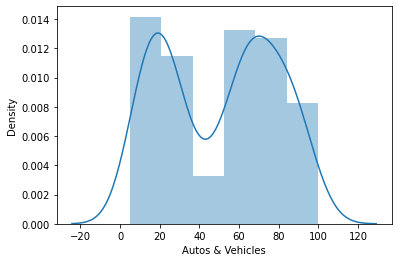

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


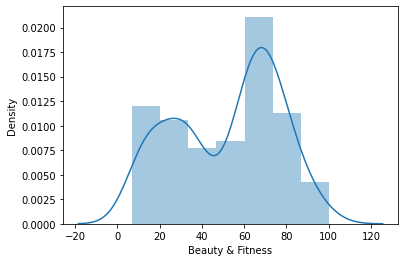

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


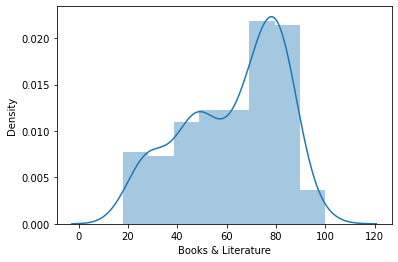

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


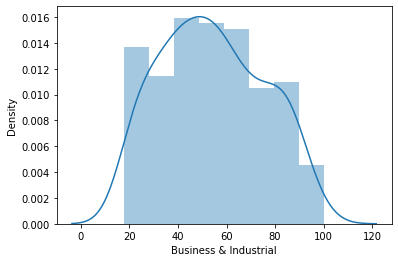

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


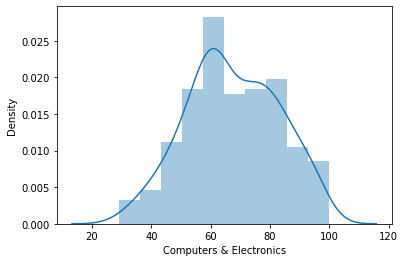

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


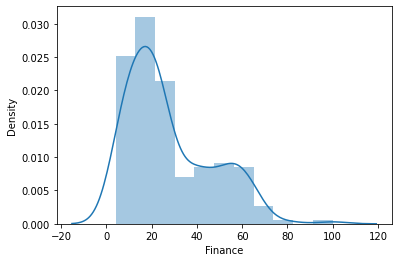

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


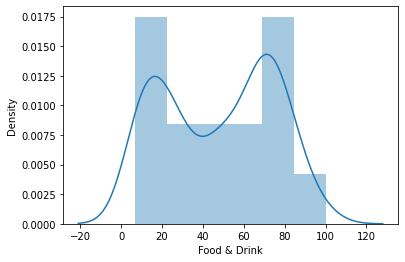

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


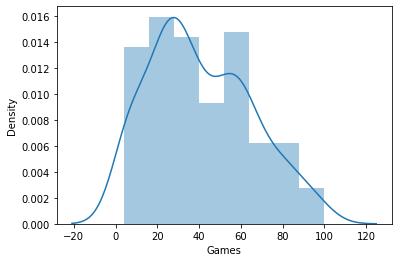

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


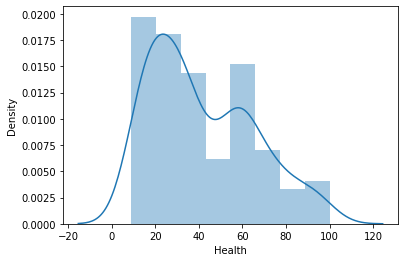

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


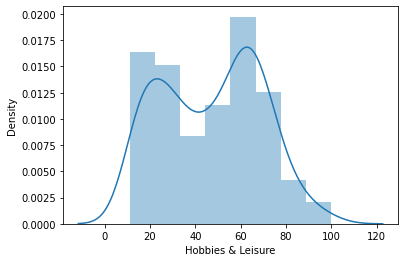

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


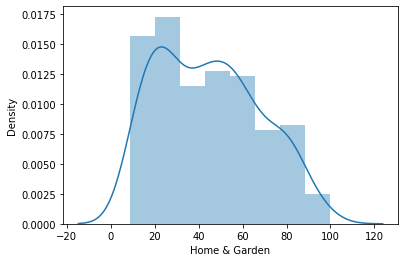

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


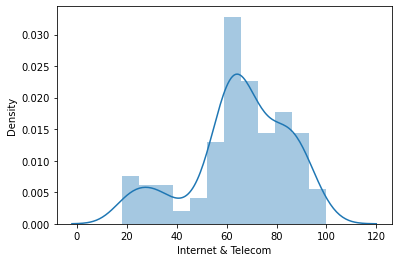

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


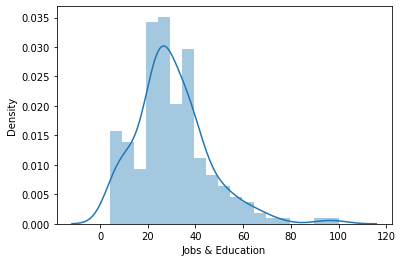

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


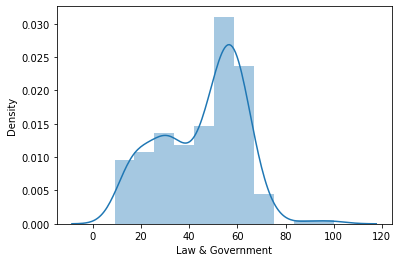

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


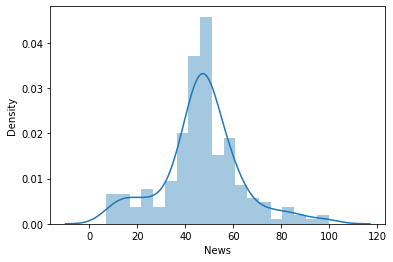

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


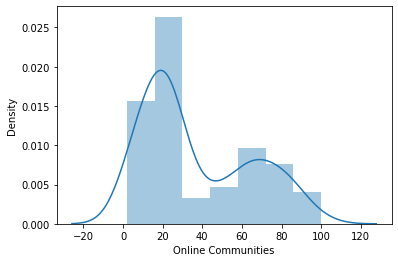

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


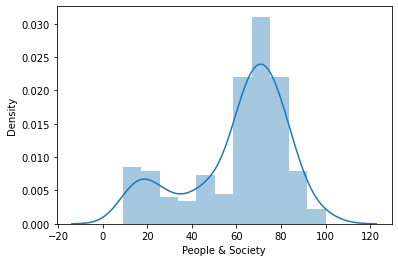

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


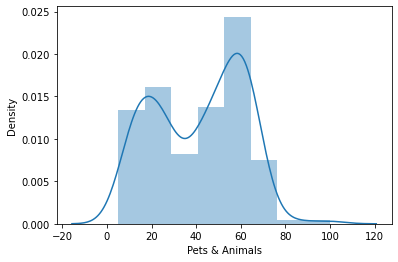

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


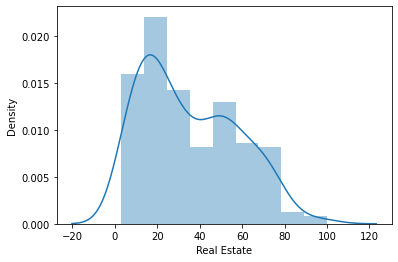

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


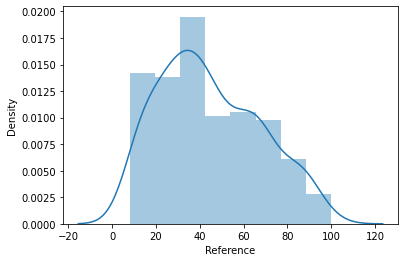

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


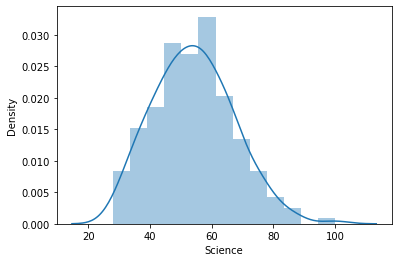

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


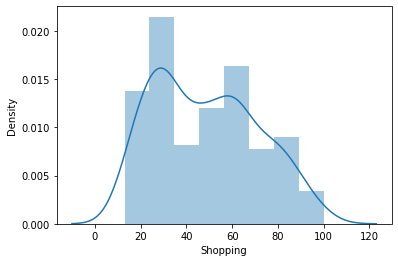

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


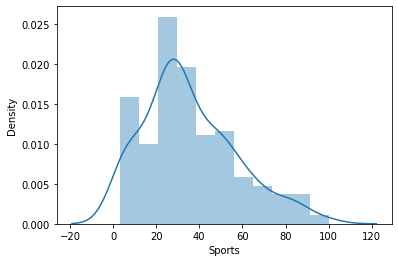

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


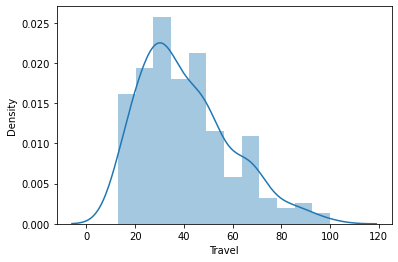

In [8]:
# plotting normal distribution
df.set_index('date', inplace=True)
for col in df.columns:
  res = sns.distplot(df[col])
  plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


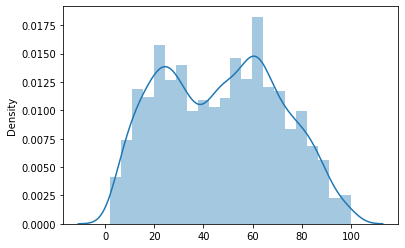

In [ ]:
res = sns.distplot(df)
plt.show()

In [ ]:
# Standardize the data using StandardScaler

x = StandardScaler().fit_transform(df)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


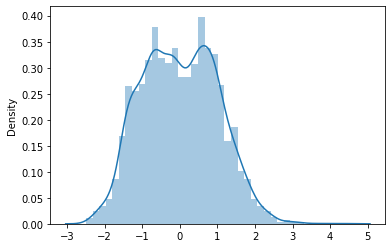

In [ ]:
res = sns.distplot(x)
plt.show()

In [ ]:
# Standardize the data using MinMax Scaler

n = MinMaxScaler().fit_transform(df)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


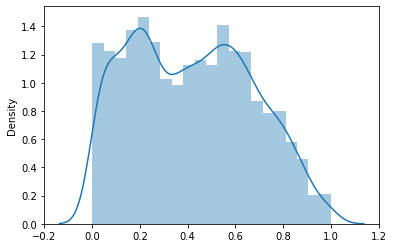

In [ ]:
res = sns.distplot(n)
plt.show()

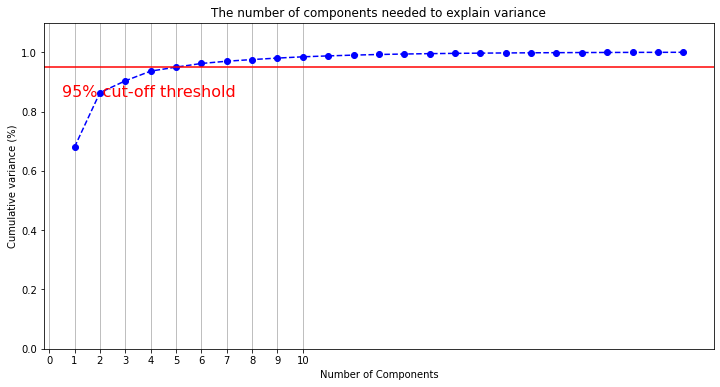

In [ ]:
pca = PCA().fit(x)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 26, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 11, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3',
                          'principal component 4', 'principal component 5' ])
principalDf

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,8.311354,-2.846556,-1.443210,0.394844,0.626068
1,8.159346,-2.786582,-1.191879,0.048710,0.169632
2,7.646922,-2.646981,-0.811581,-0.033494,0.034245
3,7.763886,-2.721775,-1.203226,0.037526,0.255200
4,7.741362,-2.639984,-0.968227,0.034155,0.429073
...,...,...,...,...,...
209,-6.066680,-3.145603,1.078810,0.247637,-0.483263
210,-6.371774,-3.274361,0.539960,0.483978,0.133604
211,-6.896040,-3.376865,1.175389,0.957454,-0.299108
212,-5.219540,-3.258100,0.964616,0.128531,-0.564920


In [ ]:
pca.explained_variance_ratio_

array([0.68014661, 0.18356767, 0.0399997 , 0.03279108, 0.01334865])

#### Dimensionality Reduction on log transformed and differenced data using PCA

In [10]:
# differenced_data.set_index('date', inplace=True)
x = StandardScaler().fit_transform(differenced_data)


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


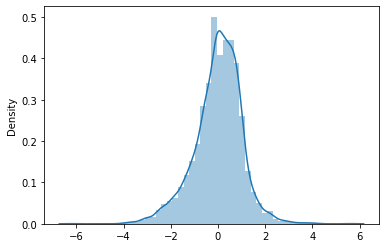

In [11]:

res = sns.distplot(x)
plt.show()

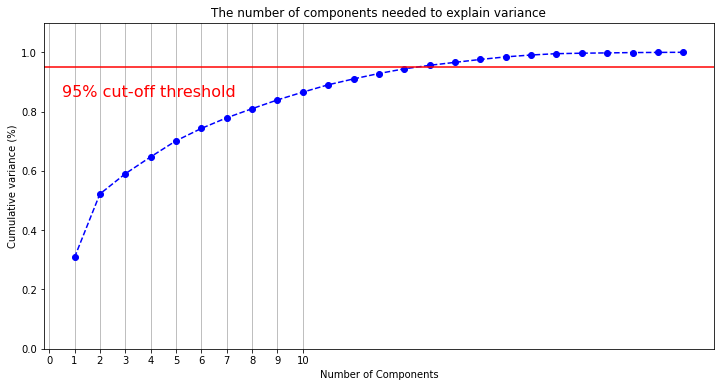

In [12]:
pca = PCA().fit(x)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 26, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 11, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [13]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
principalDf

,principal component 1,principal component 2
0,8.554532,0.575359
1,9.044621,-0.466999
2,7.969324,-5.885085
3,7.413207,3.724979
4,7.885121,-0.409821
...,...,...
209,-2.107020,-1.221333
210,-2.080819,0.933829
211,-2.250671,-1.358301
212,-1.762004,2.229767


In [ ]:
pca.explained_variance_ratio_

array([0.30807713, 0.21403647])

In [ ]:
principalDf.to_excel("converted-to-excel.xlsx")

# Benchmarking Model

In [133]:
#Loading the data and viewing the tabular format
x = pd.read_csv("newdata.csv", header=0, index_col=0)
x.head()

,principal component 1,principal component 2
0,8.554532,0.575359
1,9.044621,-0.466999
2,7.969324,-5.885085
3,7.413207,3.724979
4,7.885121,-0.409821


In [134]:

x.drop(index=x.index[202:], axis=1, inplace=True)
x

,principal component 1,principal component 2
0,8.554532,0.575359
1,9.044621,-0.466999
2,7.969324,-5.885085
3,7.413207,3.724979
4,7.885121,-0.409821
...,...,...
197,-2.263169,-1.555584
198,-1.789006,4.280482
199,-1.847217,-1.536170
200,-1.486055,2.089151


In [135]:

y = pd.read_csv("current.csv", header=0)
y

,Date,Government consumption,Gross capital formation,Exports of goods and services,Imports of goods and services,Gross Domestic Product at market prices
0,2004-01-31 00:00:00,18.500000,17.200000,42.700000,45.100000,137.900000
1,2004-02-29 00:00:00,17.833333,18.833333,42.733333,44.966667,135.566667
2,2004-03-31 00:00:00,17.166667,20.466667,42.766667,44.833333,133.233333
3,2004-04-30 00:00:00,16.500000,22.100000,42.800000,44.700000,130.900000
4,2004-05-31 00:00:00,16.466667,23.033333,41.300000,44.200000,131.766667
...,...,...,...,...,...,...
197,2020-06-30 00:00:00,124.066667,191.866667,177.833333,333.966667,1581.866667
198,2020-07-31 00:00:00,123.000000,190.800000,184.400000,342.800000,1540.800000
199,2020-08-31 00:00:00,129.233333,205.733333,189.866667,345.433333,1529.633333
200,2020-09-30 00:00:00,135.466667,220.666667,195.333333,348.066667,1518.466667


In [136]:
y = y.iloc[: , 5:]
y= MinMaxScaler().fit_transform(y)

#### Cross Validation using Expanding window

#### ARIMA model

ARIMA model has 3 parameters "p,q,d".
- d is the differencing. However, since our data was already differenced, we decide not to difference it so, d = 0.
- p is the AR term.
- q is the moving average term.

In [ ]:
tscv = TimeSeriesSplit() 
print(tscv)
splits = 5
TimeSeriesSplit(gap=0, max_train_size=None, n_splits=splits, test_size=None)
modelME = 0
for train_index, test_index in tscv.split(x):
  # print(train_index,"\t \t",test_index)
  X_train, X_test = x.iloc[train_index], x.iloc[test_index]
  y_train, y_test = y[train_index], y[test_index]
  #ARIMA model
  # fit model 
  # This sets the lag value to 1 for autoregression, uses a difference order of 0 to make the time series stationary, and uses a moving average model of 2.
  model = ARIMA(X_train['principal component 1'], order=(1, 0, 1))
  model_fit = model.fit()
  print(model_fit.summary())  
  yhat = model_fit.predict(len(X_train), len(X_train) + len(X_test) - 1)
  # print("output is: ",yhat)
  # print("train is: ",y_test)
  me = mean_squared_error(y_test, yhat)
  modelME += me
  print("Mean squared  error: ",me)

modelME = modelME / splits
print("Model mean squared error: ", modelME)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
                                 SARIMAX Results                                 
Dep. Variable:     principal component 1   No. Observations:                   37
Model:                    ARIMA(1, 0, 1)   Log Likelihood                 -32.965
Date:                   Tue, 23 Aug 2022   AIC                             73.929
Time:                           20:22:11   BIC                             80.373
Sample:                                0   HQIC                            76.201
                                    - 37                                         
Covariance Type:                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.5332      2.047      2.703      0.007       1.520       9.546
ar.L1          0.9717      0.062   

The model mean squared error of 4.48 is the average. Compared to the error of the final model of 3.18 this shows that the model did not converge yet. Possibly more data would allow the model to converge. 

We tried principal component 1 and 2. Principal component 1 gave better results which makes sense because it's covariance is higher. We then tried different parameters of the model where we changed the p and q. The best model was decided upon having the lowest AIC, BIC value which shows it fits best. The best model was of order (1,0,1). 
These are the models we tried and their AIC, BIC values:
- 2,0,2
AIC: 76
BIC: 85
- 1, 0, 2
AIC: 74
BIC: 82
- 2, 0, 3:
AIC: 76
BIC: 88
- 1, 0, 3:
AIC:  75
BIC: 85
- 1, 0, 1:
AIC: 73
BIC: 80

#### Seasonal ARIMA model

In [ ]:
tscv = TimeSeriesSplit() 
print(tscv)
TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
for train_index, test_index in tscv.split(x):
  X_train, X_test = x.iloc[train_index], x.iloc[test_index]
  y_train, y_test = y[train_index], y[test_index]
  #seasonal ARIMA model
  # fit model 
  # This sets the lag value to 1 for autoregression, uses a difference order of 0 to make the time series stationary, and uses a moving average model of 2.
  model = SARIMAX(X_train['principal component 1'], order=(1, 0, 1), seasonal_order=(1, 0, 1, 4))
  model_fit = model.fit()
  print(model_fit.summary())  
  yhatS = model_fit.predict(len(X_train), len(X_train) + len(X_test) - 1)
  me = mean_squared_error(y_test, yhatS)
  modelME += me
  print("Mean squared  error: ",me)

modelME = modelME / splits
print("Model mean squared error: ", modelME)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
                                     SARIMAX Results                                     
Dep. Variable:             principal component 1   No. Observations:                   37
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 4)   Log Likelihood                 -25.943
Date:                           Tue, 23 Aug 2022   AIC                             61.886
Time:                                   19:59:43   BIC                             69.941
Sample:                                        0   HQIC                            64.726
                                            - 37                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9743      0.107      9.084      0

The average mean squared error is close to the mean squared error of the final model which shows that the model converged.

**We can deduce that the ARIMA model needs more data than the seasonal ARIMA to converge.**

Terms are all significant except L2. 
The Ljung-Box test statistic at lag 1 is, the Prob(Q) is 0.00, and the p-value is 0.98. Since the probability is above 0.05, we can’t reject the null that the errors are white noise.
The summary performs White’s test. Our summary statistics show a test statistic of 0.68 and a p-value of 0.16, which means we reject the null hypothesis and our residuals show variance.
Jarque-Bera tests for the normality of errors. It tests the null that the data is normally distributed against an alternative of another distribution. We see a test statistic of 20.84 with a probability of 0, which means we reject the null hypothesis, and the data is not normally distributed. Also, as part of the Jarque-Bera test, we see the distribution has a slight negative skew and a large kurtosis.

Terms are all significant except L2. 
The Ljung-Box test statistic at lag 1 is, the Prob(Q) is 0.00, and the p-value is 0.98. Since the probability is above 0.05, we can’t reject the null that the errors are white noise.


We tried principal component 1 and 2. Principal component 1 gave better results which makes sense because it's covariance is higher. We then tried different parameters of the model where we changed the p and q. The best model was decided upon having the lowest AIC, BIC value which shows it fits best. The best model was of order (1,0,1) from the previous ARIMA model and we found the best seasonal order to be (1, 0, 1, 4).
These are the models we tried and their AIC, BIC values:
- 1,0,1  - 1, 0, 1, 3
AIC: 77
BIC: 85
- 1, 0, 2 - 1, 0, 1, 3
AIC: 76
BIC: 86
- 1, 0, 1 - 1, 0, 1, 4
AIC: 61
BIC: 69


#### VAR

In [ ]:
tscv = TimeSeriesSplit() 
print(tscv)
TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)

for train_index, test_index in tscv.split(x):
  #print(train_index,"\t \t",test_index)
  X_train, X_test = x.iloc[train_index], x.iloc[test_index]
  y_train, y_test = y[train_index], y[test_index]
  #VAR model
  model = VAR(X_train)
  res= model.select_order()
res.summary()

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


,AIC,BIC,FPE,HQIC
0,3.226,3.265,25.17,3.242
1,-0.6280,-0.5102,0.5337,-0.5801
2,-0.8985,-0.7021,0.4072,-0.8187
3,-0.9120,-0.6371,0.4018,-0.8004
4,-1.208,-0.8548,0.2988,-1.065
5,-1.243,-0.8114,0.2886,-1.068
6,-1.252,-0.7412,0.2863,-1.044
7,-1.269,-0.6802,0.2814,-1.030
8,-1.268,-0.5999,0.2820,-0.9963
9,-1.367,-0.6207,0.2555,-1.064


In [ ]:
result = model.fit(13)
result.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 23, Aug, 2022
Time:                     20:29:31
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -1.39423
Nobs:                     156.000    HQIC:                  -2.02117
Log likelihood:          -197.612    FPE:                  0.0869072
AIC:                     -2.44995    Det(Omega_mle):       0.0631543
--------------------------------------------------------------------
Results for equation principal component 1
                               coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------------
const                            -0.103098         0.058649           -1.758           0.079
L1.principal component 1          0.956017         0.121139            7.892           0.

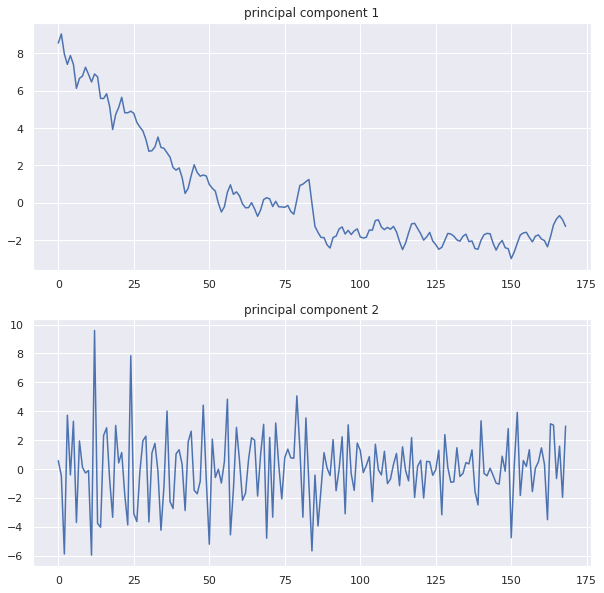

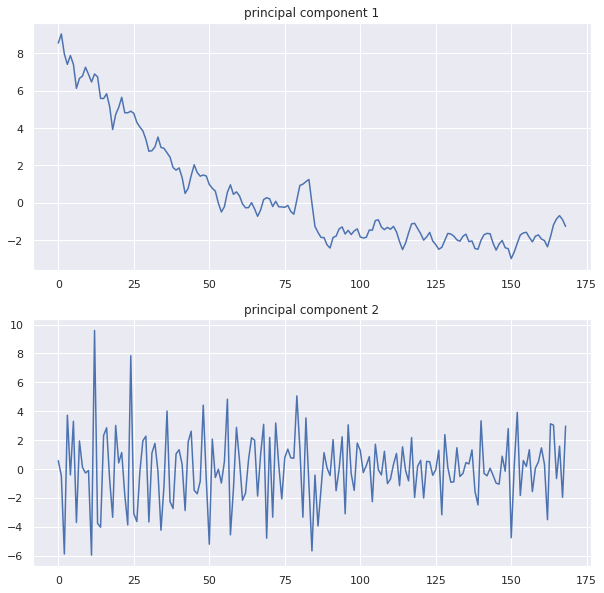

In [ ]:

result.plot()

In [ ]:
yhatV = result.forecast(result.endog, steps=len(X_test))

In [ ]:
mape = np.mean(np.abs(yhatV - y_test)/np.abs(y_test))  # MAPE
mape

2.283276387549442

In [ ]:
me = np.mean(y_test - yhatV)             # ME
me

1.7170303248015124

# ML Models

### Using Original data

In [119]:
df.drop(index=df.index[202:], axis=1, inplace=True)
# df.set_index('date', inplace=True)
df

,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,Health,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
date,,,,,,,,,,,,,,,,,,,,,
2004-01-01,7,5,7,19,18,29,6,7,4,9,...,8,2,10,10,6,9,28,13,3,13
2004-02-01,7,8,7,18,18,34,4,7,4,9,...,7,2,9,7,6,8,39,13,3,14
2004-03-01,8,7,8,27,26,39,6,7,4,12,...,10,3,13,7,4,10,41,15,3,18
2004-04-01,8,9,10,29,20,34,5,8,5,13,...,9,3,13,12,5,11,37,14,3,16
2004-05-01,8,7,9,26,20,36,5,8,4,10,...,10,3,12,5,8,12,37,17,3,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-01,61,63,89,100,91,72,67,86,30,97,...,56,24,82,65,66,89,87,82,28,44
2020-07-01,53,64,87,81,81,61,59,83,26,80,...,47,21,75,59,68,71,60,79,39,54
2020-08-01,55,69,86,80,90,61,66,79,24,82,...,51,21,71,56,70,74,66,81,53,67


#### Random Forest Regressor

In [21]:
tscv = TimeSeriesSplit() 
print(tscv)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
model = RandomForestRegressor(n_estimators = 10, random_state = 0)
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
  # Number of features to consider at every split
max_features = ['auto', 'sqrt']
  # Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
  # Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
  # Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
  # Method of selecting samples for training each tree
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
                'max_features': max_features,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf,
                'bootstrap': bootstrap}
clf = RandomizedSearchCV(model, random_grid, random_state=0, cv = tscv)
search = clf.fit(df, y)
search.best_params_

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

{'n_estimators': 800,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': True}

In [70]:
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.10, random_state=0, shuffle=False)

In [72]:
model = RandomForestRegressor(n_estimators= 800, min_samples_split= 2, min_samples_leaf= 2,max_features= 'auto', max_depth= 100, bootstrap= True, random_state=0)
model

RandomForestRegressor(max_depth=100, min_samples_leaf=2, n_estimators=800,
                      random_state=0)

In [73]:
search = model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


In [74]:
yhat_train = model.predict(X_train)

In [75]:
mean_squared_error(y_train, yhat_train)

0.00016566904199496557

In [76]:
yhat_test = model.predict(X_test)

In [77]:
mean_squared_error(y_test, yhat_test)

0.016947247081253416

In [105]:
yhat_plot = pd.Series(data=yhat_train, name='yhat')

In [106]:
ytrain_plot = pd.Series(data=y_train.reshape(-1), name='ytrain')

In [116]:
yhatTest_plot = pd.Series(data=yhat_test, name='yhatTest')

In [114]:
ytest_plot = pd.Series(data=y_test.reshape(-1), name='ytest')

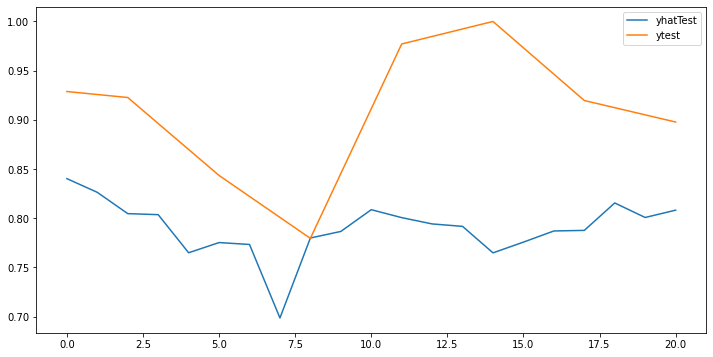

In [117]:
yhatTest_plot.plot(kind='line', legend=True)
ytest_plot.plot(kind='line', legend=True)

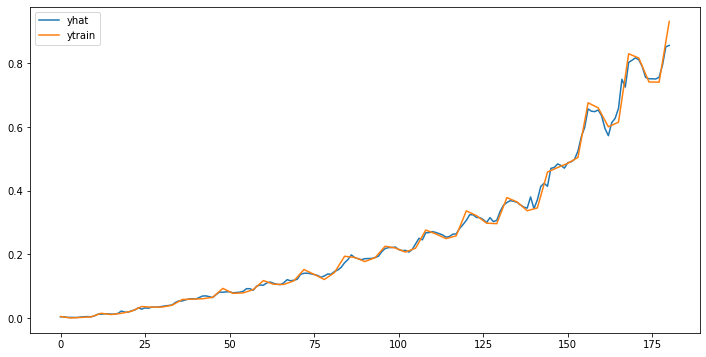

In [112]:
yhat_plot.plot(kind='line', legend=True)
ytrain_plot.plot(kind='line', legend=True)

#### Lasso Regression

In [123]:
tscv = TimeSeriesSplit() 
print(tscv)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
model_lasso = Lasso(alpha=0.01)
alphas = np.array([5, 0.5, 0.05, 0.005, 0.0005, 1, 0.1, 0.01, 0.001, 0.0001])
clf = RandomizedSearchCV(model_lasso, dict(alpha=alphas), random_state=0, cv = tscv)
search = clf.fit(df, y)
search.best_params_

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.015e-03, tolerance: 1.553e-04
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.018e-02, tolerance: 6.166e-04
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

{'alpha': 0.001}

In [124]:
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.10, random_state=0, shuffle=False)

In [125]:
model = Lasso(alpha=0.001)
search = model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.174e-01, tolerance: 1.002e-03
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [126]:
yhat_train = model.predict(X_train)
mean_squared_error(y_train, yhat_train)

0.0017550833598035552

In [127]:
yhat_test = model.predict(X_test)
mean_squared_error(y_test, yhat_test)

0.008585181371222269

In [128]:
yhat_plot = pd.Series(data=yhat_train, name='yhat')
ytrain_plot = pd.Series(data=y_train.reshape(-1), name='ytrain')

In [129]:
yhatTest_plot = pd.Series(data=yhat_test, name='yhatTest')
ytest_plot = pd.Series(data=y_test.reshape(-1), name='ytest')

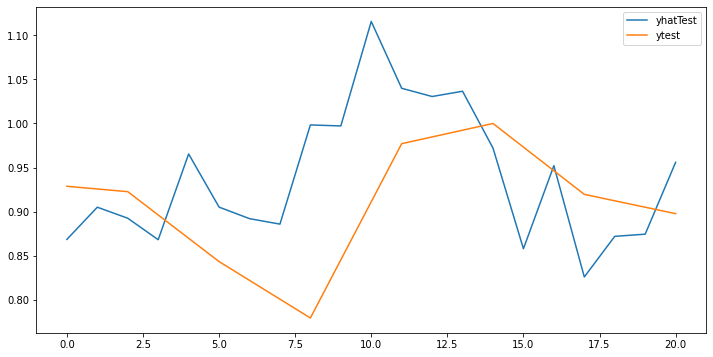

In [130]:
yhatTest_plot.plot(kind='line', legend=True)
ytest_plot.plot(kind='line', legend=True)

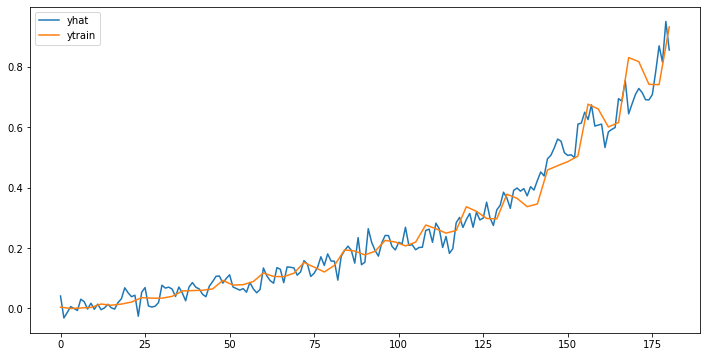

In [131]:
yhat_plot.plot(kind='line', legend=True)
ytrain_plot.plot(kind='line', legend=True)

### Using PCA

#### Random Forest Regressor

https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

In [137]:
tscv = TimeSeriesSplit() 
print(tscv)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
model = RandomForestRegressor(n_estimators = 10, random_state = 0)
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
  # Number of features to consider at every split
max_features = ['auto', 'sqrt']
  # Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
  # Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
  # Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
  # Method of selecting samples for training each tree
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
                'max_features': max_features,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf,
                'bootstrap': bootstrap}
clf = RandomizedSearchCV(model, random_grid, random_state=0, cv = tscv)
search = clf.fit(x, y)
search.best_params_

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

{'n_estimators': 800,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': True}

In [138]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.10, random_state=0, shuffle=False)

In [139]:
model = RandomForestRegressor(n_estimators= 800, min_samples_split= 2, min_samples_leaf= 2,max_features= 'auto', max_depth= 100, bootstrap= True, random_state=0)
model

RandomForestRegressor(max_depth=100, min_samples_leaf=2, n_estimators=800,
                      random_state=0)

In [140]:
search = model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


In [141]:
yhat_train = model.predict(X_train)
mean_squared_error(y_train, yhat_train)

0.008947257114752988

In [142]:
yhat_test = model.predict(X_test)
mean_squared_error(y_test, yhat_test)

0.30816959147679474

In [143]:
yhat_plot = pd.Series(data=yhat_train, name='yhat')
ytrain_plot = pd.Series(data=y_train.reshape(-1), name='ytrain')

In [144]:
yhatTest_plot = pd.Series(data=yhat_test, name='yhatTest')
ytest_plot = pd.Series(data=y_test.reshape(-1), name='ytest')

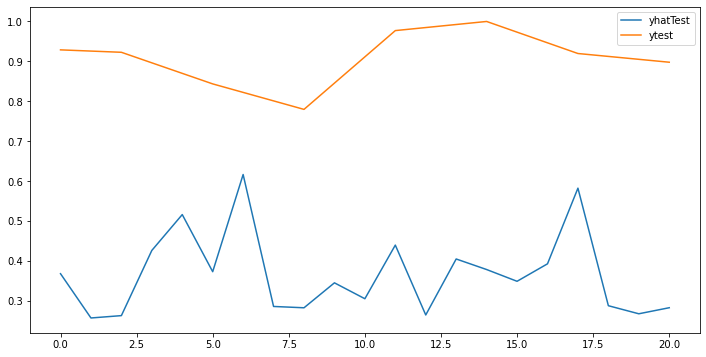

In [145]:
yhatTest_plot.plot(kind='line', legend=True)
ytest_plot.plot(kind='line', legend=True)

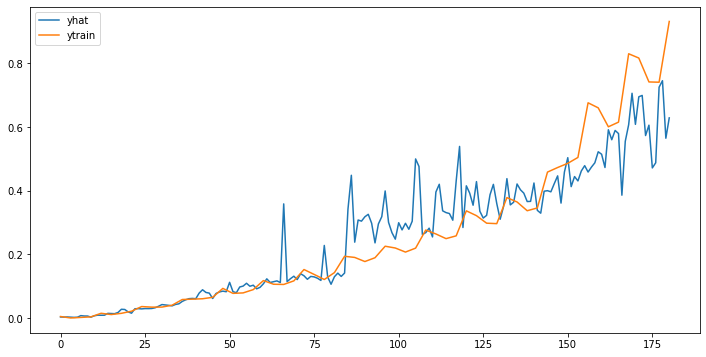

In [147]:
yhat_plot.plot(kind='line', legend=True)
ytrain_plot.plot(kind='line', legend=True)

#### Lasso Regression

In [148]:
tscv = TimeSeriesSplit() 
print(tscv)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
model_lasso = Lasso(alpha=0.01)
alphas = np.array([5, 0.5, 0.05, 0.005, 0.0005, 1, 0.1, 0.01, 0.001, 0.0001])
clf = RandomizedSearchCV(model_lasso, dict(alpha=alphas), random_state=0, cv = tscv)
search = clf.fit(x, y)
search.best_params_

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


{'alpha': 0.0001}

In [149]:
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.10, random_state=0, shuffle=False)

In [151]:
model = Lasso(alpha=0.0001)
search = model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.537e-01, tolerance: 1.002e-03
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [152]:
yhat_train = model.predict(X_train)
mean_squared_error(y_train, yhat_train)

0.0017583160500821641

In [153]:
yhat_test = model.predict(X_test)
mean_squared_error(y_test, yhat_test)

0.008666991537802827

In [154]:
yhat_plot = pd.Series(data=yhat_train, name='yhat')
ytrain_plot = pd.Series(data=y_train.reshape(-1), name='ytrain')

In [155]:
yhatTest_plot = pd.Series(data=yhat_test, name='yhatTest')
ytest_plot = pd.Series(data=y_test.reshape(-1), name='ytest')

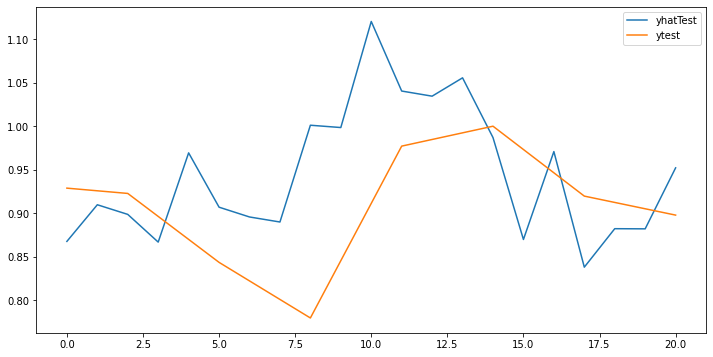

In [156]:
yhatTest_plot.plot(kind='line', legend=True)
ytest_plot.plot(kind='line', legend=True)

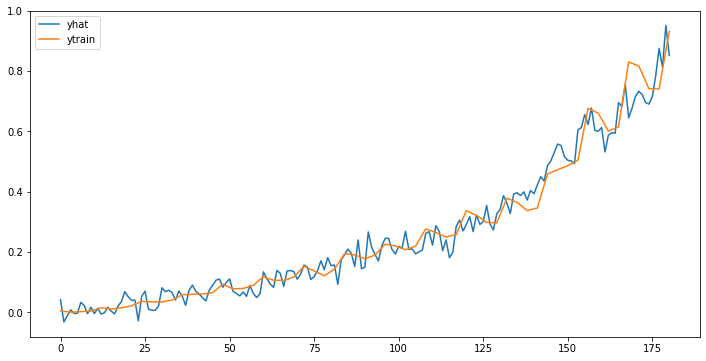

In [157]:
yhat_plot.plot(kind='line', legend=True)
ytrain_plot.plot(kind='line', legend=True)

### Using log transformed and differenced data

In [158]:
differenced_data

,Arts & Entertainment,Autos & Vehicles,Beauty & Fitness,Books & Literature,Business & Industrial,Computers & Electronics,Finance,Food & Drink,Games,Health,...,News,Online Communities,People & Society,Pets & Animals,Real Estate,Reference,Science,Shopping,Sports,Travel
date,,,,,,,,,,,,,,,,,,,,,
2004-01-01,1.945910,0.000000,1.945910,2.944439,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.079442,0.000000,2.302585,2.302585,1.791759,0.000000,0.000000,0.000000,0.000000,0.000000
2004-02-01,1.945910,0.470004,1.945910,2.890372,0.000000,0.159065,-0.405465,0.000000,0.000000,0.000000,...,1.945910,0.000000,2.197225,1.945910,1.791759,-0.117783,0.331357,0.000000,0.000000,0.074108
2004-03-01,2.079442,-0.603535,2.079442,3.295837,0.367725,0.137201,0.405465,0.000000,0.000000,0.287682,...,2.302585,0.405465,2.564949,1.945910,1.386294,0.223144,0.050010,0.143101,0.000000,0.251314
2004-04-01,2.079442,0.384846,2.302585,3.367296,-0.262364,-0.137201,-0.182322,0.133531,0.223144,0.080043,...,2.197225,-0.405465,2.564949,2.484907,1.609438,0.095310,-0.102654,-0.068993,0.000000,-0.117783
2004-05-01,2.079442,-0.502629,2.197225,3.258097,0.000000,0.057158,0.000000,0.000000,-0.446287,-0.262364,...,2.302585,0.000000,2.484907,1.609438,2.079442,0.087011,0.000000,0.194156,0.000000,-0.207639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-01,3.951244,0.008230,4.564348,4.454347,0.032790,0.048790,0.113944,-0.045985,-0.088904,0.020203,...,3.891820,-0.046520,4.317488,4.174387,4.304065,0.044951,0.051293,0.081917,-0.410580,0.089612
2021-07-01,4.043051,-0.129571,4.605170,4.430817,0.052368,-0.032261,0.030305,0.045985,0.131463,-0.105361,...,3.951244,-0.095310,4.382027,4.127134,4.356709,-0.104140,-0.207639,0.065241,0.244453,0.145954
2021-08-01,3.988984,0.139186,4.595120,4.430817,0.020203,0.016261,-0.045810,-0.011300,-0.174023,0.085158,...,3.931826,0.095310,4.382027,4.234107,4.430817,0.059189,0.169418,-0.010582,0.069796,0.059898


In [159]:
differenced_data.drop(index=differenced_data.index[202:], axis=1, inplace=True)


#### Random Forest Regressor

In [160]:
tscv = TimeSeriesSplit() 
print(tscv)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
model = RandomForestRegressor(n_estimators = 10, random_state = 0)
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
  # Number of features to consider at every split
max_features = ['auto', 'sqrt']
  # Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
  # Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
  # Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
  # Method of selecting samples for training each tree
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
                'max_features': max_features,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf,
                'bootstrap': bootstrap}
clf = RandomizedSearchCV(model, random_grid, random_state=0, cv = tscv)
search = clf.fit(differenced_data, y)
search.best_params_

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

{'n_estimators': 800,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': True}

In [166]:
X_train, X_test, y_train, y_test = train_test_split(differenced_data, y, test_size=0.10, random_state=0, shuffle=False)

In [167]:
model = RandomForestRegressor(n_estimators= 800, min_samples_split= 2, min_samples_leaf= 2,max_features= 'auto', max_depth= 100, bootstrap= True, random_state=0)
model

RandomForestRegressor(max_depth=100, min_samples_leaf=2, n_estimators=800,
                      random_state=0)

In [168]:
search = model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


In [169]:
yhat_train = model.predict(X_train)
mean_squared_error(y_train, yhat_train)

0.00034442600264752136

In [170]:
yhat_test = model.predict(X_test)
mean_squared_error(y_test, yhat_test)

0.03518499106830949

In [171]:
yhat_plot = pd.Series(data=yhat_train, name='yhat')
ytrain_plot = pd.Series(data=y_train.reshape(-1), name='ytrain')

In [172]:
yhatTest_plot = pd.Series(data=yhat_test, name='yhatTest')
ytest_plot = pd.Series(data=y_test.reshape(-1), name='ytest')

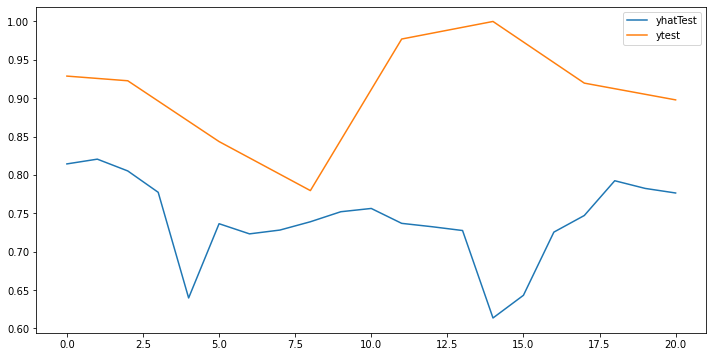

In [173]:
yhatTest_plot.plot(kind='line', legend=True)
ytest_plot.plot(kind='line', legend=True)

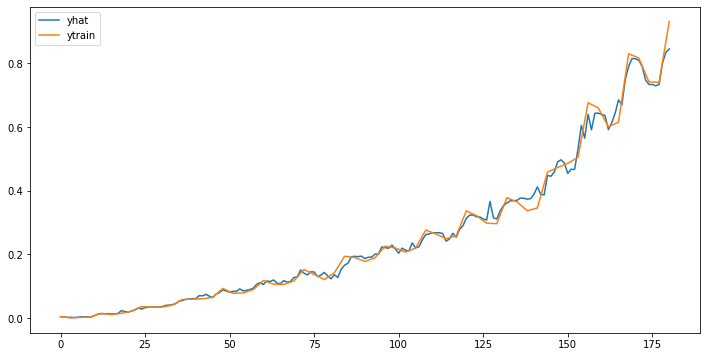

In [174]:
yhat_plot.plot(kind='line', legend=True)
ytrain_plot.plot(kind='line', legend=True)

#### Lasso Regression

In [175]:
tscv = TimeSeriesSplit() 
print(tscv)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
model_lasso = Lasso(alpha=0.01)
alphas = np.array([5, 0.5, 0.05, 0.005, 0.0005, 1, 0.1, 0.01, 0.001, 0.0001])
clf = RandomizedSearchCV(model_lasso, dict(alpha=alphas), random_state=0, cv = tscv)
search = clf.fit(differenced_data, y)
search.best_params_

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)


{'alpha': 0.0001}

In [177]:
X_train, X_test, y_train, y_test = train_test_split(differenced_data, y, test_size=0.10, random_state=0, shuffle=False)

In [178]:
model = Lasso(alpha=0.0001)
search = model.fit(X_train, y_train)

In [179]:
yhat_train = model.predict(X_train)
mean_squared_error(y_train, yhat_train)

0.005002522933175922

In [180]:
yhat_test = model.predict(X_test)
mean_squared_error(y_test, yhat_test)

0.04021873339002775

In [181]:
yhat_plot = pd.Series(data=yhat_train, name='yhat')
ytrain_plot = pd.Series(data=y_train.reshape(-1), name='ytrain')

In [182]:
yhatTest_plot = pd.Series(data=yhat_test, name='yhatTest')
ytest_plot = pd.Series(data=y_test.reshape(-1), name='ytest')

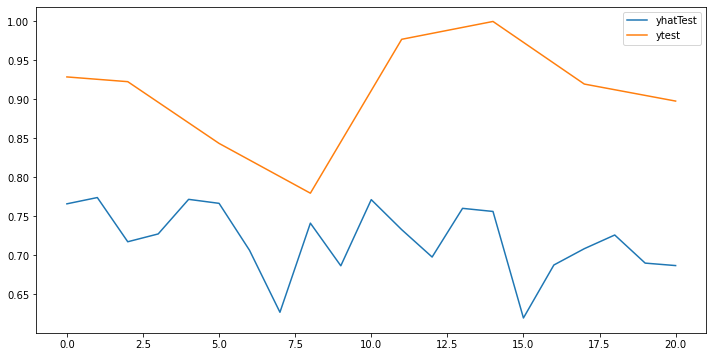

In [183]:
yhatTest_plot.plot(kind='line', legend=True)
ytest_plot.plot(kind='line', legend=True)

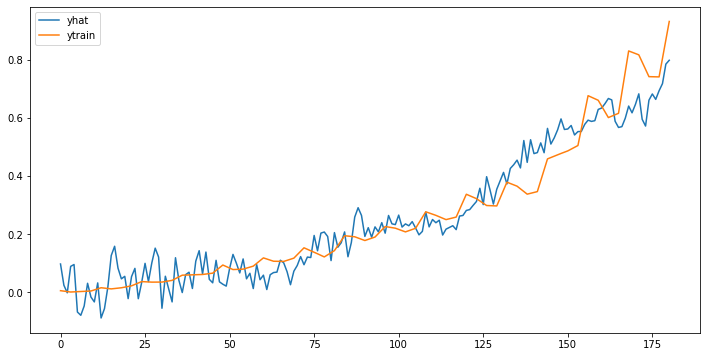

In [184]:
yhat_plot.plot(kind='line', legend=True)
ytrain_plot.plot(kind='line', legend=True)